<a href="https://www.kaggle.com/code/mesutssmn/house-price-prediction?scriptVersionId=188566664" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

<div style="border-radius: 40px; border: #5E5772 solid; padding: 12px; background-color: #2995; font-size: 150%; text-align: left;">

<h3 align="center"><font color='#30000' size=120%>House Price Prediction</font></h3>

    
<h4 align="left"><font color='#30000' size=5%>To Do :</font></h4>
    
<li> Cleaning dataset for classification</li>
    
<li> Some analysis and statistics</li>
    
<li> ML, ANN
    
    

<h3 align="left"><font color='#300000' size=5%>ABOUT DATA:</font></h3>

This dataset is related to housing prices in Ames, Iowa, and is designed to facilitate predictive modeling of property sale prices. It includes comprehensive information about various attributes of residential homes, covering aspects such as the physical characteristics of the properties, their quality and condition, and their geographical locations within the city. The dataset comprises several files: train.csv for training the model, test.csv for testing, and a sample_submission.csv which provides a benchmark prediction model based on a linear regression. The columns range from basic information like lot area and number of bedrooms to more specific details like the quality of the basement and type of garage. The target variable to be predicted is the SalePrice, representing the sale price of the property in dollars. The data description file provides detailed explanations of each column, assisting in the understanding and preprocessing of the dataset for predictive analytics.
    

<div style="border-radius: 10px; overflow: hidden; text-align: center;">
    <img src="https://www.essential-business.pt/wp-content/uploads/2024/05/housingcosts-1024x626-1.jpg" alt="Price" width="900"></div>

<div style="border-radius: 10px; overflow: hidden; text-align: left;">
    <img src="https://media.istockphoto.com/id/1320991884/photo/aerial-view-of-residential-distratic-at-major-mackenzie-dr-and-islinton-ave-detached-and.jpg?s=612x612&w=0&k=20&c=KY59fkCfg9zz9LkQRCRDn84j9xcNdG7NSgZ3jGJC81A=" alt="Price" width="900"></div>
</div>

   ##### Thank you for taking the time to read. Please don't ignore voting.

# <div style="border-radius:10px; border:#5E5772 solid; padding: 12px; background-color: #2995; font-size:100%; font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> LINKS </div>

#### **Name :** Mesut Suhan Şişman

<div style="text-align: left;">
    <table>
        <tr>
            <th><b>Links</b></th>
        </tr>
        <tr>
        </tr>
        <tr>
            <td>GitHub</td>
            <td><a href="https://github.com/Mesutssmn"><img src="https://img.shields.io/badge/GitHub-Profile-blue?style=for-the-badge&logo=github" alt="GitHub"/></a></td>
        </tr>
        <tr>
            <td>LinkedIn</td>
            <td><a href="https://www.linkedin.com/in/mesut-suhan-sisman/"><img src="https://img.shields.io/badge/LinkedIn-Profile-blue?style=for-the-badge&logo=linkedin" alt="LinkedIn"/></a></td>
        </tr>
        <tr>
        </tr>
        <tr>
    </table>

# <div style="border-radius:10px; border:#5E5772 solid; padding: 12px; background-color: #2995; font-size:100%; font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> IMPORTS </div>

In [1]:
# Base Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Data Analysis Libraries
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.preprocessing import MinMaxScaler,StandardScaler, RobustScaler, LabelEncoder, OneHotEncoder
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, cross_val_score,GridSearchCV, KFold, RandomizedSearchCV
from sklearn.utils import class_weight
from imblearn.over_sampling import SMOTE
from sklearn.metrics import make_scorer, classification_report,confusion_matrix
import scipy.stats as stats
from scipy.stats import shapiro, levene, kruskal

# Machine Learning Libraries
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.exceptions import ConvergenceWarning
from sklearn.svm import SVR
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
# Deep Learning Libraries
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/dask/dataframe/_pyarrow_compat.py:23: UserWarning: You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=CVE-2023-47248 for further details. Please upgrade to pyarrow>=14.0.1 or install pyarrow-hotfix to patch your current version.
  warnings.warn(


In [2]:
pd.set_option('display.max_columns', 300)
#pd.set_option('display.max_rows', 10000)
pd.set_option('display.width', 250)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# <div style="border-radius:10px; border:#5E5772 solid; padding: 12px; background-color: #2995; font-size:100%; font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> LOADING DATA </div>

In [3]:
train = pd.read_csv("/kaggle/input/house-prices-advanced-regression-techniques/train.csv")
test = pd.read_csv("/kaggle/input/house-prices-advanced-regression-techniques/test.csv")
df = pd.concat([train, test], ignore_index=True).reset_index(drop=True)
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856,854,0,1710,1.000,0.000,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.000
1,2,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.000,1.000,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.000
2,3,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920,866,0,1786,1.000,0.000,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.000
3,4,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961,756,0,1717,1.000,0.000,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.000
4,5,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.000,0.000,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.000


In [4]:
df.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
2914,2915,160,RM,21.000,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,4,7,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Unf,0.000,Unf,0.000,546.000,546.000,GasA,Gd,Y,SBrkr,546,546,0,1092,0.000,0.000,1,1,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal,NaN
2915,2916,160,RM,21.000,1894,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,4,5,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Rec,252.000,Unf,0.000,294.000,546.000,GasA,TA,Y,SBrkr,546,546,0,1092,0.000,0.000,1,1,3,1,TA,6,Typ,0,NaN,CarPort,1970.000,Unf,1.000,286.000,TA,TA,Y,0,24,0,0,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml,NaN
2916,2917,20,RL,160.000,20000,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,7,1960,1996,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,CBlock,TA,TA,No,ALQ,1224.000,Unf,0.000,0.000,1224.000,GasA,Ex,Y,SBrkr,1224,0,0,1224,1.000,0.000,1,0,4,1,TA,7,Typ,1,TA,Detchd,1960.000,Unf,2.000,576.000,TA,TA,Y,474,0,0,0,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml,NaN
2917,2918,85,RL,62.000,10441,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,SFoyer,5,5,1992,1992,Gable,CompShg,HdBoard,Wd Shng,NaN,0.000,TA,TA,PConc,Gd,TA,Av,GLQ,337.000,Unf,0.000,575.000,912.000,GasA,TA,Y,SBrkr,970,0,0,970,0.000,1.000,1,0,3,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,Y,80,32,0,0,0,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal,NaN
2918,2919,60,RL,74.000,9627,Pave,NaN,Reg,Lvl,AllPub,Inside,Mod,Mitchel,Norm,Norm,1Fam,2Story,7,5,1993,1994,Gable,CompShg,HdBoard,HdBoard,BrkFace,94.000,TA,TA,PConc,Gd,TA,Av,LwQ,758.000,Unf,0.000,238.000,996.000,GasA,Ex,Y,SBrkr,996,1004,0,2000,0.000,0.000,2,1,3,1,TA,9,Typ,1,TA,Attchd,1993.000,Fin,3.000,650.000,TA,TA,Y,190,48,0,0,0,0,NaN,NaN,NaN,0,11,2006,WD,Normal,NaN


# <div style="border-radius:10px; border:#5E5772 solid; padding: 12px; background-color: #2995; font-size:100%; font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> FEATURES </div>

<div style="display: flex; justify-content: space-between; background-color: #f0f0f0; padding: 20px; font-family: Arial, sans-serif;">
  <div style="width: 30%; background-color: #e6f3ff; padding: 15px; border-radius: 10px;">
    <p style="color: #333;"><strong style="color: #0066cc;">SalePrice</strong>: the property's sale price in dollars. This is the target variable that you're trying to predict.</p>
    <p style="color: #333;"><strong style="color: #0066cc;">MSSubClass</strong>: The building class</p>
    <p style="color: #333;"><strong style="color: #0066cc;">MSZoning</strong>: The general zoning classification</p>
    <p style="color: #333;"><strong style="color: #0066cc;">LotFrontage</strong>: Linear feet of street connected to property</p>
    <p style="color: #333;"><strong style="color: #0066cc;">LotArea</strong>: Lot size in square feet</p>
    <p style="color: #333;"><strong style="color: #0066cc;">Street</strong>: Type of road access</p>
    <p style="color: #333;"><strong style="color: #0066cc;">Alley</strong>: Type of alley access</p>
    <p style="color: #333;"><strong style="color: #0066cc;">LotShape</strong>: General shape of property</p>
    <p style="color: #333;"><strong style="color: #0066cc;">LandContour</strong>: Flatness of the property</p>
    <p style="color: #333;"><strong style="color: #0066cc;">Utilities</strong>: Type of utilities available</p>
    <p style="color: #333;"><strong style="color: #0066cc;">LotConfig</strong>: Lot configuration</p>
    <p style="color: #333;"><strong style="color: #0066cc;">LandSlope</strong>: Slope of property</p>
    <p style="color: #333;"><strong style="color: #0066cc;">Neighborhood</strong>: Physical locations within Ames city limits</p>
    <p style="color: #333;"><strong style="color: #0066cc;">Condition1</strong>: Proximity to main road or railroad</p>
    <p style="color: #333;"><strong style="color: #0066cc;">Condition2</strong>: Proximity to main road or railroad (if a second is present)</p>
    <p style="color: #333;"><strong style="color: #0066cc;">BldgType</strong>: Type of dwelling</p>
    <p style="color: #333;"><strong style="color: #0066cc;">HouseStyle</strong>: Style of dwelling</p>
    <p style="color: #333;"><strong style="color: #0066cc;">OverallQual</strong>: Overall material and finish quality</p>
    <p style="color: #333;"><strong style="color: #0066cc;">OverallCond</strong>: Overall condition rating</p>
    <p style="color: #333;"><strong style="color: #0066cc;">YearBuilt</strong>: Original construction date</p>
    <p style="color: #333;"><strong style="color: #0066cc;">YearRemodAdd</strong>: Remodel date</p>
    <p style="color: #333;"><strong style="color: #0066cc;">RoofStyle</strong>: Type of roof</p>
    <p style="color: #333;"><strong style="color: #0066cc;">RoofMatl</strong>: Roof material</p>
    <p style="color: #333;"><strong style="color: #0066cc;">Exterior1st</strong>: Exterior covering on house</p>
    <p style="color: #333;"><strong style="color: #0066cc;">Exterior2nd</strong>: Exterior covering on house (if more than one material)</p>
  </div>
  
  <div style="width: 30%; background-color: #fff0e6; padding: 15px; border-radius: 10px;">
    <p style="color: #333;"><strong style="color: #cc6600;">MasVnrType</strong>: Masonry veneer type</p>
    <p style="color: #333;"><strong style="color: #cc6600;">MasVnrArea</strong>: Masonry veneer area in square feet</p>
    <p style="color: #333;"><strong style="color: #cc6600;">ExterQual</strong>: Exterior material quality</p>
    <p style="color: #333;"><strong style="color: #cc6600;">ExterCond</strong>: Present condition of the material on the exterior</p>
    <p style="color: #333;"><strong style="color: #cc6600;">Foundation</strong>: Type of foundation</p>
    <p style="color: #333;"><strong style="color: #cc6600;">BsmtQual</strong>: Height of the basement</p>
    <p style="color: #333;"><strong style="color: #cc6600;">BsmtCond</strong>: General condition of the basement</p>
    <p style="color: #333;"><strong style="color: #cc6600;">BsmtExposure</strong>: Walkout or garden level basement walls</p>
    <p style="color: #333;"><strong style="color: #cc6600;">BsmtFinType1</strong>: Quality of basement finished area</p>
    <p style="color: #333;"><strong style="color: #cc6600;">BsmtFinSF1</strong>: Type 1 finished square feet</p>
    <p style="color: #333;"><strong style="color: #cc6600;">BsmtFinType2</strong>: Quality of second finished area (if present)</p>
    <p style="color: #333;"><strong style="color: #cc6600;">BsmtFinSF2</strong>: Type 2 finished square feet</p>
    <p style="color: #333;"><strong style="color: #cc6600;">BsmtUnfSF</strong>: Unfinished square feet of basement area</p>
    <p style="color: #333;"><strong style="color: #cc6600;">TotalBsmtSF</strong>: Total square feet of basement area</p>
    <p style="color: #333;"><strong style="color: #cc6600;">Heating</strong>: Type of heating</p>
    <p style="color: #333;"><strong style="color: #cc6600;">HeatingQC</strong>: Heating quality and condition</p>
    <p style="color: #333;"><strong style="color: #cc6600;">CentralAir</strong>: Central air conditioning</p>
    <p style="color: #333;"><strong style="color: #cc6600;">Electrical</strong>: Electrical system</p>
    <p style="color: #333;"><strong style="color: #cc6600;">1stFlrSF</strong>: First Floor square feet</p>
    <p style="color: #333;"><strong style="color: #cc6600;">2ndFlrSF</strong>: Second floor square feet</p>
    <p style="color: #333;"><strong style="color: #cc6600;">LowQualFinSF</strong>: Low quality finished square feet (all floors)</p>
    <p style="color: #333;"><strong style="color: #cc6600;">GrLivArea</strong>: Above grade (ground) living area square feet</p>
    <p style="color: #333;"><strong style="color: #cc6600;">BsmtFullBath</strong>: Basement full bathrooms</p>
    <p style="color: #333;"><strong style="color: #cc6600;">BsmtHalfBath</strong>: Basement half bathrooms</p>
    <p style="color: #333;"><strong style="color: #cc6600;">FullBath</strong>: Full bathrooms above grade</p>
  </div>
  
  <div style="width: 30%; background-color: #e6ffe6; padding: 15px; border-radius: 10px;">
    <p style="color: #333;"><strong style="color: #006600;">HalfBath</strong>: Half baths above grade</p>
    <p style="color: #333;"><strong style="color: #006600;">Bedroom</strong>: Number of bedrooms above basement level</p>
    <p style="color: #333;"><strong style="color: #006600;">Kitchen</strong>: Number of kitchens</p>
    <p style="color: #333;"><strong style="color: #006600;">KitchenQual</strong>: Kitchen quality</p>
    <p style="color: #333;"><strong style="color: #006600;">TotRmsAbvGrd</strong>: Total rooms above grade (does not include bathrooms)</p>
    <p style="color: #333;"><strong style="color: #006600;">Functional</strong>: Home functionality rating</p>
    <p style="color: #333;"><strong style="color: #006600;">Fireplaces</strong>: Number of fireplaces</p>
    <p style="color: #333;"><strong style="color: #006600;">FireplaceQu</strong>: Fireplace quality</p>
    <p style="color: #333;"><strong style="color: #006600;">GarageType</strong>: Garage location</p>
    <p style="color: #333;"><strong style="color: #006600;">GarageYrBlt</strong>: Year garage was built</p>
    <p style="color: #333;"><strong style="color: #006600;">GarageFinish</strong>: Interior finish of the garage</p>
    <p style="color: #333;"><strong style="color: #006600;">GarageCars</strong>: Size of garage in car capacity</p>
    <p style="color: #333;"><strong style="color: #006600;">GarageArea</strong>: Size of garage in square feet</p>
    <p style="color: #333;"><strong style="color: #006600;">GarageQual</strong>: Garage quality</p>
    <p style="color: #333;"><strong style="color: #006600;">GarageCond</strong>: Garage condition</p>
    <p style="color: #333;"><strong style="color: #006600;">PavedDrive</strong>: Paved driveway</p>
    <p style="color: #333;"><strong style="color: #006600;">WoodDeckSF</strong>: Wood deck area in square feet</p>
    <p style="color: #333;"><strong style="color: #006600;">OpenPorchSF</strong>: Open porch area in square feet</p>
    <p style="color: #333;"><strong style="color: #006600;">EnclosedPorch</strong>: Enclosed porch area in square feet</p>
    <p style="color: #333;"><strong style="color: #006600;">3SsnPorch</strong>: Three season porch area in square feet</p>
    <p style="color: #333;"><strong style="color: #006600;">ScreenPorch</strong>: Screen porch area in square feet</p>
    <p style="color: #333;"><strong style="color: #006600;">PoolArea</strong>: Pool area in square feet</p>
    <p style="color: #333;"><strong style="color: #006600;">PoolQC</strong>: Pool quality</p>
    <p style="color: #333;"><strong style="color: #006600;">Fence</strong>: Fence quality</p>
    <p style="color: #333;"><strong style="color: #006600;">MiscFeature</strong>: Miscellaneous feature not covered in other categories</p>
    <p style="color: #333;"><strong style="color: #006600;">MiscVal</strong>: Value of miscellaneous feature</p>
    <p style="color: #333;"><strong style="color: #006600;">MoSold</strong>: Month Sold</p>
    <p style="color: #333;"><strong style="color: #006600;">YrSold</strong>: Year Sold</p>
    <p style="color: #333;"><strong style="color: #006600;">SaleType</strong>: Type of sale</p>
    <p style="color: #333;"><strong style="color: #006600;">SaleCondition</strong>: Condition of sale</p>
  </div>
</div>

# <div style="border-radius:10px; border:#5E5772 solid; padding: 12px; background-color: #2995; font-size:100%; font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> DATA INFORMATION </div>

In [5]:
df["SalePrice"].isna().sum()

1459

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,2919.000,1460.000,842.787,1.000,730.500,1460.000,2189.500,2919.000
MSSubClass,2919.000,57.138,42.518,20.000,20.000,50.000,70.000,190.000
LotFrontage,2433.000,69.306,23.345,21.000,59.000,68.000,80.000,313.000
LotArea,2919.000,10168.114,7886.996,1300.000,7478.000,9453.000,11570.000,215245.000
OverallQual,2919.000,6.089,1.410,1.000,5.000,6.000,7.000,10.000
OverallCond,2919.000,5.565,1.113,1.000,5.000,5.000,6.000,9.000
YearBuilt,2919.000,1971.313,30.291,1872.000,1953.500,1973.000,2001.000,2010.000
YearRemodAdd,2919.000,1984.264,20.894,1950.000,1965.000,1993.000,2004.000,2010.000
MasVnrArea,2896.000,102.201,179.334,0.000,0.000,0.000,164.000,1600.000
BsmtFinSF1,2918.000,441.423,455.611,0.000,0.000,368.500,733.000,5644.000


In [7]:
def check_df(dataframe):
    print("##################### Shape #####################")
    print(dataframe.shape)
    print("##################### Types #####################")
    print(dataframe.dtypes)
    print("##################### Head #####################")
    print(dataframe.head(3))
    print("##################### Tail #####################")
    print(dataframe.tail(3))
    print("##################### NA #####################")
    print(dataframe.isnull().sum())
    print("##################### Quantiles #####################")
    numeric_columns = dataframe.select_dtypes(include=['number']).columns
    print(dataframe[numeric_columns].quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)

In [8]:
check_df(df)

##################### Shape #####################
(2919, 81)
##################### Types #####################
Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice        float64
Length: 81, dtype: object
##################### Head #####################
   Id  MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape LandContour Utilities LotConfig LandSlope Neighborhood Condition1 Condition2 BldgType HouseStyle  OverallQual  OverallCond  YearBuilt  YearRemodAdd RoofStyle RoofMatl  \
0   1          60       RL       65.000     8450   Pave   NaN      Reg         Lvl    AllPub    Inside       Gtl      CollgCr       Norm       Norm     1Fam     2Story            7            5       2003          2003     Gable  CompShg   
1   2          20       RL       80.000     9600   Pave  

In [9]:
def grab_col_names(dataframe, cat_th=20, car_th=20):
    """
    grab_col_names for given dataframe

    :param dataframe:
    :param cat_th:
    :param car_th:
    :return:
    """
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]

    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]

    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]

    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')
    return cat_cols, cat_but_car, num_cols

In [10]:
cat_cols, cat_but_car, num_cols = grab_col_names(df)

Observations: 2919
Variables: 81
cat_cols: 57
num_cols: 23
cat_but_car: 1
num_but_cat: 15


# <div style="border-radius:10px; border:#5E5772 solid; padding: 12px; background-color: #2995; font-size:100%; font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> VISUALIZATION </div>

In [11]:
def cat_summary(dataframe, col_name, plot=False):
    summary_df = pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                               "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)})
    print("######################### *** #########################")
    print(summary_df)
    print("######################### *** #########################")
    if plot:
        fig, axs = plt.subplots(1, 4, figsize=(18, 5))
        counts = dataframe[col_name].value_counts()
        ratios = 100 * counts / len(dataframe)
        # Count Plot
        ax = sns.countplot(x=col_name, data=dataframe, ax=axs[0], order=counts.index)
        axs[0].set_title("Frequency of " + col_name)
        axs[0].tick_params(axis='x', rotation=90)
        for i, p in enumerate(ax.patches):
            height = p.get_height()
            ax.text(p.get_x() + p.get_width() / 2., height + 0.01 * max(counts),
                    f'{ratios.iloc[i]:.2f}%', 
                    ha="center", va="bottom",rotation = 60)
        # Pie Chart
        wedges, texts, autotexts = axs[1].pie(x=counts, autopct='%1.1f%%', textprops=dict(color="w"))
        axs[1].set_title("Pie chart of " + col_name)
        # Add legend to pie chart
        axs[1].legend(wedges, counts.index,
                      title=col_name,
                      loc="center left",
                      bbox_to_anchor=(1, 0, 0.5, 1))
        # Example of a Box Plot
        sns.boxplot(data=dataframe, x=col_name, y="SalePrice", ax=axs[2], order=counts.index)
        axs[2].set_title("SalePrice vs " + col_name)
        axs[2].tick_params(axis='x', rotation=90)
        # Another Box Plot
        sns.boxplot(data=dataframe, x=col_name, y="YearBuilt", ax=axs[3], order=counts.index)
        axs[3].set_title("YearBuilt vs " + col_name)
        axs[3].tick_params(axis='x', rotation=90)
        plt.tight_layout()
        plt.show()

######################### *** #########################
          MSZoning  Ratio
MSZoning                 
RL            2265 77.595
RM             460 15.759
FV             139  4.762
RH              26  0.891
C (all)         25  0.856
######################### *** #########################


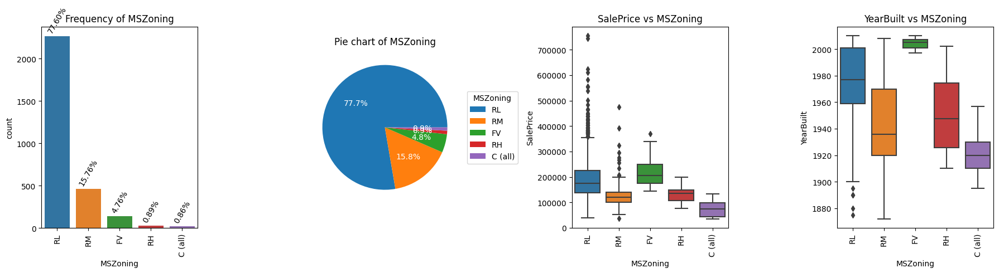

######################### *** #########################
        Street  Ratio
Street               
Pave      2907 99.589
Grvl        12  0.411
######################### *** #########################


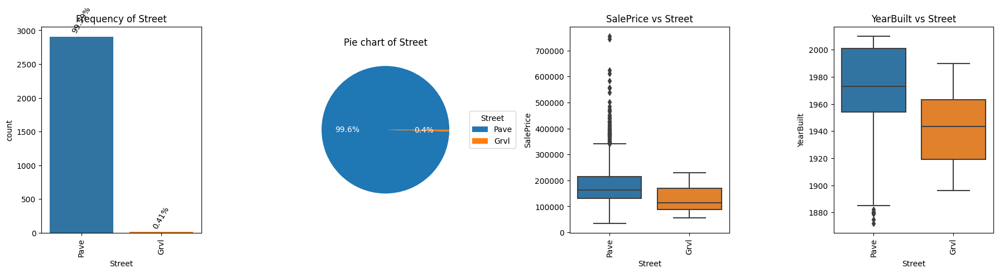

######################### *** #########################
       Alley  Ratio
Alley              
Grvl     120  4.111
Pave      78  2.672
######################### *** #########################


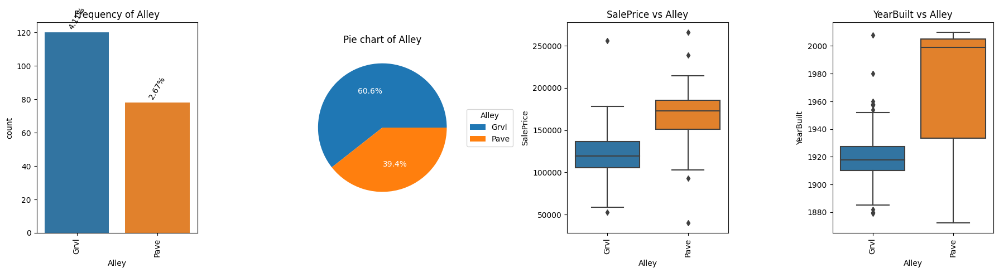

######################### *** #########################
          LotShape  Ratio
LotShape                 
Reg           1859 63.686
IR1            968 33.162
IR2             76  2.604
IR3             16  0.548
######################### *** #########################


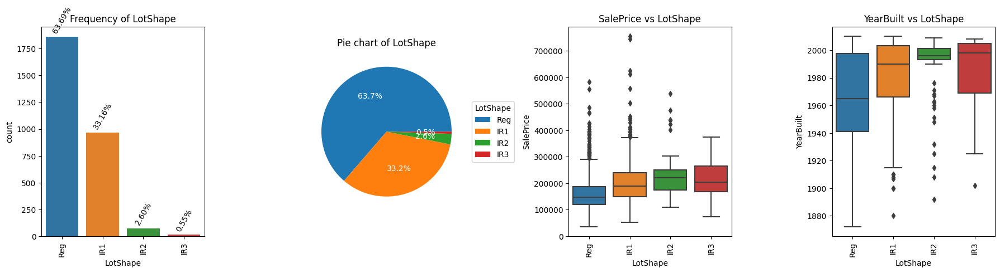

######################### *** #########################
             LandContour  Ratio
LandContour                    
Lvl                 2622 89.825
HLS                  120  4.111
Bnk                  117  4.008
Low                   60  2.055
######################### *** #########################


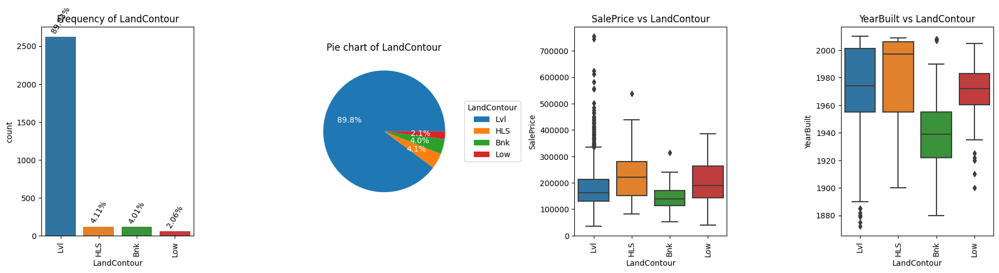

######################### *** #########################
           Utilities  Ratio
Utilities                  
AllPub          2916 99.897
NoSeWa             1  0.034
######################### *** #########################


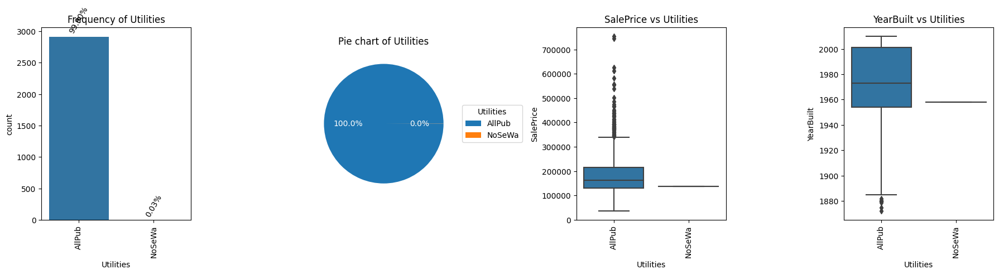

######################### *** #########################
           LotConfig  Ratio
LotConfig                  
Inside          2133 73.073
Corner           511 17.506
CulDSac          176  6.029
FR2               85  2.912
FR3               14  0.480
######################### *** #########################


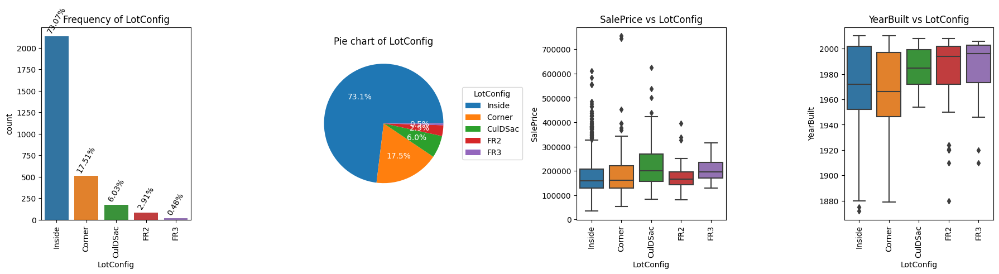

######################### *** #########################
           LandSlope  Ratio
LandSlope                  
Gtl             2778 95.170
Mod              125  4.282
Sev               16  0.548
######################### *** #########################


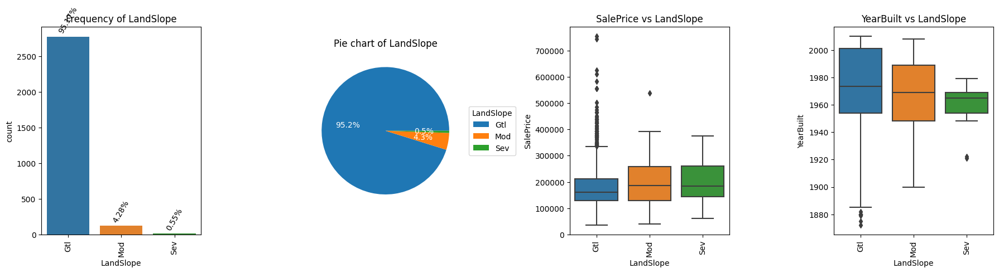

######################### *** #########################
            Condition1  Ratio
Condition1                   
Norm              2511 86.023
Feedr              164  5.618
Artery              92  3.152
RRAn                50  1.713
PosN                39  1.336
RRAe                28  0.959
PosA                20  0.685
RRNn                 9  0.308
RRNe                 6  0.206
######################### *** #########################


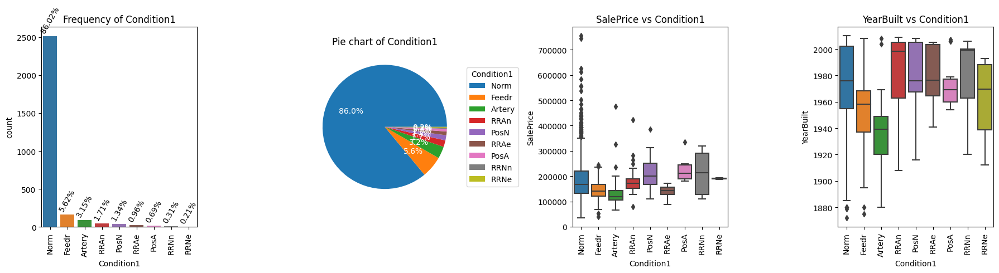

######################### *** #########################
            Condition2  Ratio
Condition2                   
Norm              2889 98.972
Feedr               13  0.445
Artery               5  0.171
PosN                 4  0.137
PosA                 4  0.137
RRNn                 2  0.069
RRAn                 1  0.034
RRAe                 1  0.034
######################### *** #########################


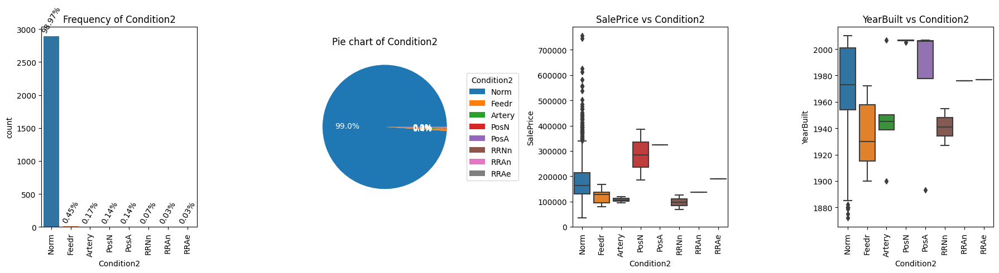

######################### *** #########################
          BldgType  Ratio
BldgType                 
1Fam          2425 83.076
TwnhsE         227  7.777
Duplex         109  3.734
Twnhs           96  3.289
2fmCon          62  2.124
######################### *** #########################


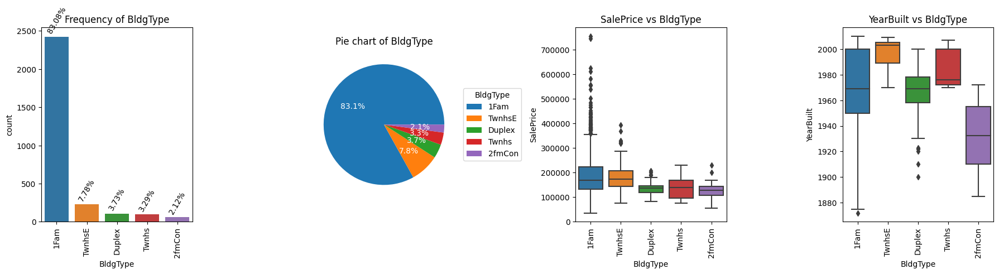

######################### *** #########################
            HouseStyle  Ratio
HouseStyle                   
1Story            1471 50.394
2Story             872 29.873
1.5Fin             314 10.757
SLvl               128  4.385
SFoyer              83  2.843
2.5Unf              24  0.822
1.5Unf              19  0.651
2.5Fin               8  0.274
######################### *** #########################


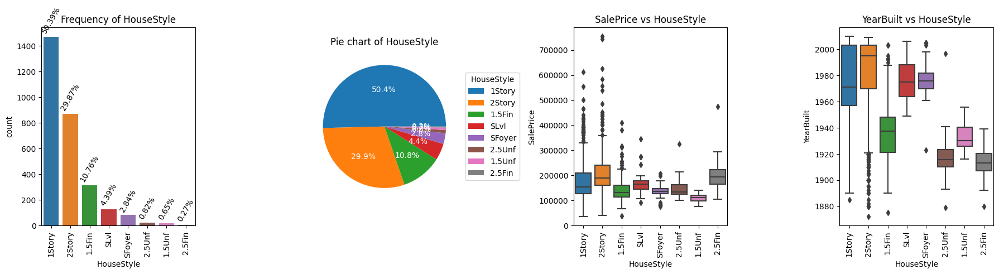

######################### *** #########################
           RoofStyle  Ratio
RoofStyle                  
Gable           2310 79.137
Hip              551 18.876
Gambrel           22  0.754
Flat              20  0.685
Mansard           11  0.377
Shed               5  0.171
######################### *** #########################


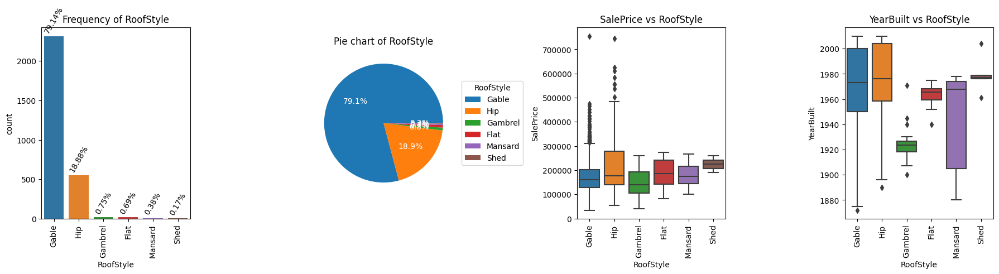

######################### *** #########################
          RoofMatl  Ratio
RoofMatl                 
CompShg       2876 98.527
Tar&Grv         23  0.788
WdShake          9  0.308
WdShngl          7  0.240
Metal            1  0.034
Membran          1  0.034
Roll             1  0.034
ClyTile          1  0.034
######################### *** #########################


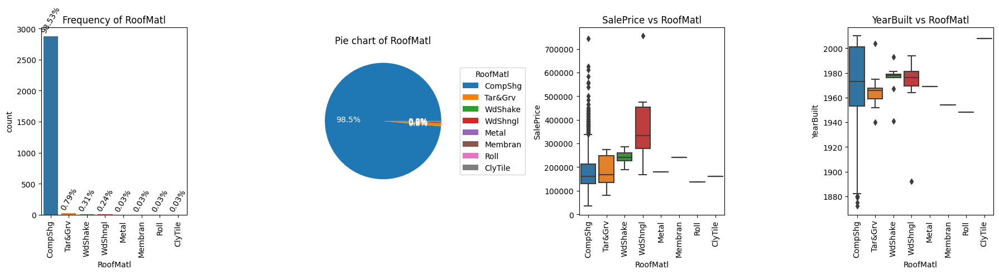

######################### *** #########################
             Exterior1st  Ratio
Exterior1st                    
VinylSd             1025 35.115
MetalSd              450 15.416
HdBoard              442 15.142
Wd Sdng              411 14.080
Plywood              221  7.571
CemntBd              126  4.317
BrkFace               87  2.980
WdShing               56  1.918
AsbShng               44  1.507
Stucco                43  1.473
BrkComm                6  0.206
AsphShn                2  0.069
Stone                  2  0.069
CBlock                 2  0.069
ImStucc                1  0.034
######################### *** #########################


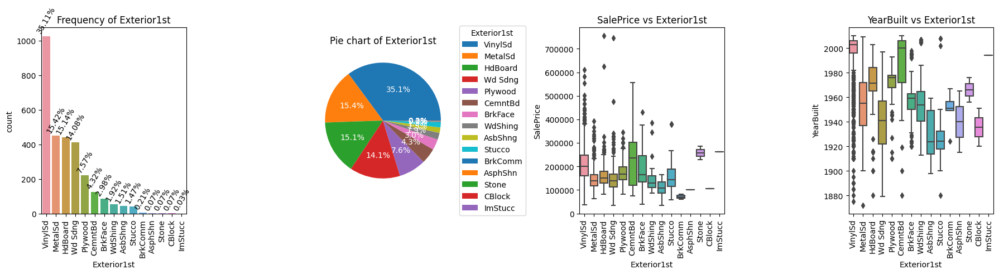

######################### *** #########################
             Exterior2nd  Ratio
Exterior2nd                    
VinylSd             1014 34.738
MetalSd              447 15.313
HdBoard              406 13.909
Wd Sdng              391 13.395
Plywood              270  9.250
CmentBd              126  4.317
Wd Shng               81  2.775
BrkFace               47  1.610
Stucco                47  1.610
AsbShng               38  1.302
Brk Cmn               22  0.754
ImStucc               15  0.514
Stone                  6  0.206
AsphShn                4  0.137
CBlock                 3  0.103
Other                  1  0.034
######################### *** #########################


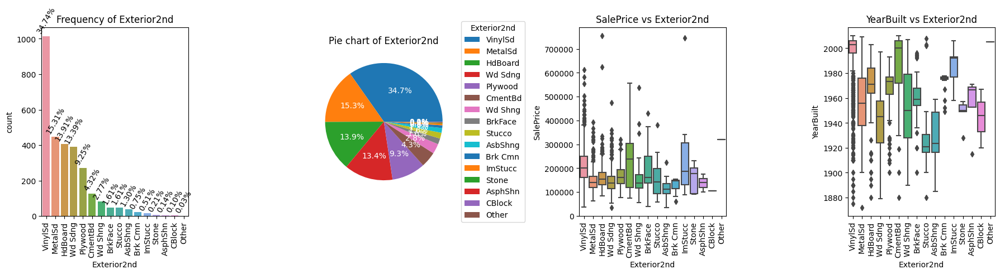

######################### *** #########################
            MasVnrType  Ratio
MasVnrType                   
BrkFace            879 30.113
Stone              249  8.530
BrkCmn              25  0.856
######################### *** #########################


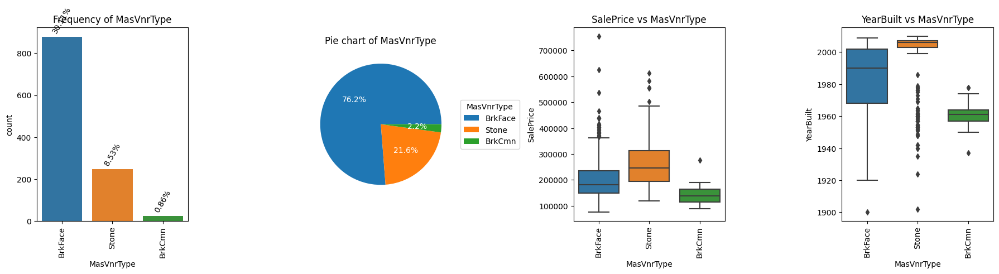

######################### *** #########################
           ExterQual  Ratio
ExterQual                  
TA              1798 61.596
Gd               979 33.539
Ex               107  3.666
Fa                35  1.199
######################### *** #########################


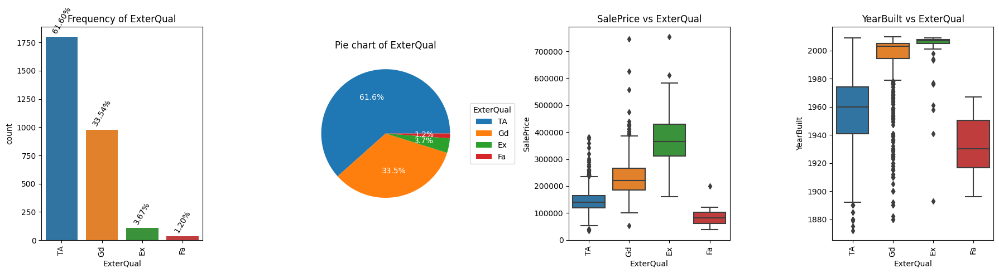

######################### *** #########################
           ExterCond  Ratio
ExterCond                  
TA              2538 86.948
Gd               299 10.243
Fa                67  2.295
Ex                12  0.411
Po                 3  0.103
######################### *** #########################


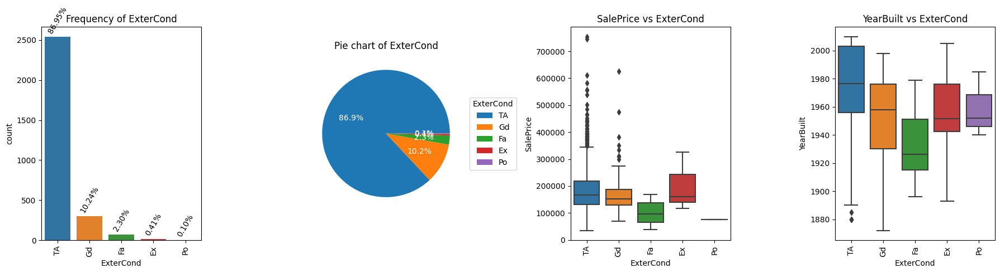

######################### *** #########################
            Foundation  Ratio
Foundation                   
PConc             1308 44.810
CBlock            1235 42.309
BrkTil             311 10.654
Slab                49  1.679
Stone               11  0.377
Wood                 5  0.171
######################### *** #########################


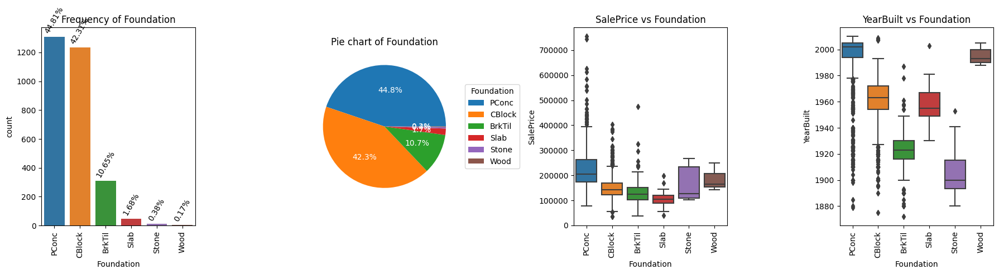

######################### *** #########################
          BsmtQual  Ratio
BsmtQual                 
TA            1283 43.953
Gd            1209 41.418
Ex             258  8.839
Fa              88  3.015
######################### *** #########################


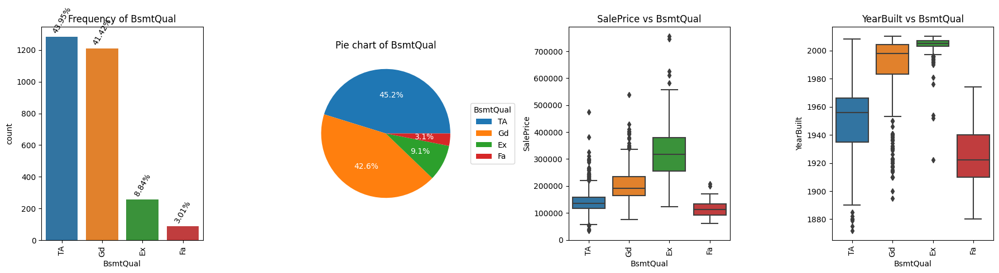

######################### *** #########################
          BsmtCond  Ratio
BsmtCond                 
TA            2606 89.277
Gd             122  4.180
Fa             104  3.563
Po               5  0.171
######################### *** #########################


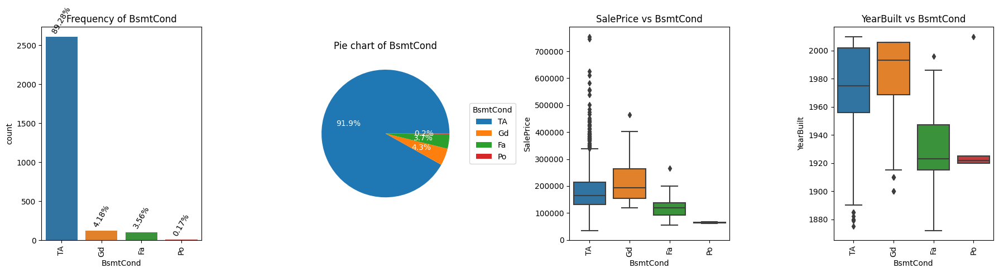

######################### *** #########################
              BsmtExposure  Ratio
BsmtExposure                     
No                    1904 65.228
Av                     418 14.320
Gd                     276  9.455
Mn                     239  8.188
######################### *** #########################


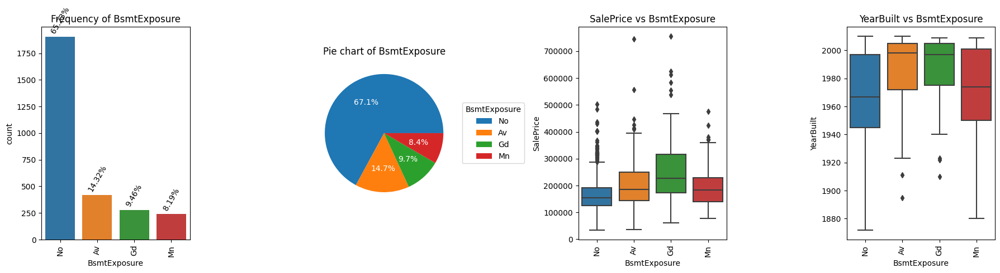

######################### *** #########################
              BsmtFinType1  Ratio
BsmtFinType1                     
Unf                    851 29.154
GLQ                    849 29.085
ALQ                    429 14.697
Rec                    288  9.866
BLQ                    269  9.215
LwQ                    154  5.276
######################### *** #########################


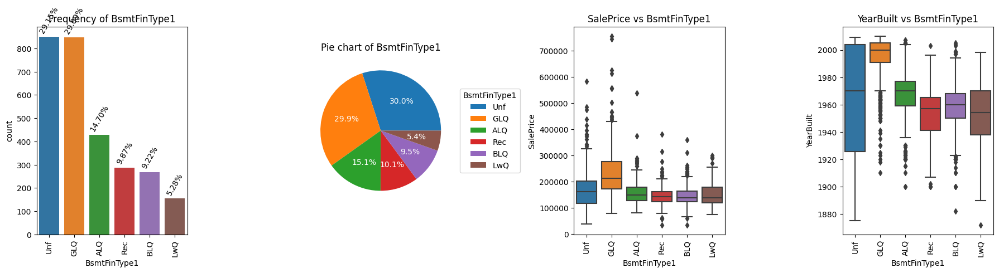

######################### *** #########################
              BsmtFinType2  Ratio
BsmtFinType2                     
Unf                   2493 85.406
Rec                    105  3.597
LwQ                     87  2.980
BLQ                     68  2.330
ALQ                     52  1.781
GLQ                     34  1.165
######################### *** #########################


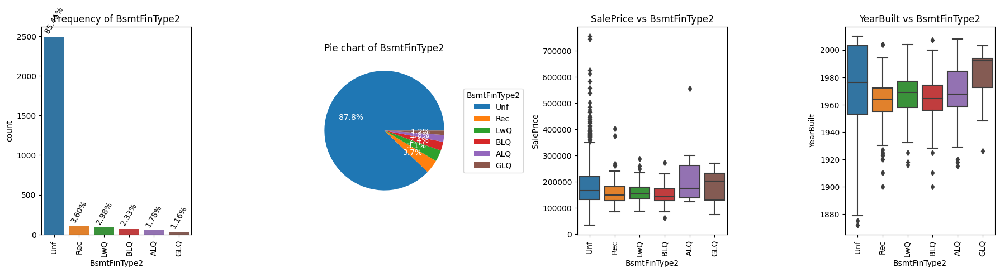

######################### *** #########################
         Heating  Ratio
Heating                
GasA        2874 98.458
GasW          27  0.925
Grav           9  0.308
Wall           6  0.206
OthW           2  0.069
Floor          1  0.034
######################### *** #########################


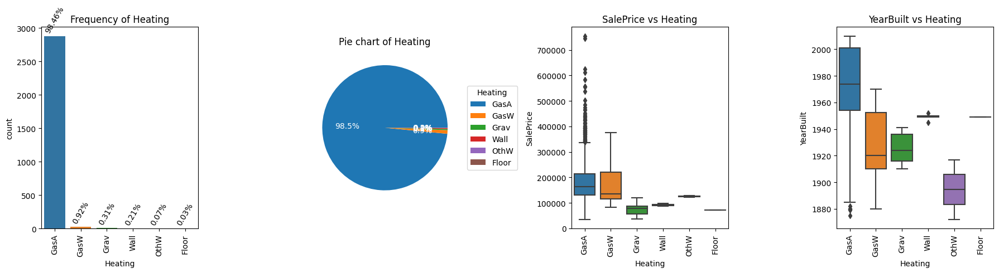

######################### *** #########################
           HeatingQC  Ratio
HeatingQC                  
Ex              1493 51.148
TA               857 29.359
Gd               474 16.238
Fa                92  3.152
Po                 3  0.103
######################### *** #########################


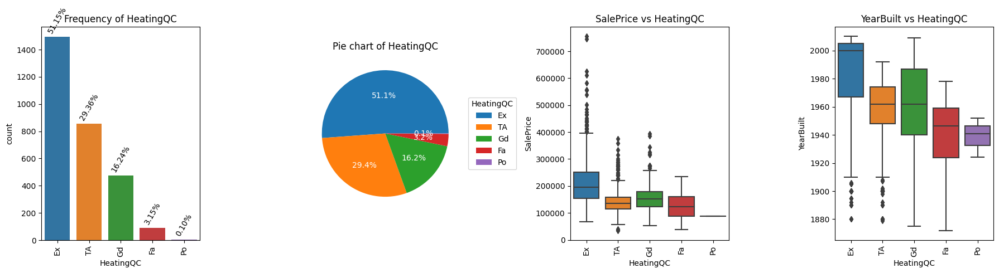

######################### *** #########################
            CentralAir  Ratio
CentralAir                   
Y                 2723 93.285
N                  196  6.715
######################### *** #########################


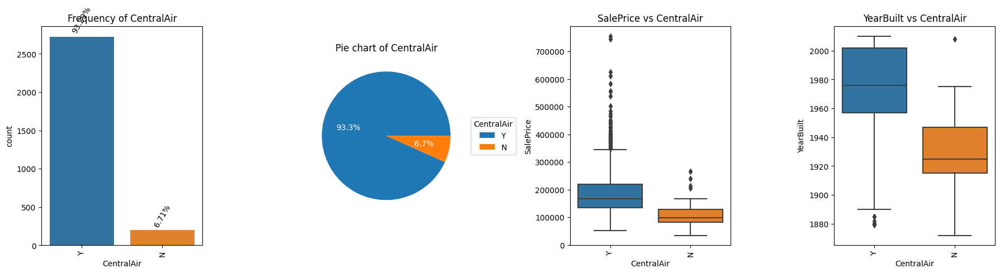

######################### *** #########################
            Electrical  Ratio
Electrical                   
SBrkr             2671 91.504
FuseA              188  6.441
FuseF               50  1.713
FuseP                8  0.274
Mix                  1  0.034
######################### *** #########################


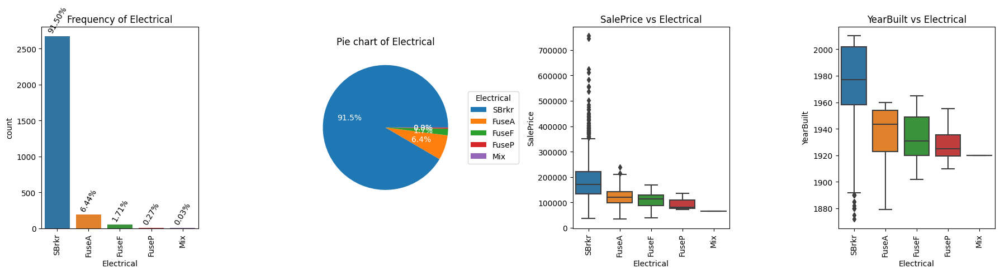

######################### *** #########################
             KitchenQual  Ratio
KitchenQual                    
TA                  1492 51.113
Gd                  1151 39.431
Ex                   205  7.023
Fa                    70  2.398
######################### *** #########################


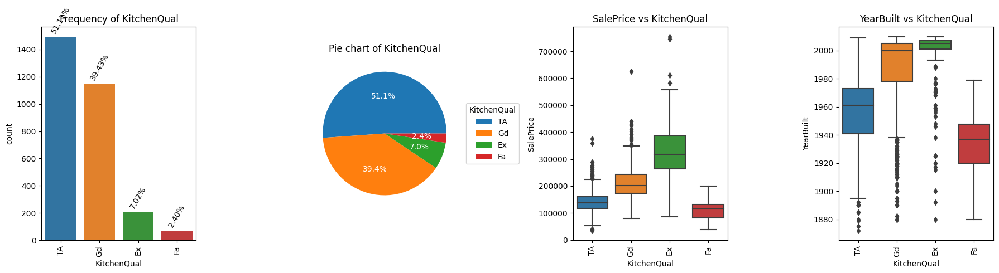

######################### *** #########################
            Functional  Ratio
Functional                   
Typ               2717 93.080
Min2                70  2.398
Min1                65  2.227
Mod                 35  1.199
Maj1                19  0.651
Maj2                 9  0.308
Sev                  2  0.069
######################### *** #########################


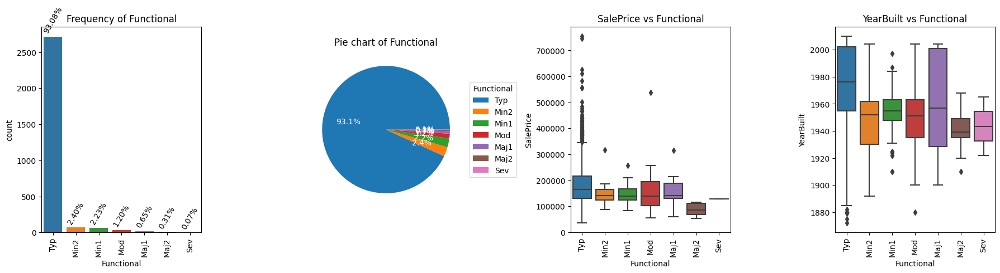

######################### *** #########################
             FireplaceQu  Ratio
FireplaceQu                    
Gd                   744 25.488
TA                   592 20.281
Fa                    74  2.535
Po                    46  1.576
Ex                    43  1.473
######################### *** #########################


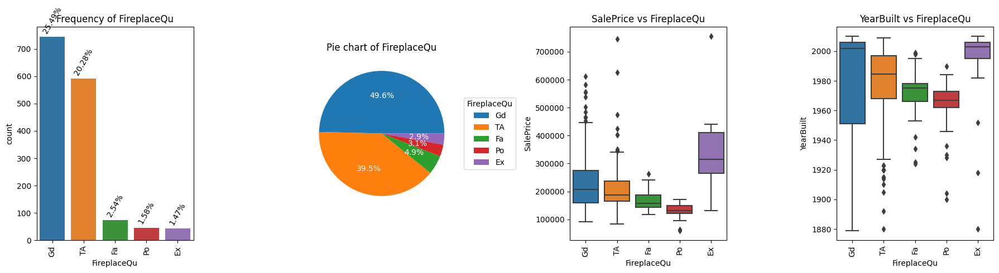

######################### *** #########################
            GarageType  Ratio
GarageType                   
Attchd            1723 59.027
Detchd             779 26.687
BuiltIn            186  6.372
Basment             36  1.233
2Types              23  0.788
CarPort             15  0.514
######################### *** #########################


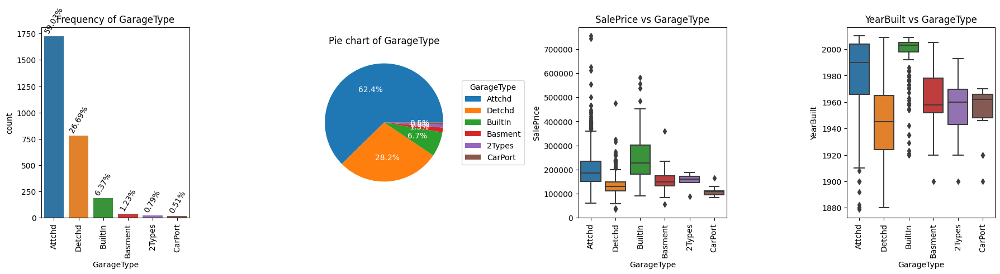

######################### *** #########################
              GarageFinish  Ratio
GarageFinish                     
Unf                   1230 42.138
RFn                    811 27.783
Fin                    719 24.632
######################### *** #########################


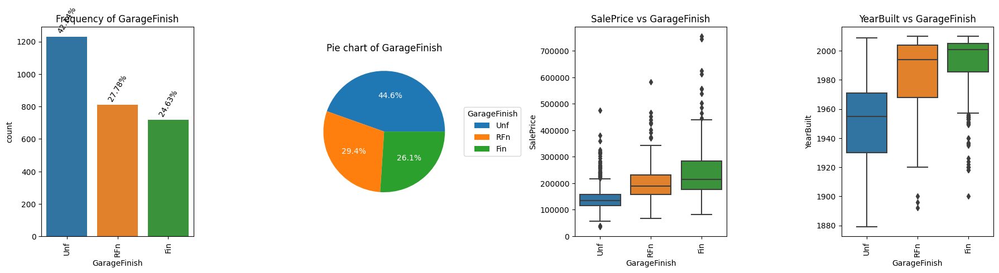

######################### *** #########################
            GarageQual  Ratio
GarageQual                   
TA                2604 89.209
Fa                 124  4.248
Gd                  24  0.822
Po                   5  0.171
Ex                   3  0.103
######################### *** #########################


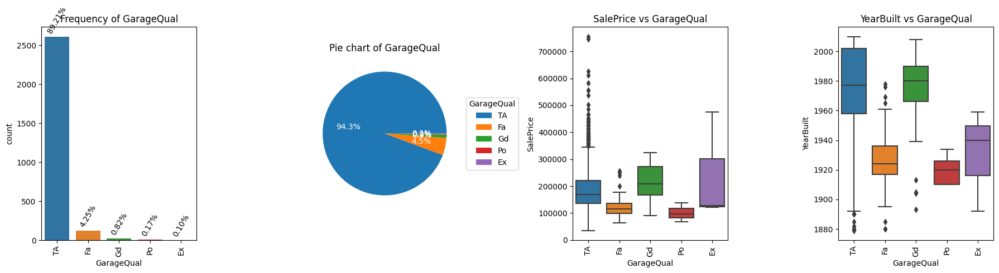

######################### *** #########################
            GarageCond  Ratio
GarageCond                   
TA                2654 90.922
Fa                  74  2.535
Gd                  15  0.514
Po                  14  0.480
Ex                   3  0.103
######################### *** #########################


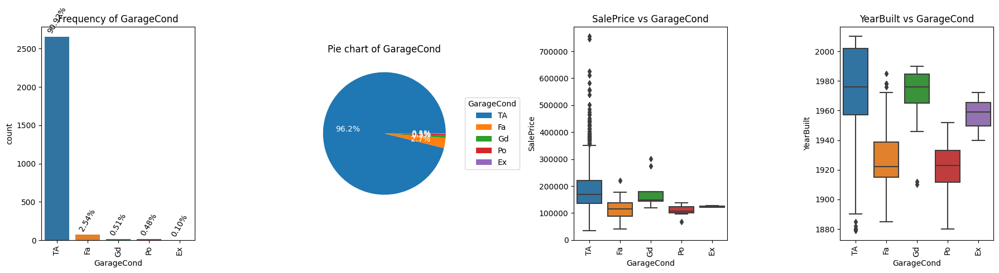

######################### *** #########################
            PavedDrive  Ratio
PavedDrive                   
Y                 2641 90.476
N                  216  7.400
P                   62  2.124
######################### *** #########################


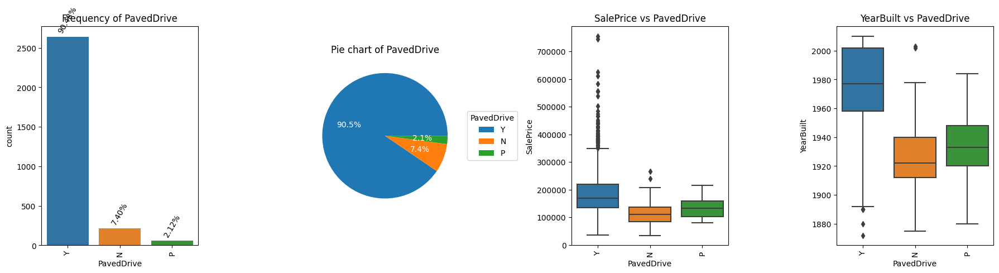

######################### *** #########################
        PoolQC  Ratio
PoolQC               
Ex           4  0.137
Gd           4  0.137
Fa           2  0.069
######################### *** #########################


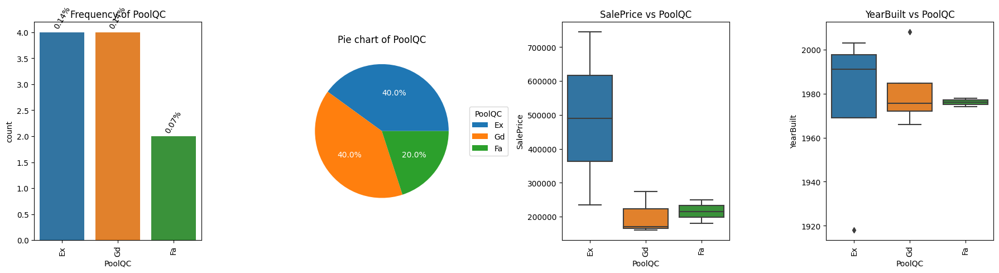

######################### *** #########################
       Fence  Ratio
Fence              
MnPrv    329 11.271
GdPrv    118  4.042
GdWo     112  3.837
MnWw      12  0.411
######################### *** #########################


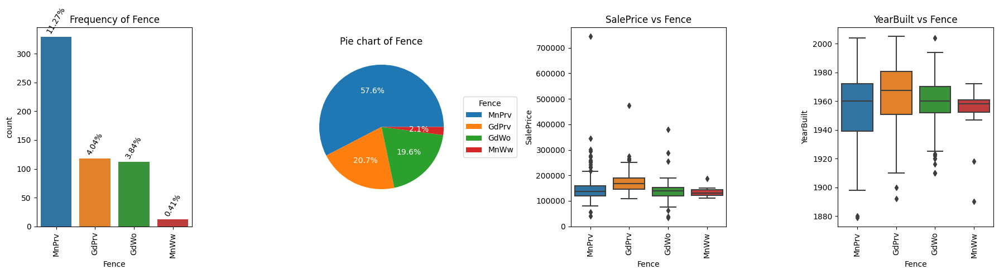

######################### *** #########################
             MiscFeature  Ratio
MiscFeature                    
Shed                  95  3.255
Gar2                   5  0.171
Othr                   4  0.137
TenC                   1  0.034
######################### *** #########################


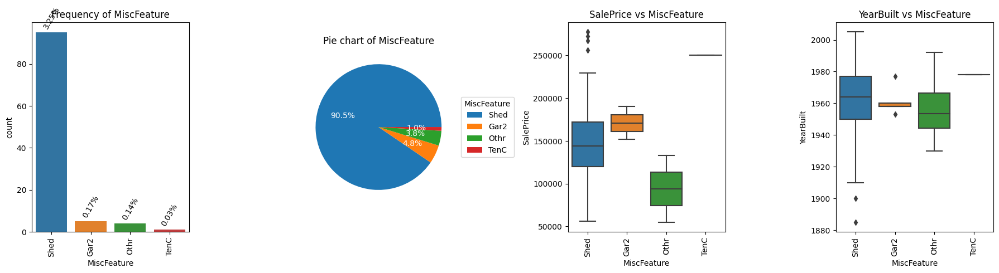

######################### *** #########################
          SaleType  Ratio
SaleType                 
WD            2525 86.502
New            239  8.188
COD             87  2.980
ConLD           26  0.891
CWD             12  0.411
ConLI            9  0.308
ConLw            8  0.274
Oth              7  0.240
Con              5  0.171
######################### *** #########################


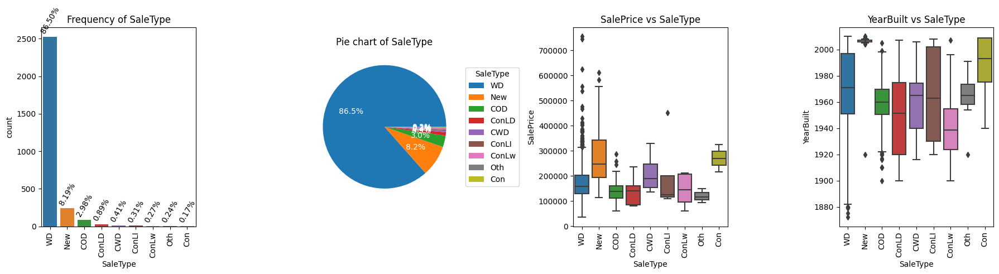

######################### *** #########################
               SaleCondition  Ratio
SaleCondition                      
Normal                  2402 82.288
Partial                  245  8.393
Abnorml                  190  6.509
Family                    46  1.576
Alloca                    24  0.822
AdjLand                   12  0.411
######################### *** #########################


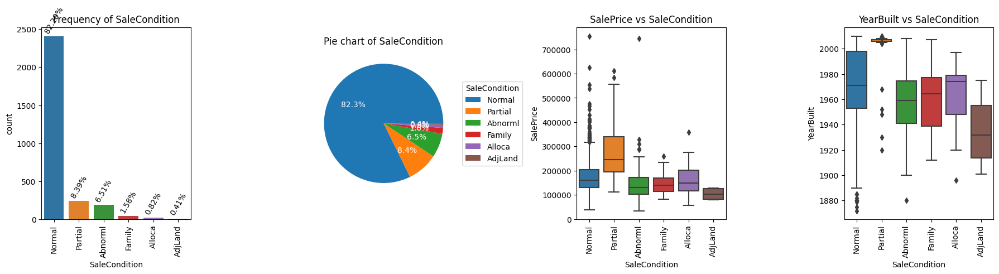

######################### *** #########################
            MSSubClass  Ratio
MSSubClass                   
20                1079 36.965
60                 575 19.699
50                 287  9.832
120                182  6.235
30                 139  4.762
70                 128  4.385
160                128  4.385
80                 118  4.042
90                 109  3.734
190                 61  2.090
85                  48  1.644
75                  23  0.788
45                  18  0.617
180                 17  0.582
40                   6  0.206
150                  1  0.034
######################### *** #########################


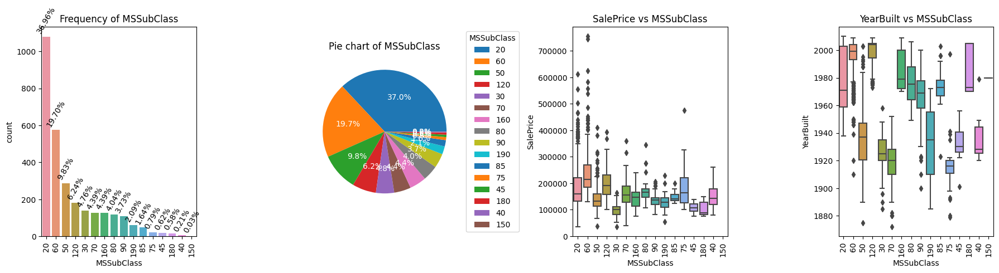

######################### *** #########################
             OverallQual  Ratio
OverallQual                    
5                    825 28.263
6                    731 25.043
7                    600 20.555
8                    342 11.716
4                    226  7.742
9                    107  3.666
3                     40  1.370
10                    31  1.062
2                     13  0.445
1                      4  0.137
######################### *** #########################


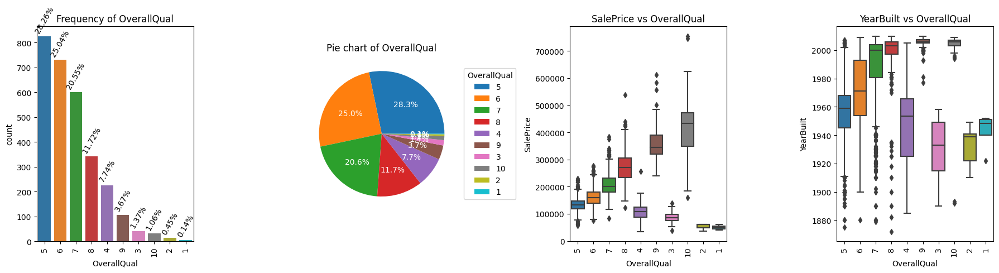

######################### *** #########################
             OverallCond  Ratio
OverallCond                    
5                   1645 56.355
6                    531 18.191
7                    390 13.361
8                    144  4.933
4                    101  3.460
3                     50  1.713
9                     41  1.405
2                     10  0.343
1                      7  0.240
######################### *** #########################


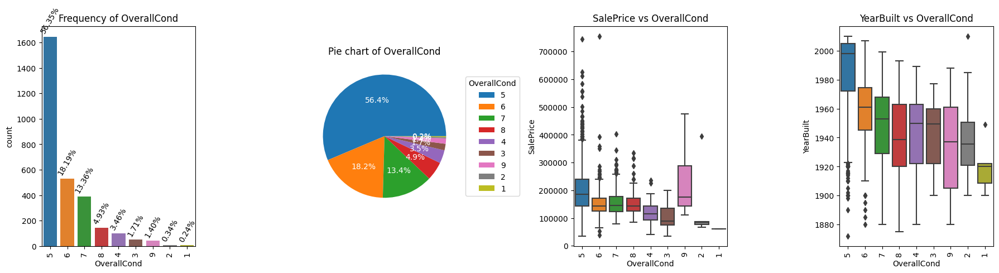

######################### *** #########################
              BsmtFullBath  Ratio
BsmtFullBath                     
0.000                 1705 58.410
1.000                 1172 40.151
2.000                   38  1.302
3.000                    2  0.069
######################### *** #########################


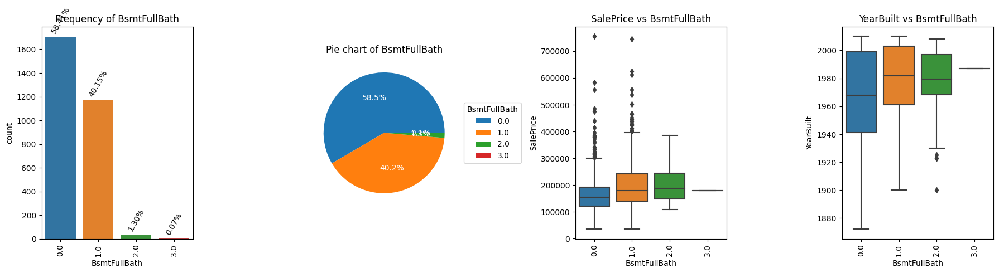

######################### *** #########################
              BsmtHalfBath  Ratio
BsmtHalfBath                     
0.000                 2742 93.936
1.000                  171  5.858
2.000                    4  0.137
######################### *** #########################


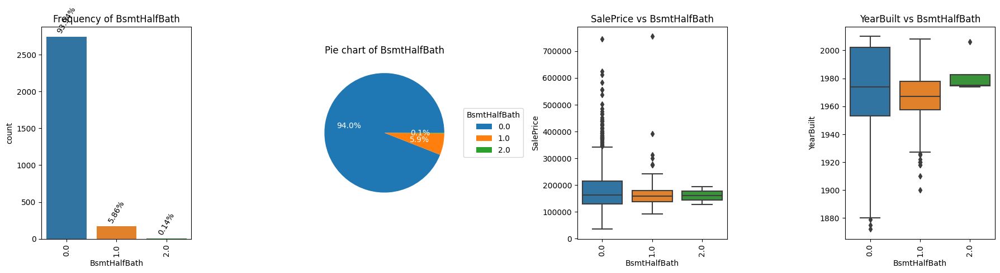

######################### *** #########################
          FullBath  Ratio
FullBath                 
2             1530 52.415
1             1309 44.844
3               64  2.193
0               12  0.411
4                4  0.137
######################### *** #########################


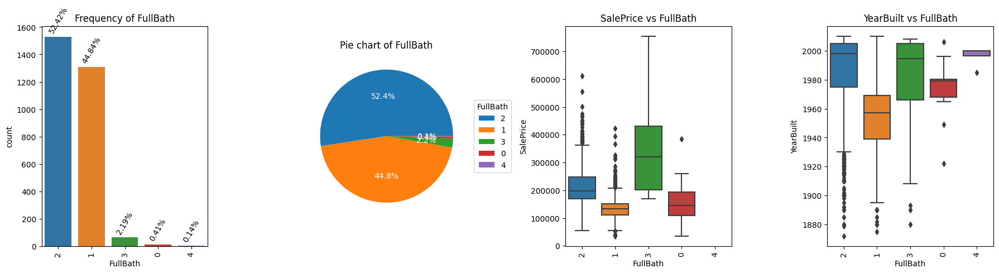

######################### *** #########################
          HalfBath  Ratio
HalfBath                 
0             1834 62.830
1             1060 36.314
2               25  0.856
######################### *** #########################


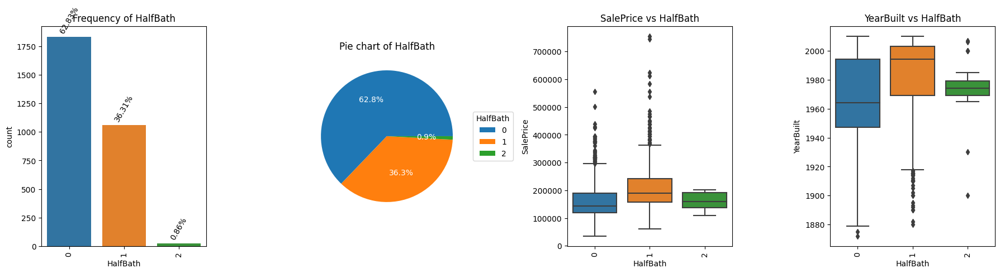

######################### *** #########################
              BedroomAbvGr  Ratio
BedroomAbvGr                     
3                     1596 54.676
2                      742 25.420
4                      400 13.703
1                      103  3.529
5                       48  1.644
6                       21  0.719
0                        8  0.274
8                        1  0.034
######################### *** #########################


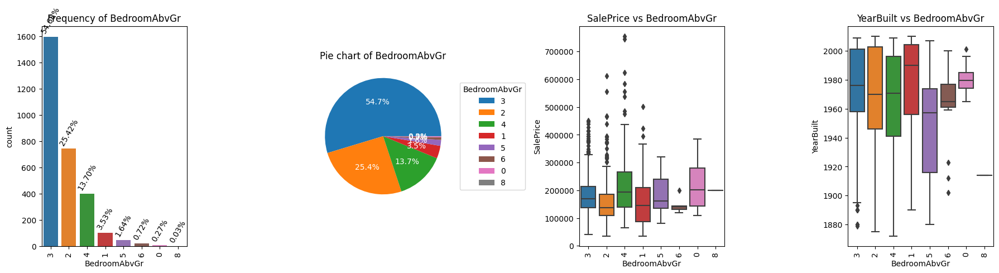

######################### *** #########################
              KitchenAbvGr  Ratio
KitchenAbvGr                     
1                     2785 95.409
2                      129  4.419
0                        3  0.103
3                        2  0.069
######################### *** #########################


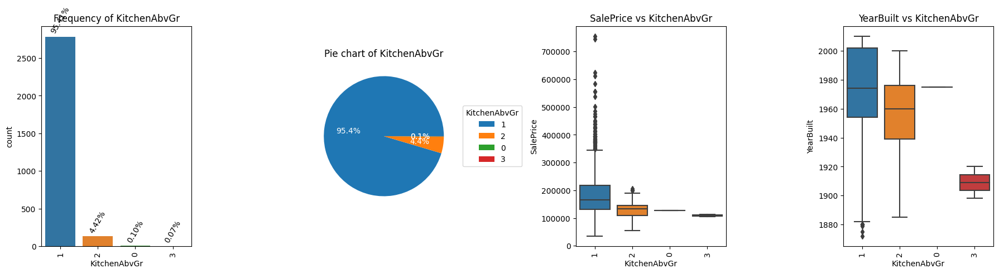

######################### *** #########################
              TotRmsAbvGrd  Ratio
TotRmsAbvGrd                     
6                      844 28.914
7                      649 22.234
5                      583 19.973
8                      347 11.888
4                      196  6.715
9                      143  4.899
10                      80  2.741
11                      32  1.096
3                       25  0.856
12                      16  0.548
2                        1  0.034
14                       1  0.034
13                       1  0.034
15                       1  0.034
######################### *** #########################


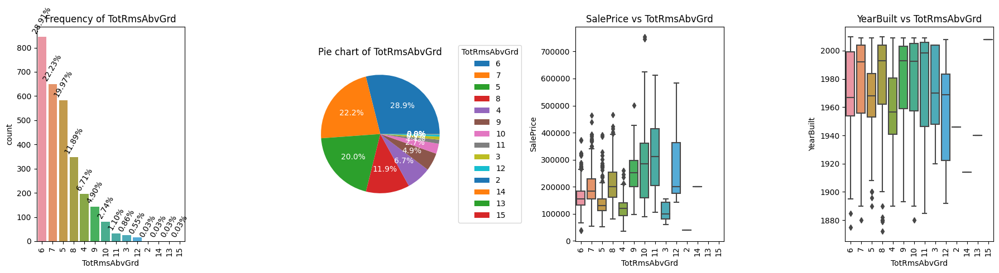

######################### *** #########################
            Fireplaces  Ratio
Fireplaces                   
0                 1420 48.647
1                 1268 43.440
2                  219  7.503
3                   11  0.377
4                    1  0.034
######################### *** #########################


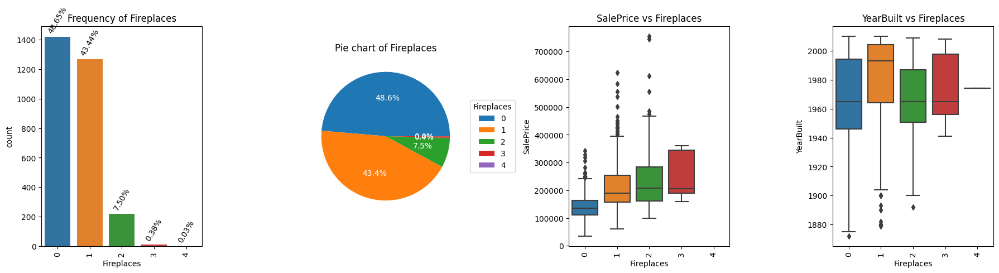

######################### *** #########################
            GarageCars  Ratio
GarageCars                   
2.000             1594 54.608
1.000              776 26.584
3.000              374 12.813
0.000              157  5.379
4.000               16  0.548
5.000                1  0.034
######################### *** #########################


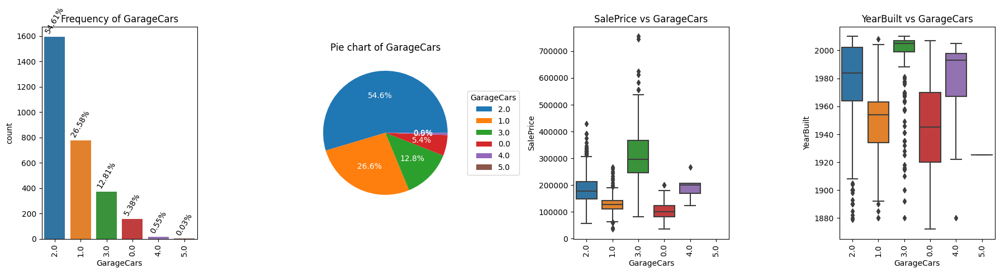

######################### *** #########################
          PoolArea  Ratio
PoolArea                 
0             2906 99.555
512              1  0.034
648              1  0.034
576              1  0.034
555              1  0.034
480              1  0.034
519              1  0.034
738              1  0.034
144              1  0.034
368              1  0.034
444              1  0.034
228              1  0.034
561              1  0.034
800              1  0.034
######################### *** #########################


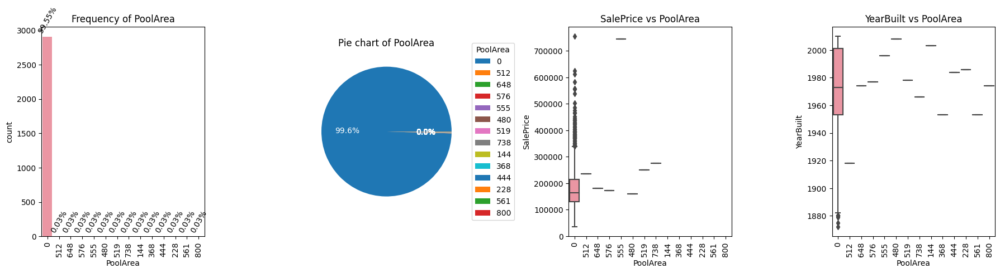

######################### *** #########################
        MoSold  Ratio
MoSold               
6          503 17.232
7          446 15.279
5          394 13.498
4          279  9.558
8          233  7.982
3          232  7.948
10         173  5.927
9          158  5.413
11         142  4.865
2          133  4.556
1          122  4.180
12         104  3.563
######################### *** #########################


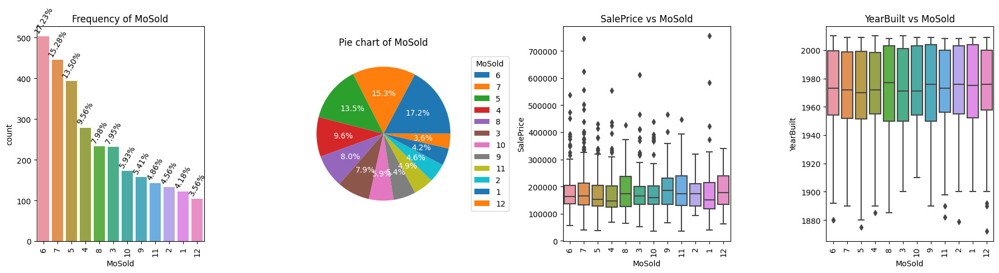

######################### *** #########################
        YrSold  Ratio
YrSold               
2007       692 23.707
2009       647 22.165
2008       622 21.309
2006       619 21.206
2010       339 11.614
######################### *** #########################


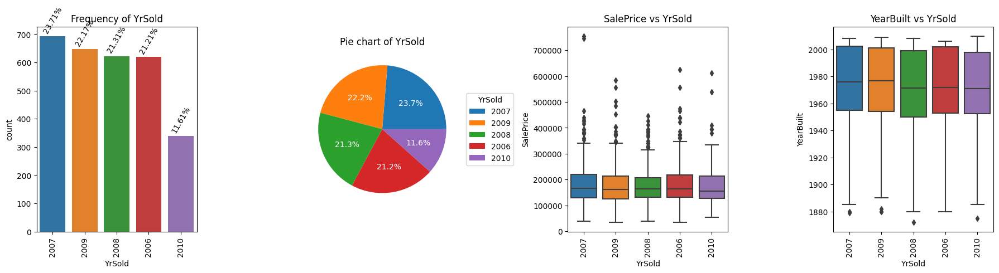

In [12]:
for col in cat_cols:
    cat_summary(df, col, plot=True)

In [13]:
def num_summary(dataframe, numerical_col, plot=False, target_col=None):
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    desc = dataframe[numerical_col].describe(quantiles)
    skewness = dataframe[numerical_col].skew()
    kurtosis = dataframe[numerical_col].kurtosis()
    
    print(desc)
    print(f"Skewness: {skewness:.2f}")
    print(f"Kurtosis: {kurtosis:.2f}")
    
    if plot:
        fig, axs = plt.subplots(3, 2, figsize=(12, 14))
        
        # Histogram
        axs[0, 0].hist(dataframe[numerical_col], bins=50)
        axs[0, 0].set_xlabel(numerical_col)
        axs[0, 0].set_title(numerical_col + ' Distribution')
        
        # Boxplot
        sns.boxplot(y=numerical_col, data=dataframe, ax=axs[0, 1])
        axs[0, 1].set_title("Boxplot of " + numerical_col)
        
        # Violin Plot
        sns.violinplot(y=numerical_col, data=dataframe, ax=axs[1, 0])
        axs[1, 0].set_title("Violin Plot of " + numerical_col)
        
        # Density Plot
        sns.kdeplot(dataframe[numerical_col], shade=True, ax=axs[1, 1])
        axs[1, 1].set_xlabel(numerical_col)
        axs[1, 1].set_title(numerical_col + ' Density')
        
        # QQ Plot
        stats.probplot(dataframe[numerical_col], dist="norm", plot=axs[2, 0])
        axs[2, 0].set_title(numerical_col + ' QQ Plot')
        
        # Correlation Heatmap
        corr = dataframe[[numerical_col, target_col]].corr()
        sns.heatmap(corr, annot=True, cmap='Blues', ax=axs[2, 1], annot_kws={"size": 16, "weight": "bold", "color":"red"})
        axs[2, 1].set_title(f'Correlation Heatmap of {numerical_col} and {target_col}')
        
        plt.tight_layout()
        plt.show()

    print("#####################################")

count   2919.000
mean    1460.000
std      842.787
min        1.000
5%       146.900
10%      292.800
20%      584.600
30%      876.400
40%     1168.200
50%     1460.000
60%     1751.800
70%     2043.600
80%     2335.400
90%     2627.200
95%     2773.100
99%     2889.820
max     2919.000
Name: Id, dtype: float64
Skewness: 0.00
Kurtosis: -1.20


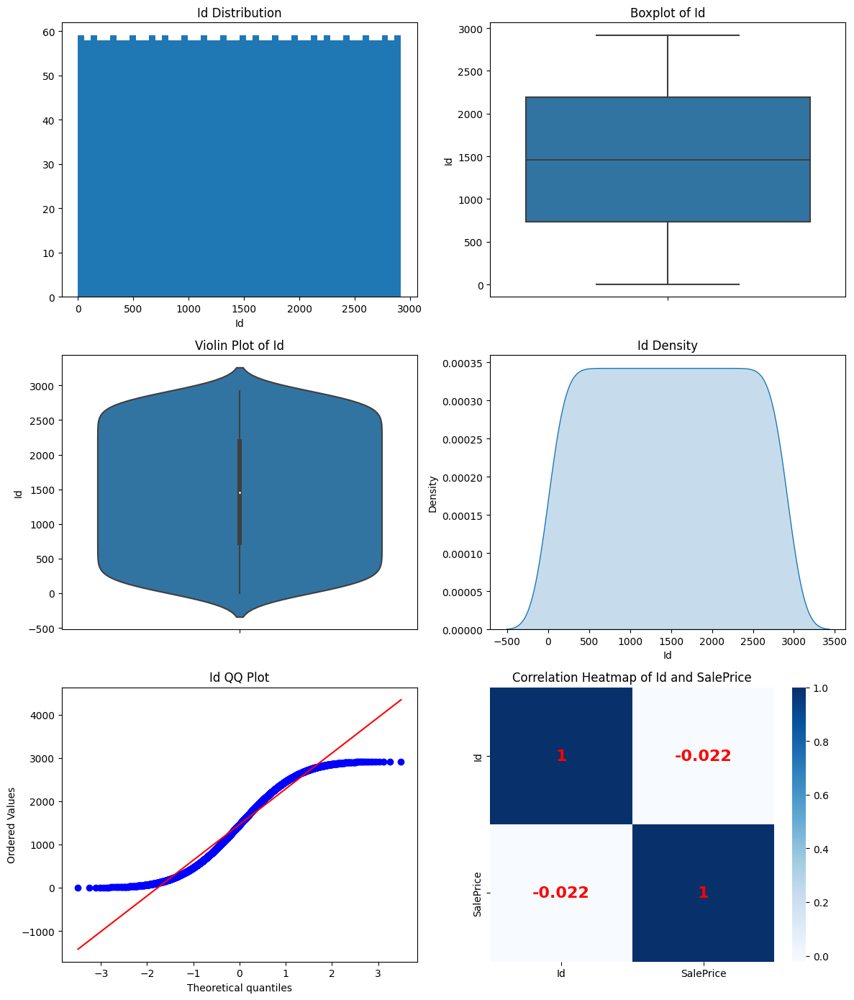

#####################################
count   2433.000
mean      69.306
std       23.345
min       21.000
5%        32.000
10%       43.000
20%       53.000
30%       60.000
40%       63.000
50%       68.000
60%       73.000
70%       78.000
80%       84.000
90%       95.000
95%      107.000
99%      135.680
max      313.000
Name: LotFrontage, dtype: float64
Skewness: 1.50
Kurtosis: 11.30


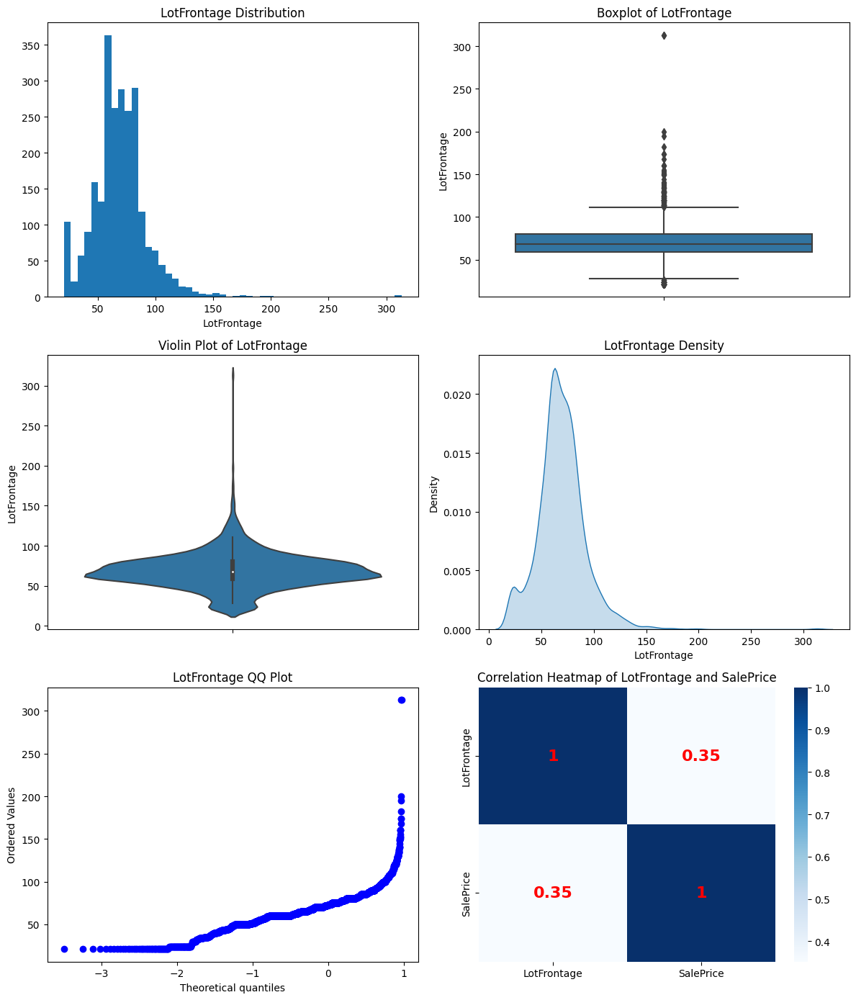

#####################################
count     2919.000
mean     10168.114
std       7886.996
min       1300.000
5%        3182.000
10%       4922.400
20%       7007.600
30%       7960.400
40%       8741.000
50%       9453.000
60%      10151.600
70%      11001.200
80%      12203.800
90%      14300.600
95%      17142.900
99%      33038.640
max     215245.000
Name: LotArea, dtype: float64
Skewness: 12.83
Kurtosis: 264.95


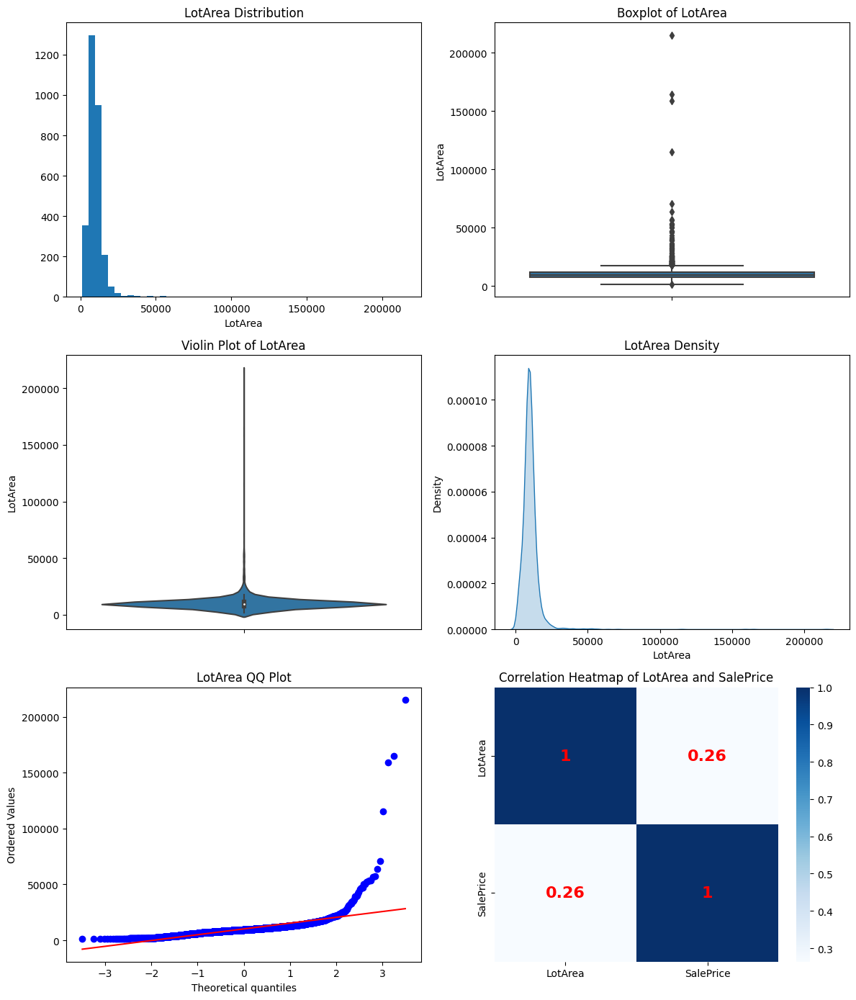

#####################################
count   2919.000
mean    1971.313
std       30.291
min     1872.000
5%      1915.000
10%     1924.000
20%     1947.000
30%     1957.000
40%     1965.000
50%     1973.000
60%     1984.000
70%     1998.000
80%     2003.000
90%     2006.000
95%     2007.000
99%     2008.000
max     2010.000
Name: YearBuilt, dtype: float64
Skewness: -0.60
Kurtosis: -0.51


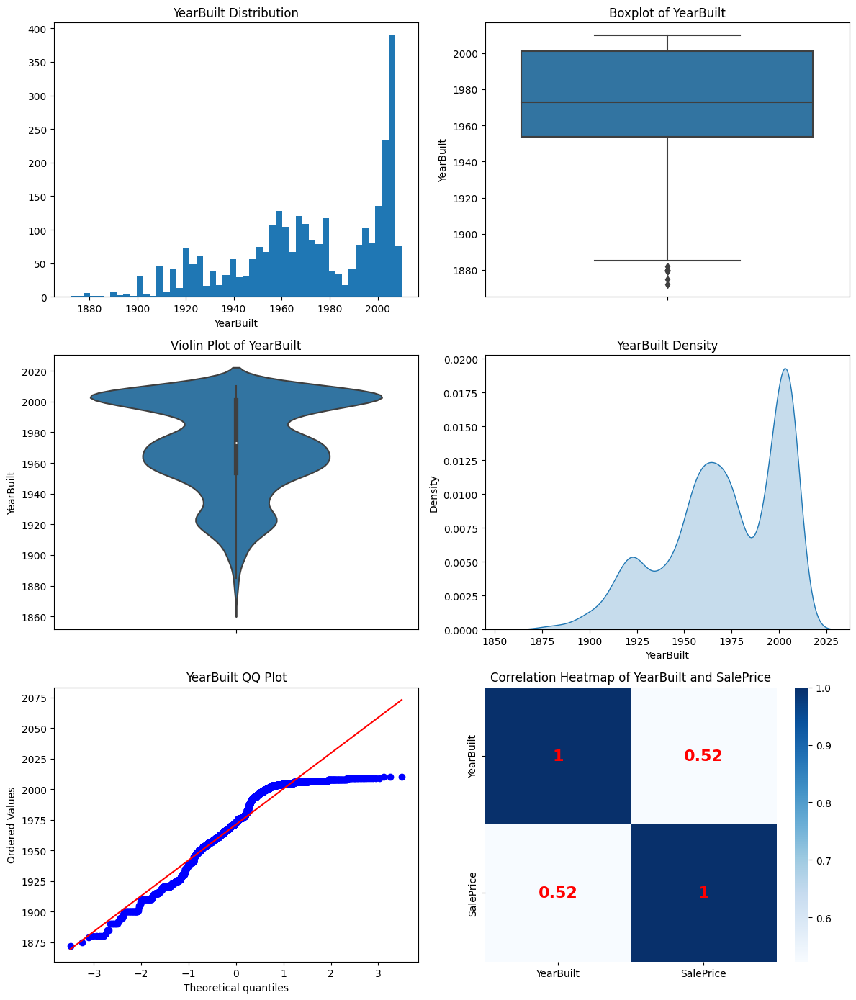

#####################################
count   2919.000
mean    1984.264
std       20.894
min     1950.000
5%      1950.000
10%     1950.000
20%     1960.000
30%     1970.000
40%     1978.000
50%     1993.000
60%     1998.000
70%     2002.000
80%     2005.000
90%     2006.200
95%     2007.000
99%     2009.000
max     2010.000
Name: YearRemodAdd, dtype: float64
Skewness: -0.45
Kurtosis: -1.35


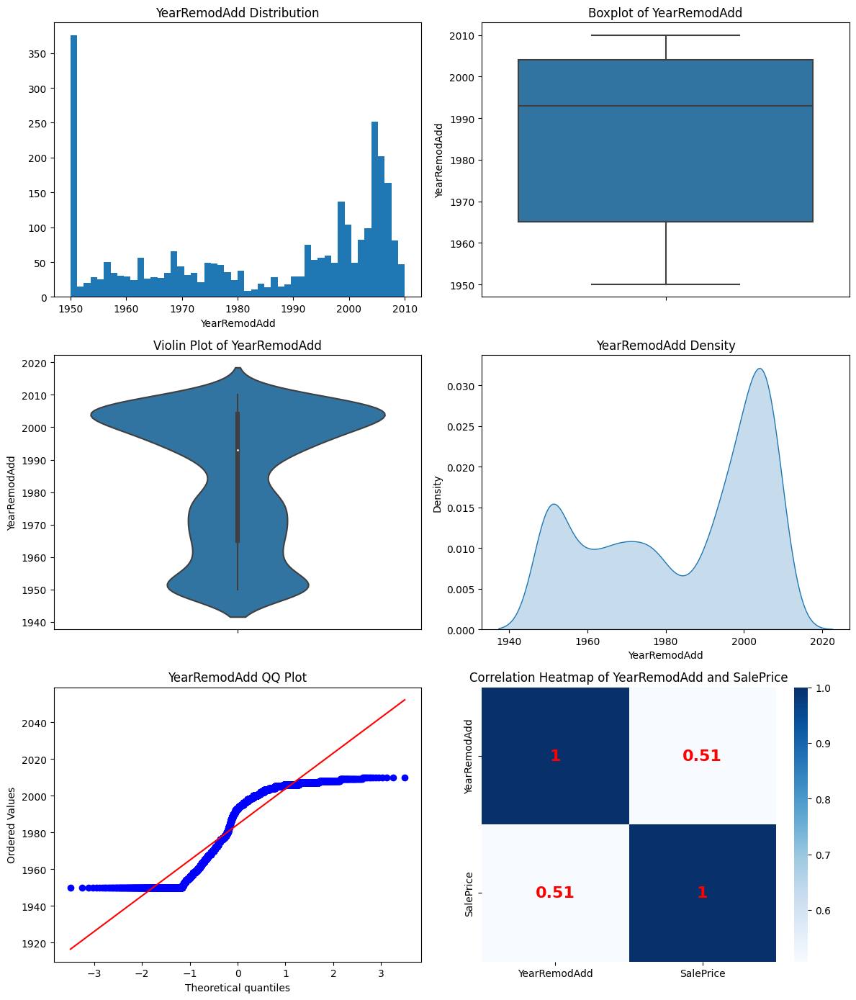

#####################################
count   2896.000
mean     102.201
std      179.334
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%      120.000
80%      202.000
90%      325.500
95%      466.500
99%      771.050
max     1600.000
Name: MasVnrArea, dtype: float64
Skewness: 2.60
Kurtosis: 9.25


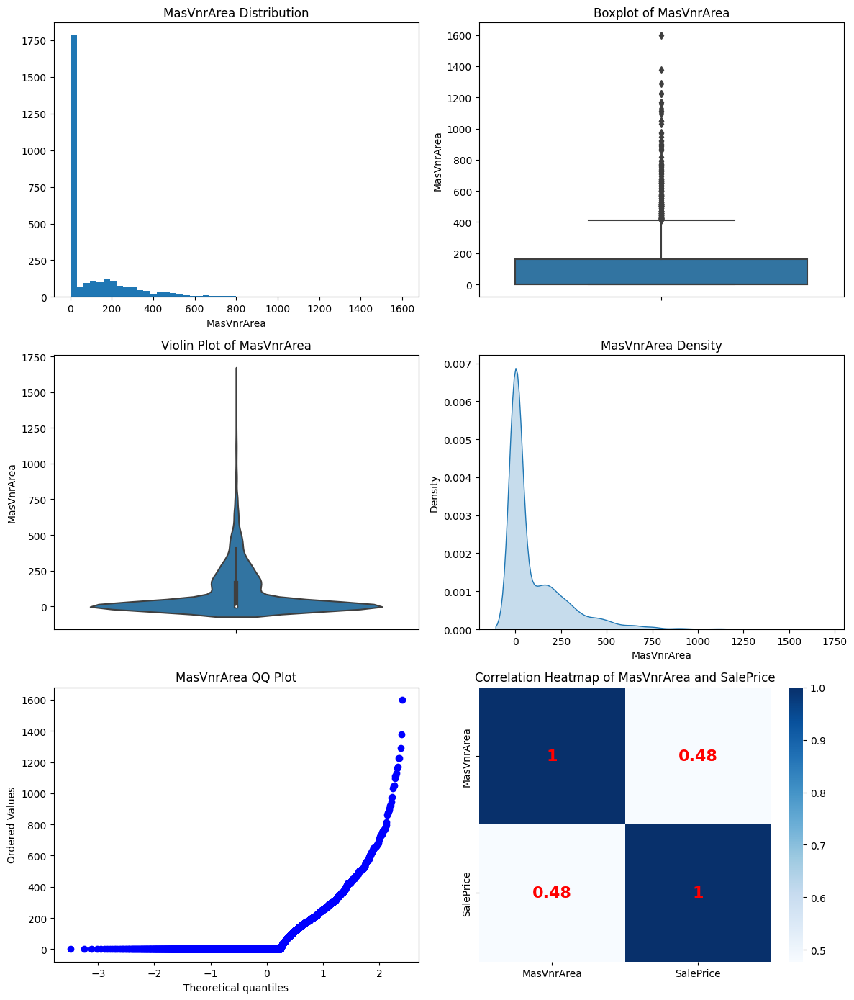

#####################################
count   2918.000
mean     441.423
std      455.611
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%      202.600
50%      368.500
60%      515.200
70%      656.000
80%      812.000
90%     1056.900
95%     1274.000
99%     1635.320
max     5644.000
Name: BsmtFinSF1, dtype: float64
Skewness: 1.43
Kurtosis: 6.90


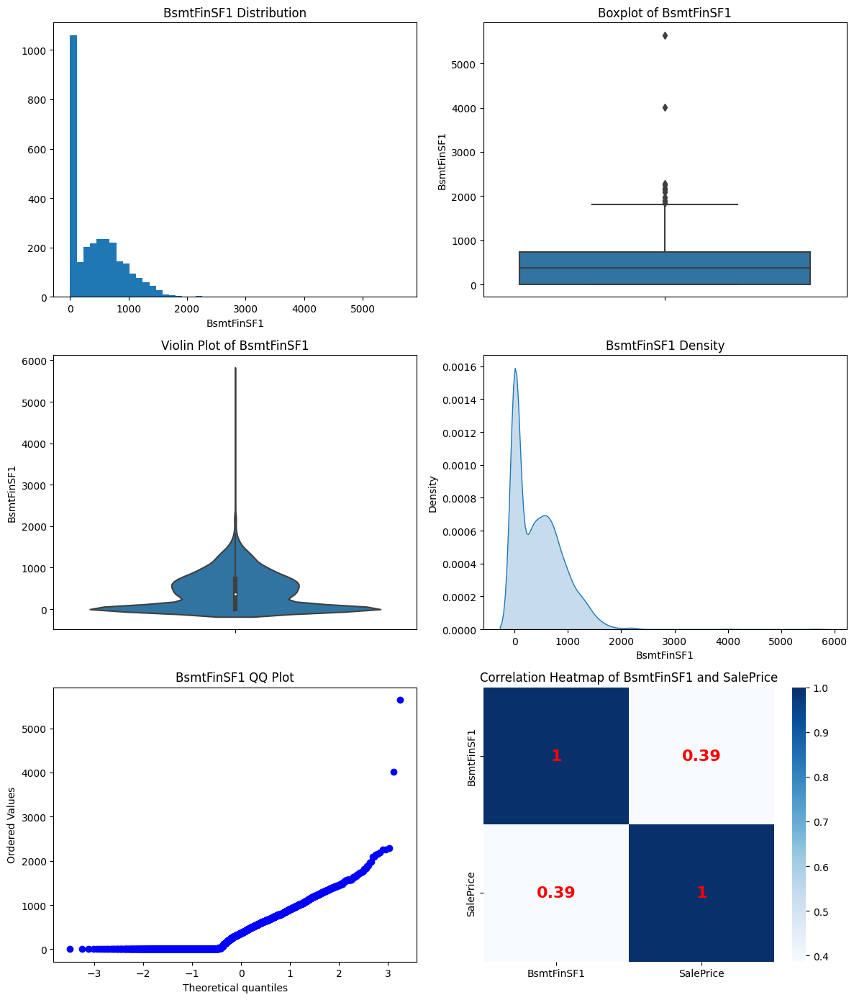

#####################################
count   2918.000
mean      49.582
std      169.206
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%      125.600
95%      435.000
99%      874.660
max     1526.000
Name: BsmtFinSF2, dtype: float64
Skewness: 4.15
Kurtosis: 18.84


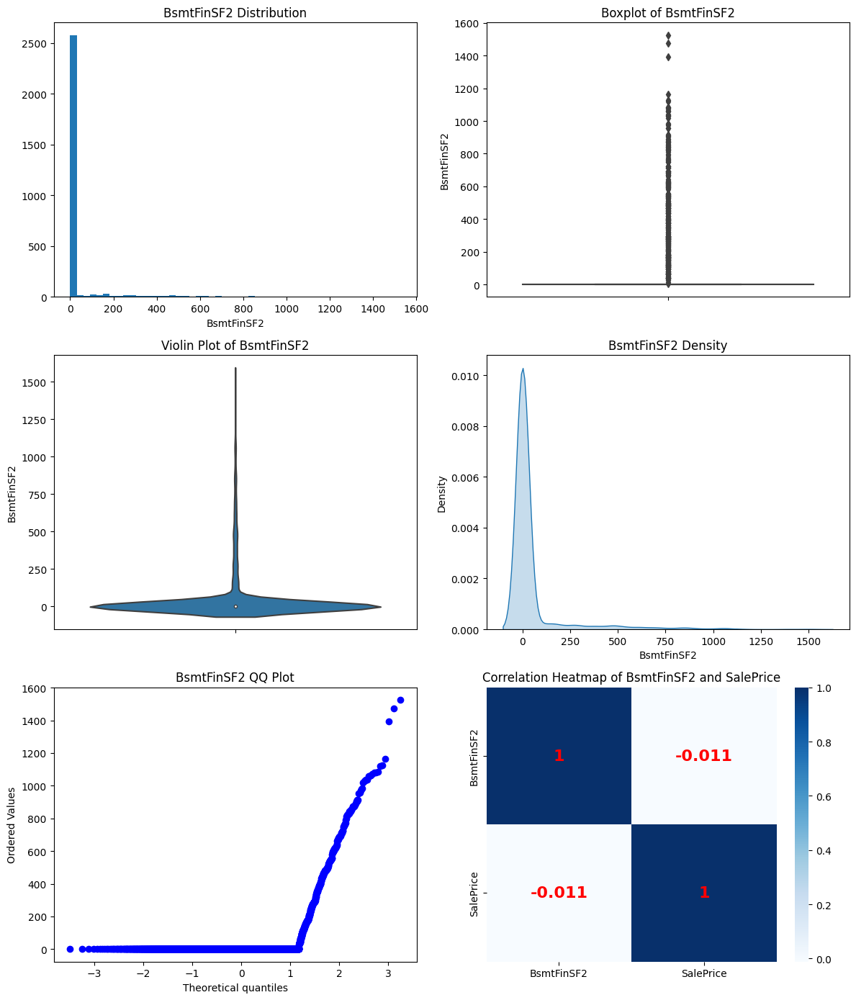

#####################################
count   2918.000
mean     560.772
std      439.544
min        0.000
5%         0.000
10%       56.000
20%      174.000
30%      270.000
40%      365.800
50%      467.000
60%      595.000
70%      732.000
80%      892.600
90%     1212.600
95%     1474.900
99%     1776.490
max     2336.000
Name: BsmtUnfSF, dtype: float64
Skewness: 0.92
Kurtosis: 0.40


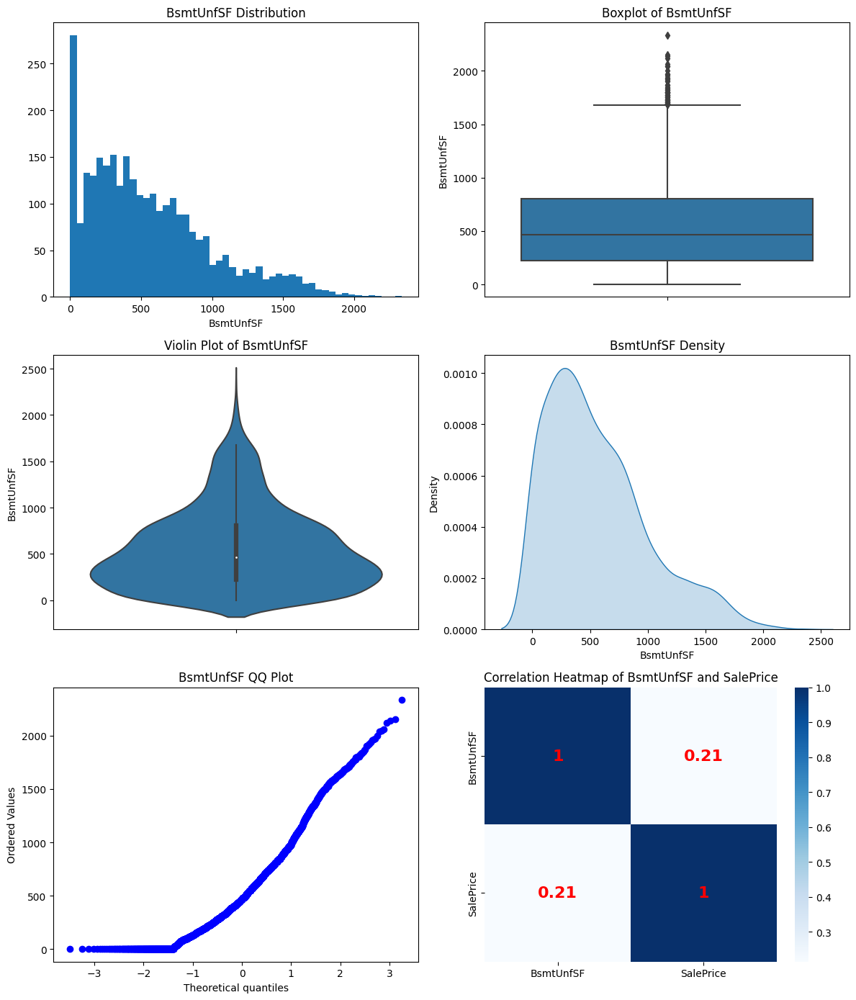

#####################################
count   2918.000
mean    1051.778
std      440.766
min        0.000
5%       455.250
10%      600.000
20%      741.000
30%      836.000
40%      911.000
50%      989.500
60%     1089.200
70%     1216.000
80%     1392.000
90%     1614.000
95%     1776.150
99%     2198.300
max     6110.000
Name: TotalBsmtSF, dtype: float64
Skewness: 1.16
Kurtosis: 9.15


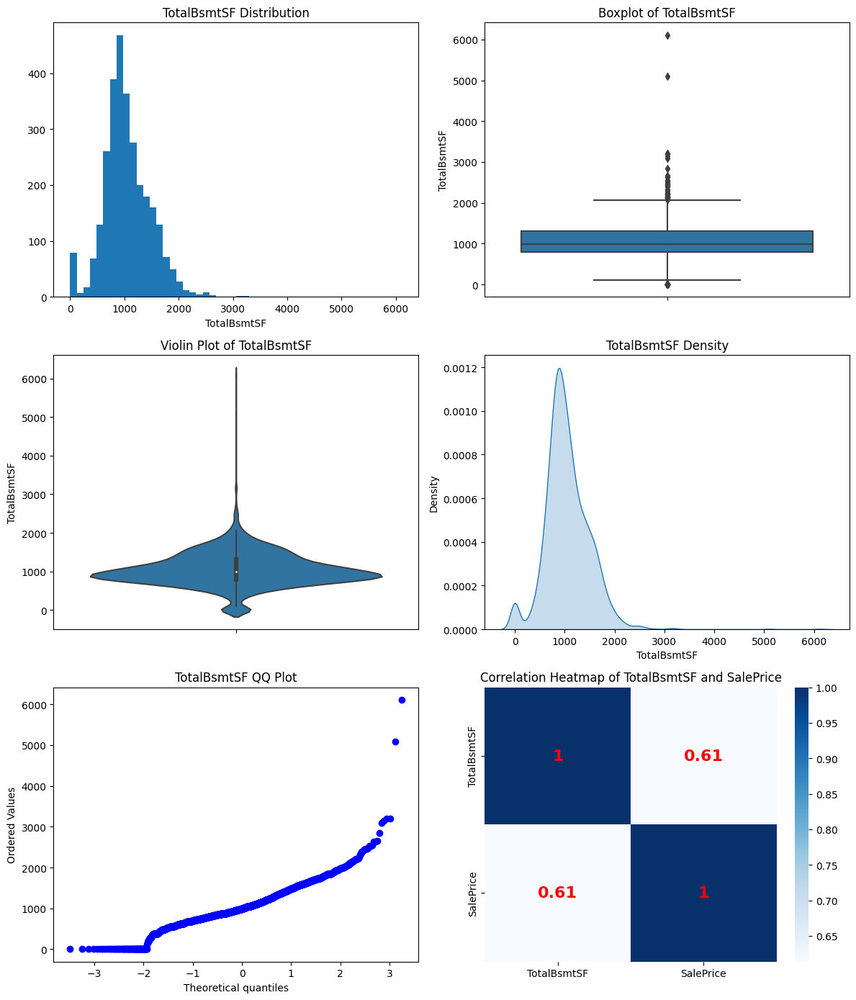

#####################################
count   2919.000
mean    1159.582
std      392.362
min      334.000
5%       665.900
10%      744.800
20%      847.000
30%      914.000
40%      996.200
50%     1082.000
60%     1180.000
70%     1314.000
80%     1483.400
90%     1675.000
95%     1830.100
99%     2288.020
max     5095.000
Name: 1stFlrSF, dtype: float64
Skewness: 1.47
Kurtosis: 6.96


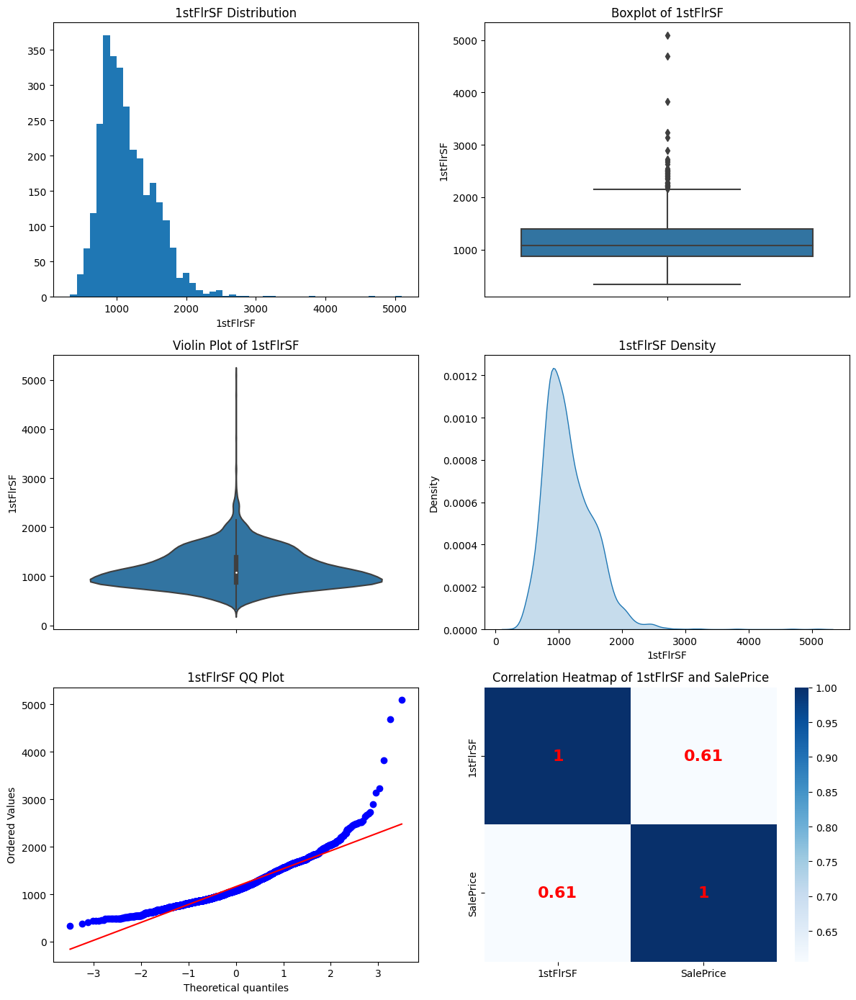

#####################################
count   2919.000
mean     336.484
std      428.701
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%      427.400
70%      636.000
80%      770.800
90%      925.000
95%     1131.200
99%     1400.200
max     2065.000
Name: 2ndFlrSF, dtype: float64
Skewness: 0.86
Kurtosis: -0.42


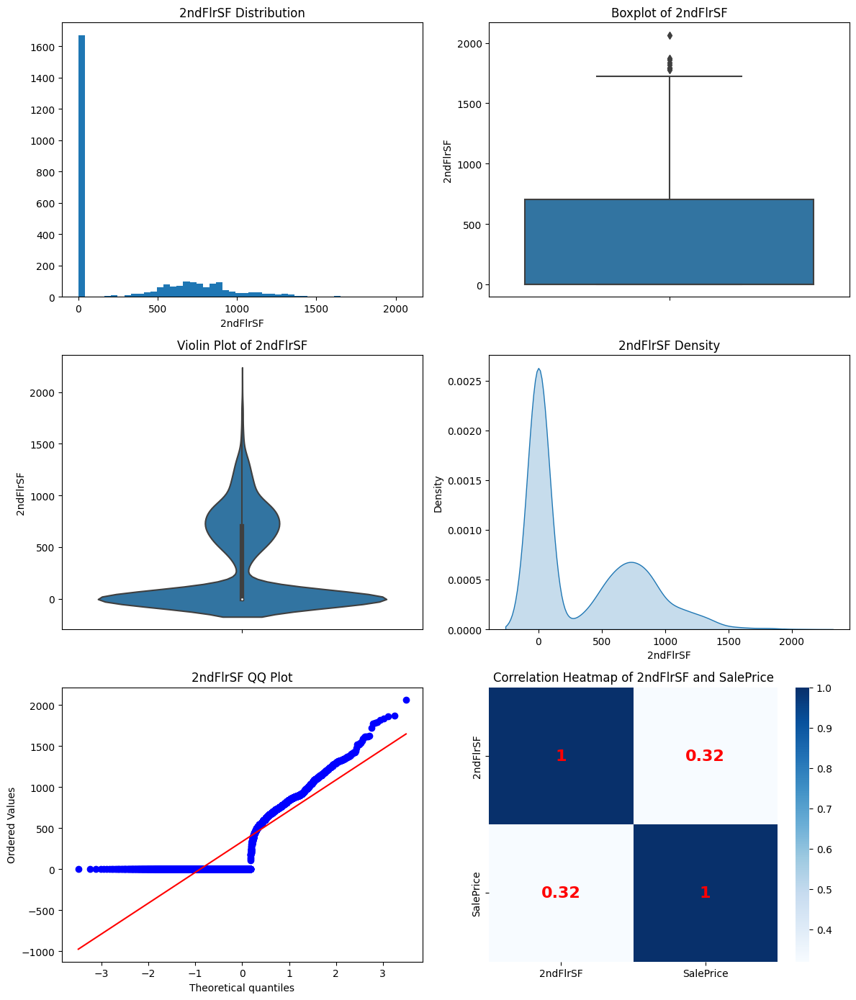

#####################################
count   2919.000
mean       4.694
std       46.397
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%        0.000
99%      153.840
max     1064.000
Name: LowQualFinSF, dtype: float64
Skewness: 12.09
Kurtosis: 174.93


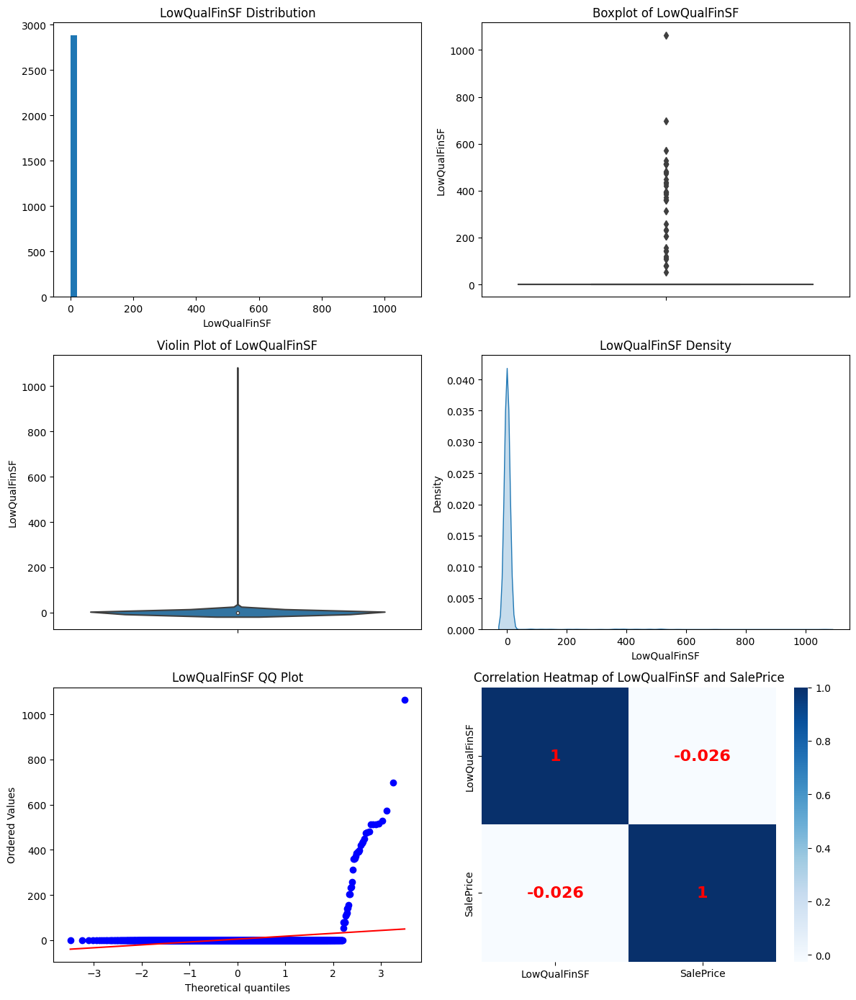

#####################################
count   2919.000
mean    1500.760
std      506.051
min      334.000
5%       861.000
10%      923.800
20%     1064.600
30%     1200.000
40%     1329.200
50%     1444.000
60%     1560.000
70%     1680.000
80%     1838.400
90%     2153.200
95%     2464.200
99%     2935.720
max     5642.000
Name: GrLivArea, dtype: float64
Skewness: 1.27
Kurtosis: 4.12


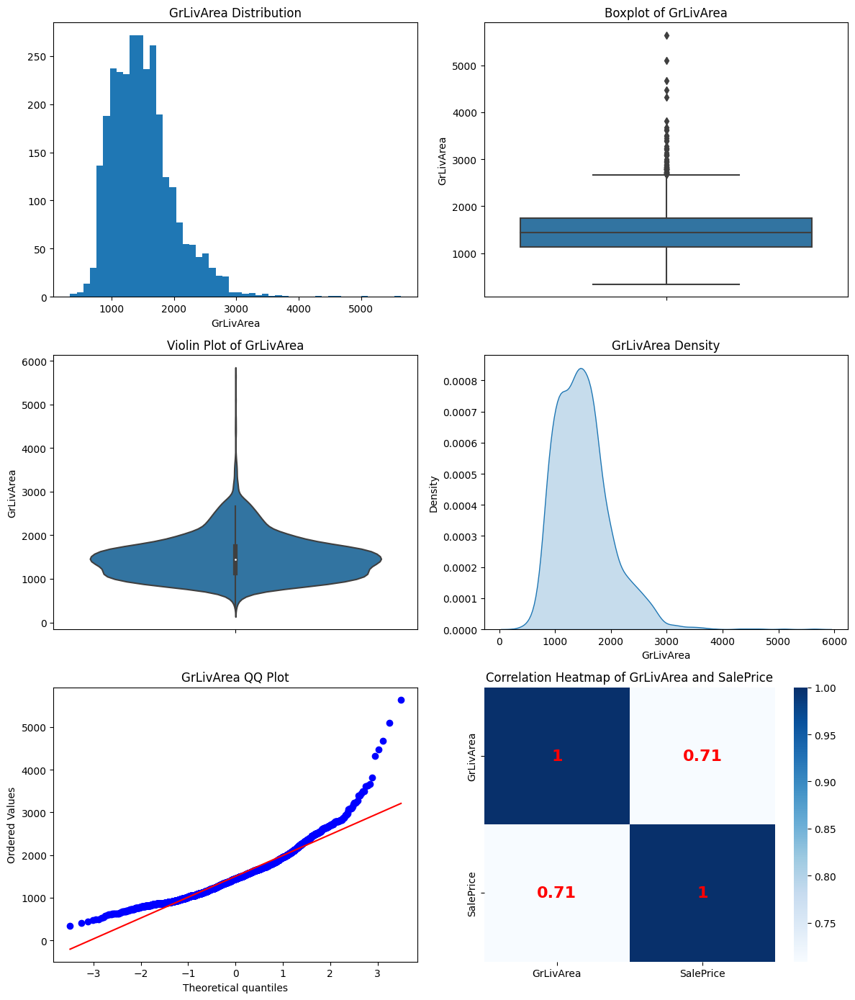

#####################################
count   2760.000
mean    1978.113
std       25.574
min     1895.000
5%      1928.000
10%     1941.000
20%     1957.000
30%     1964.000
40%     1972.000
50%     1979.000
60%     1993.000
70%     1999.000
80%     2004.000
90%     2006.000
95%     2007.000
99%     2009.000
max     2207.000
Name: GarageYrBlt, dtype: float64
Skewness: -0.38
Kurtosis: 1.81


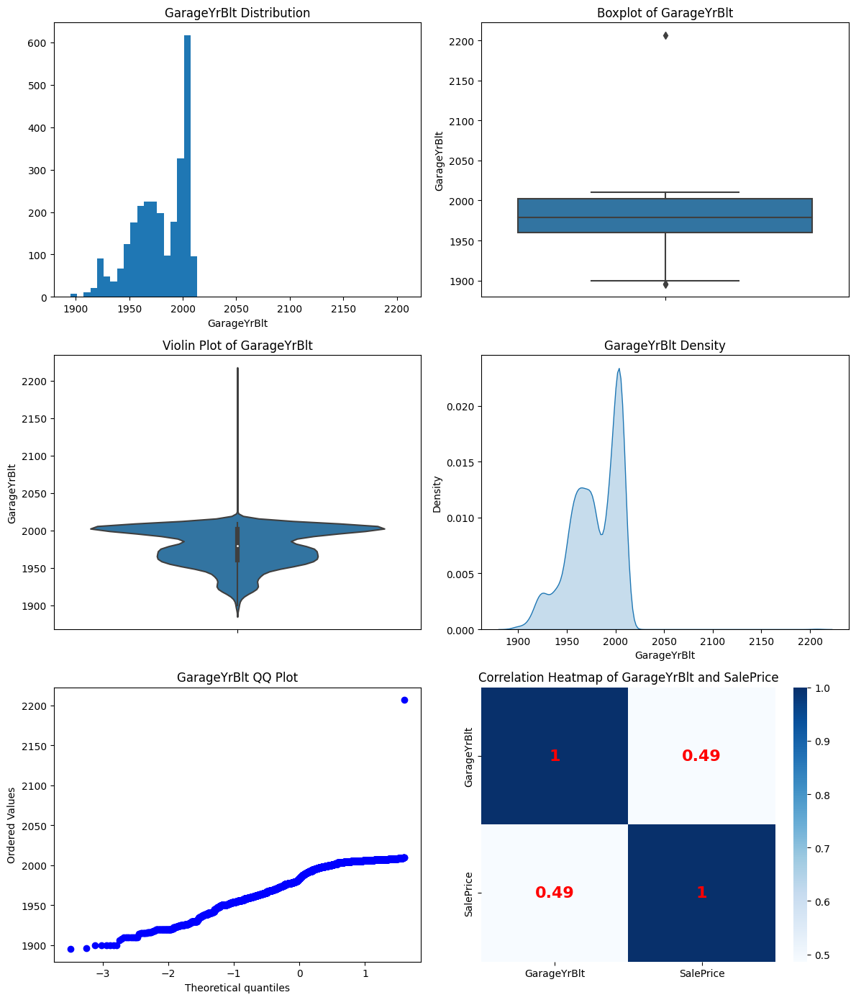

#####################################
count   2918.000
mean     472.875
std      215.395
min        0.000
5%         0.000
10%      240.000
20%      296.000
30%      379.000
40%      440.000
50%      480.000
60%      513.000
70%      560.900
80%      621.000
90%      758.000
95%      856.150
99%     1019.490
max     1488.000
Name: GarageArea, dtype: float64
Skewness: 0.24
Kurtosis: 0.94


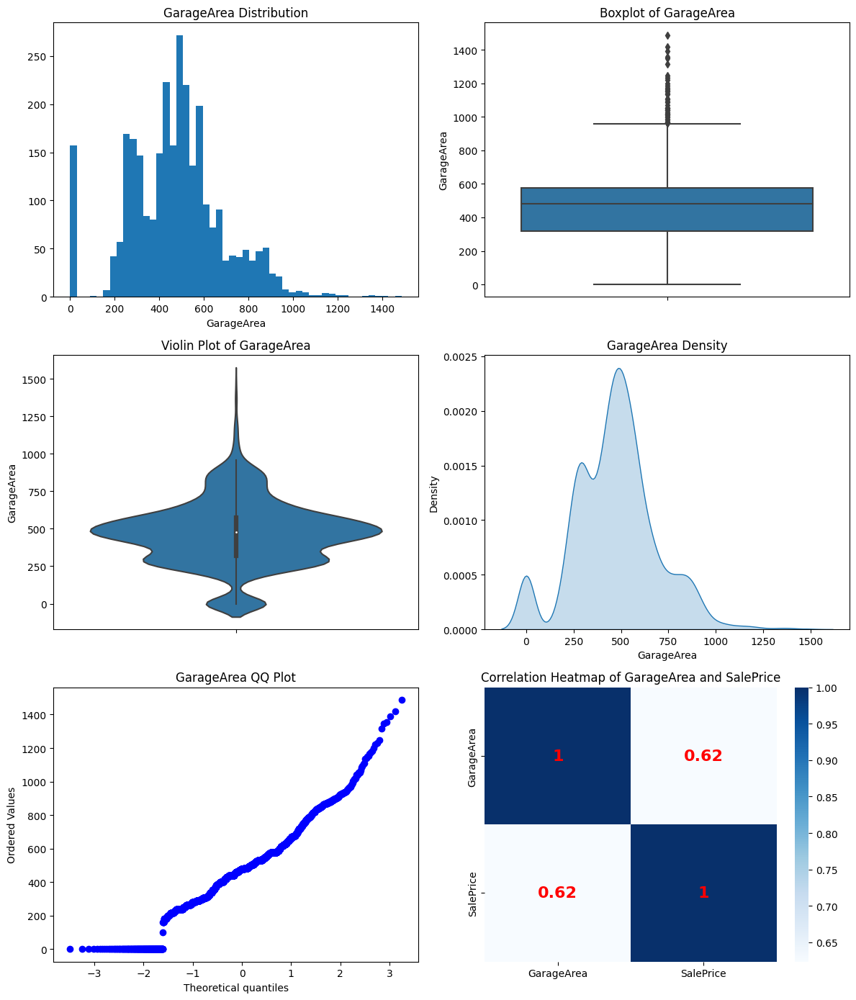

#####################################
count   2919.000
mean      93.710
std      126.527
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%      100.000
70%      144.000
80%      192.000
90%      257.000
95%      328.000
99%      500.820
max     1424.000
Name: WoodDeckSF, dtype: float64
Skewness: 1.84
Kurtosis: 6.74


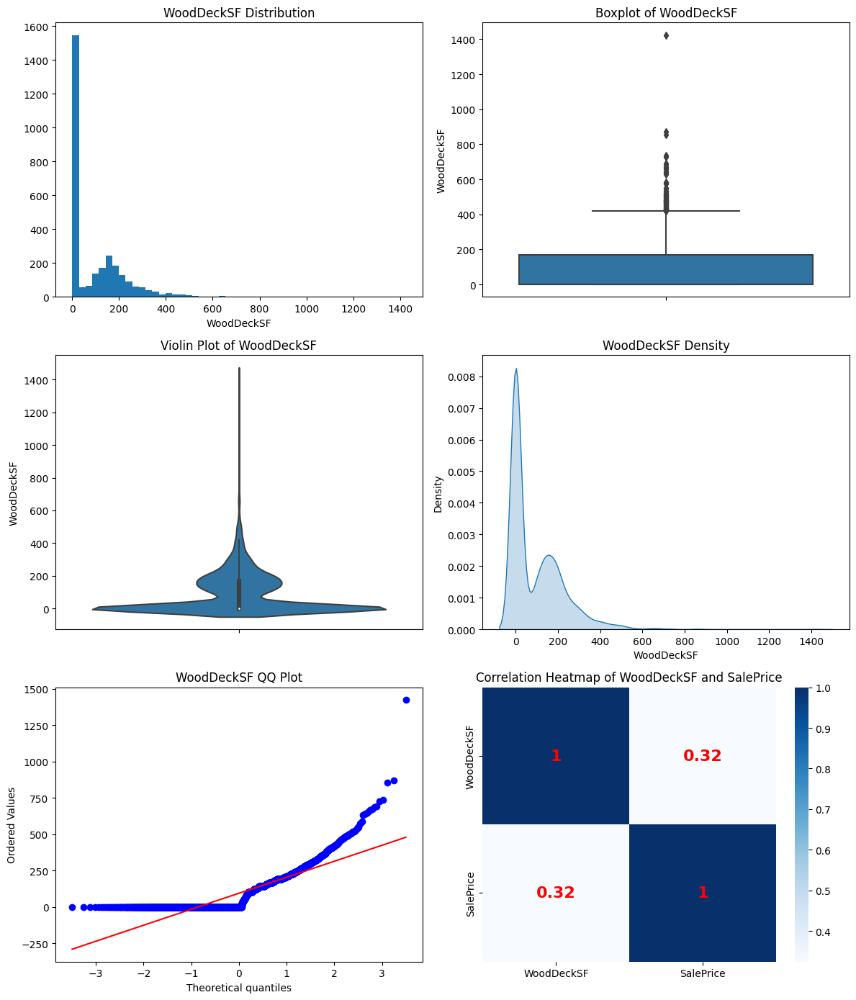

#####################################
count   2919.000
mean      47.487
std       67.575
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%       26.000
60%       40.000
70%       58.000
80%       85.000
90%      131.200
95%      183.100
99%      284.460
max      742.000
Name: OpenPorchSF, dtype: float64
Skewness: 2.54
Kurtosis: 10.94


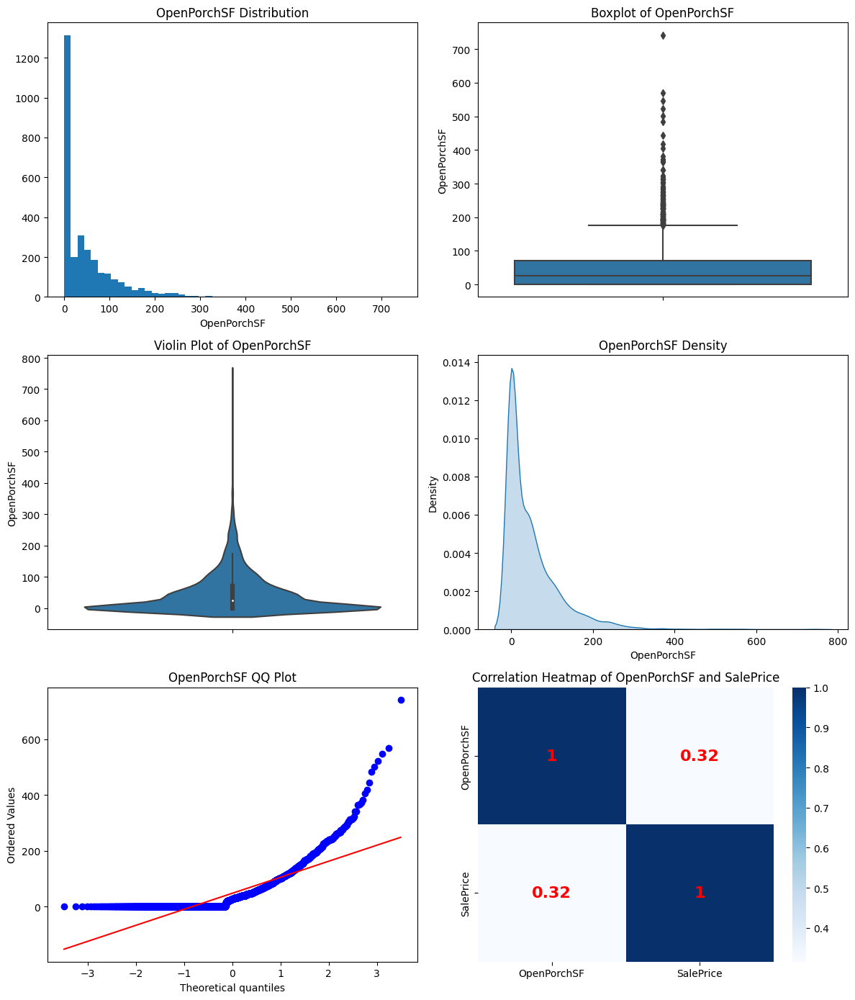

#####################################
count   2919.000
mean      23.098
std       64.244
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%      112.000
95%      176.000
99%      264.000
max     1012.000
Name: EnclosedPorch, dtype: float64
Skewness: 4.01
Kurtosis: 28.38


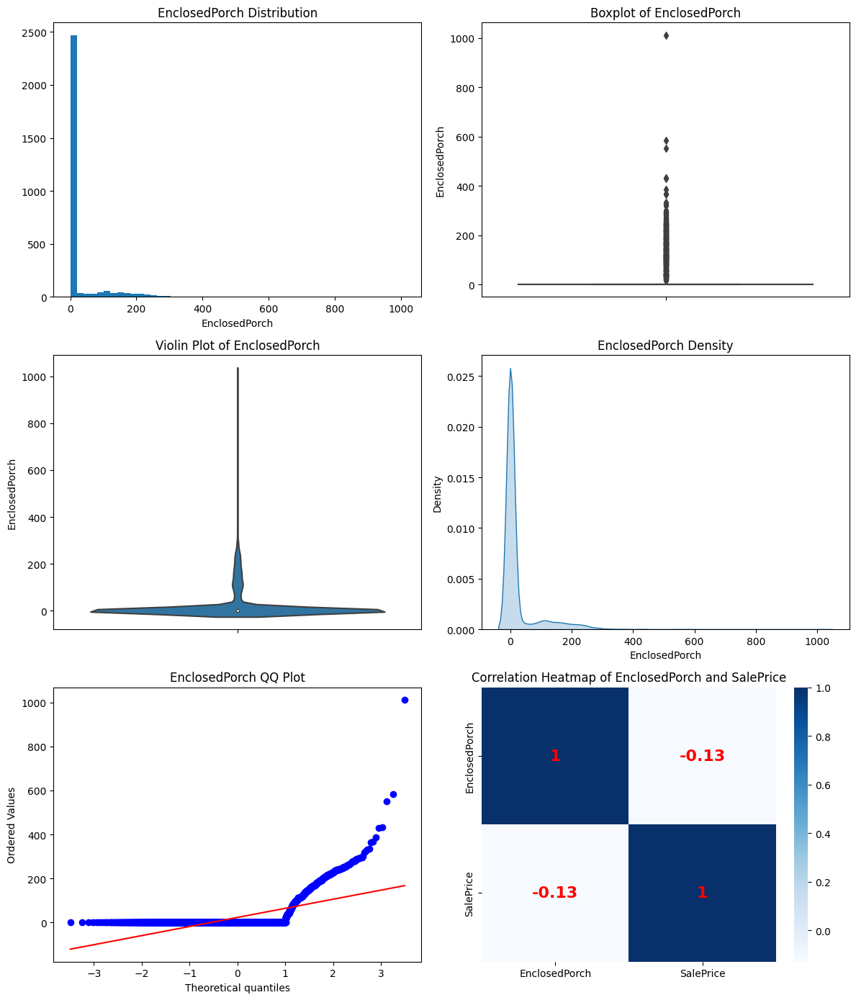

#####################################
count   2919.000
mean       2.602
std       25.188
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%        0.000
99%      144.000
max      508.000
Name: 3SsnPorch, dtype: float64
Skewness: 11.38
Kurtosis: 149.41


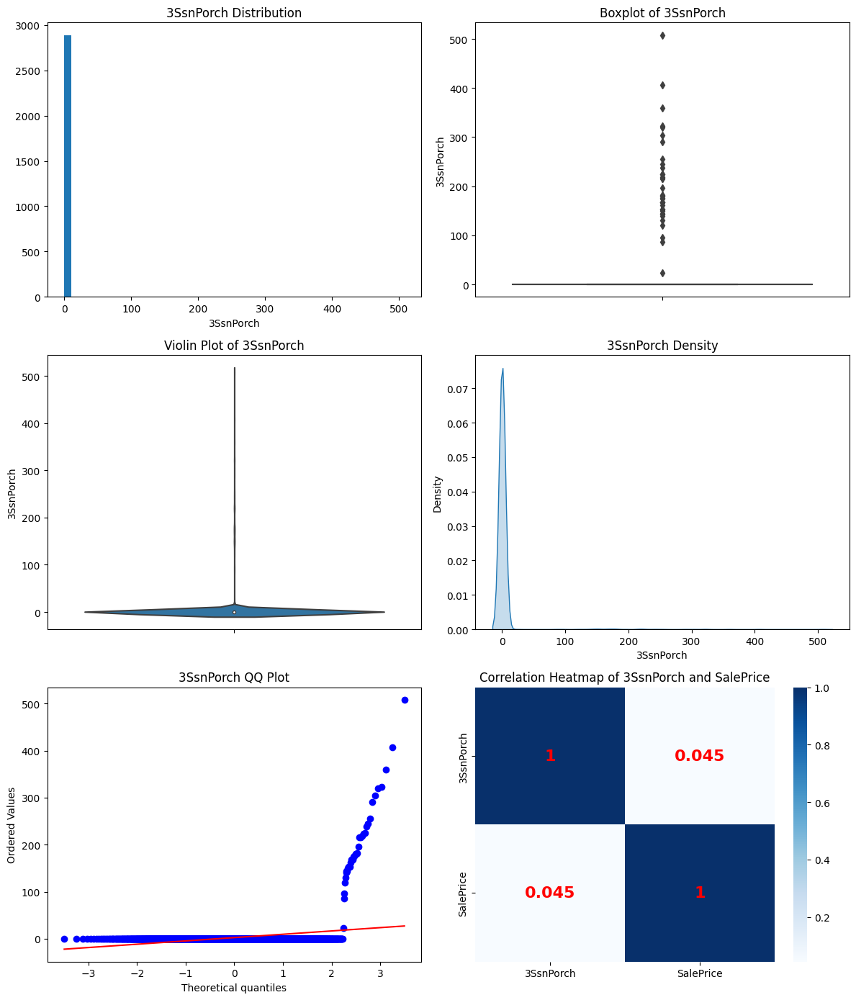

#####################################
count   2919.000
mean      16.062
std       56.184
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%      161.000
99%      259.820
max      576.000
Name: ScreenPorch, dtype: float64
Skewness: 3.95
Kurtosis: 17.78


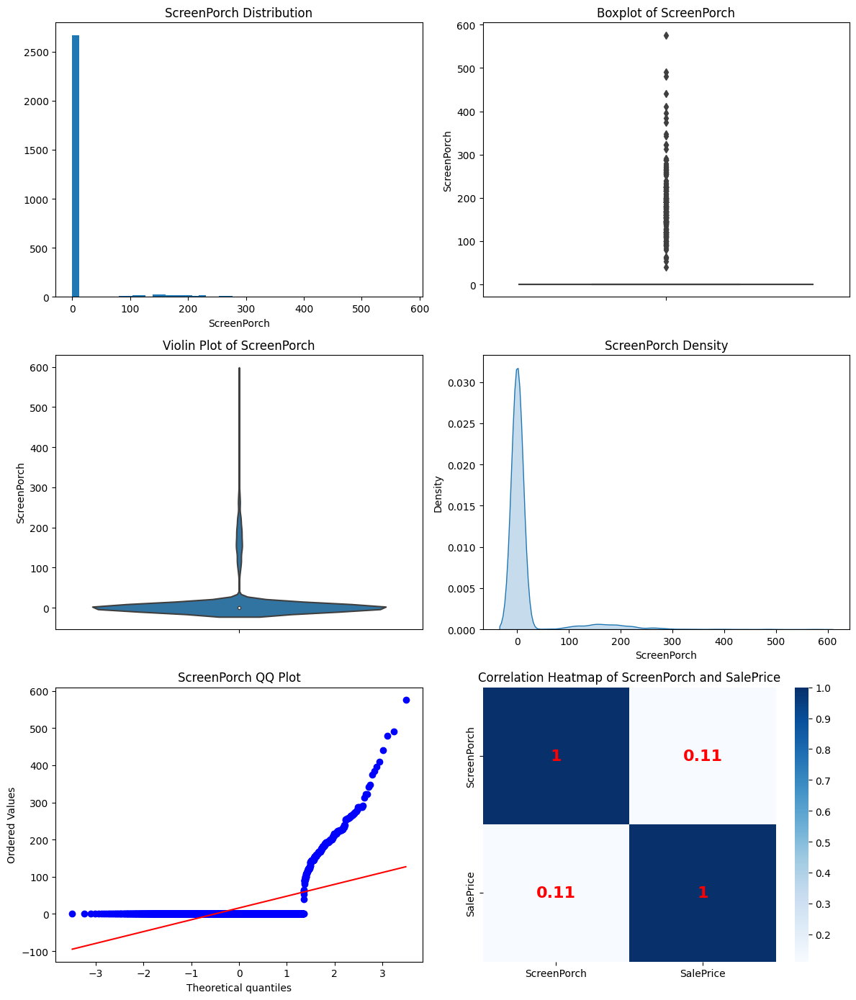

#####################################
count    2919.000
mean       50.826
std       567.402
min         0.000
5%          0.000
10%         0.000
20%         0.000
30%         0.000
40%         0.000
50%         0.000
60%         0.000
70%         0.000
80%         0.000
90%         0.000
95%         0.000
99%       982.000
max     17000.000
Name: MiscVal, dtype: float64
Skewness: 21.96
Kurtosis: 564.07


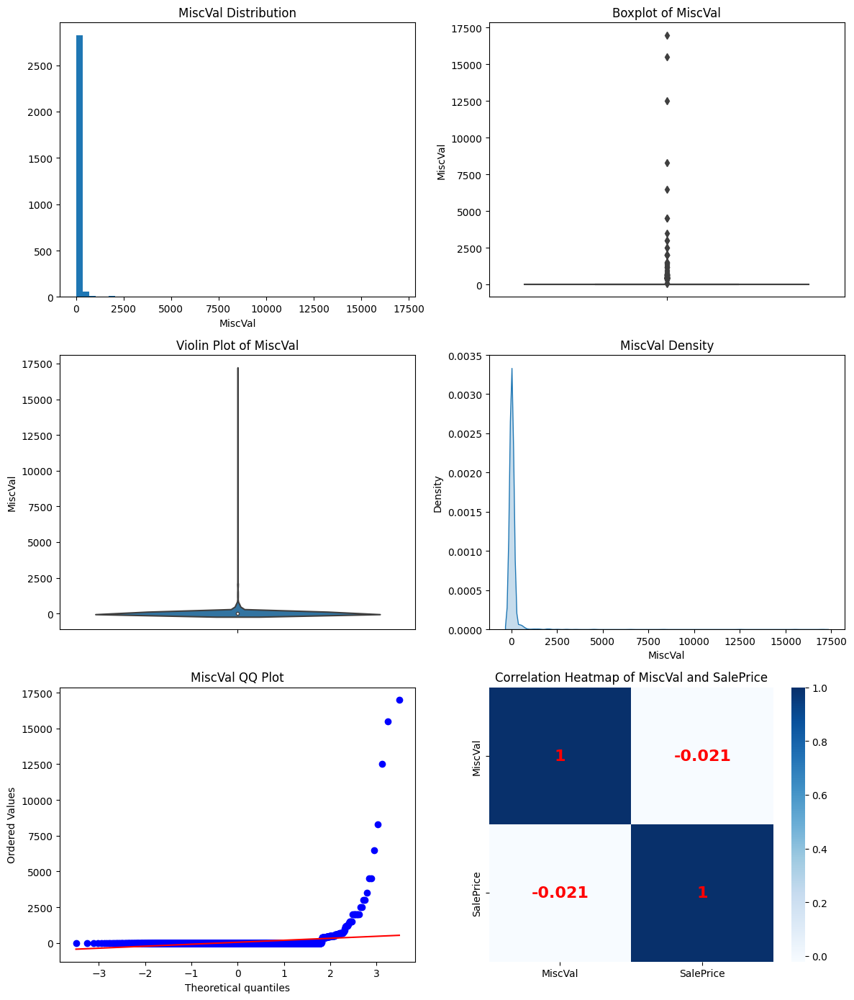

#####################################


In [14]:
for col in num_cols[:-1]: 
        num_summary(df, col, plot=True, target_col="SalePrice")

# <div style="border-radius:10px; border:#5E5772 solid; padding: 12px; background-color: #2995; font-size:100%; font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> STATISTICAL ANALYSIS </div>

In [15]:
def target_summary_with_cat(dataframe, target, categorical_col):
    print(pd.DataFrame({"TARGET_MEAN": dataframe.groupby(categorical_col)[target].mean()}), end="\n\n\n")

In [16]:
for col in cat_cols:
    target_summary_with_cat(df,"SalePrice",col)

          TARGET_MEAN
MSZoning             
C (all)     74528.000
FV         214014.062
RH         131558.375
RL         191004.995
RM         126316.830


        TARGET_MEAN
Street             
Grvl     130190.500
Pave     181130.539


       TARGET_MEAN
Alley             
Grvl    122219.080
Pave    168000.585


          TARGET_MEAN
LotShape             
IR1        206101.665
IR2        239833.366
IR3        216036.500
Reg        164754.818


             TARGET_MEAN
LandContour             
Bnk           143104.079
HLS           231533.940
Low           203661.111
Lvl           180183.747


           TARGET_MEAN
Utilities             
AllPub      180950.957
NoSeWa      137500.000


           TARGET_MEAN
LotConfig             
Corner      181623.426
CulDSac     223854.617
FR2         177934.574
FR3         208475.000
Inside      176938.048


           TARGET_MEAN
LandSlope             
Gtl         179956.800
Mod         196734.138
Sev         204379.231


            TARGET_MEAN


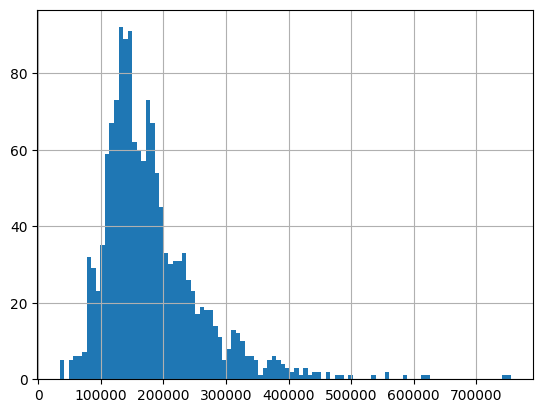

In [17]:
df["SalePrice"].hist(bins=100)
plt.show(block=True)

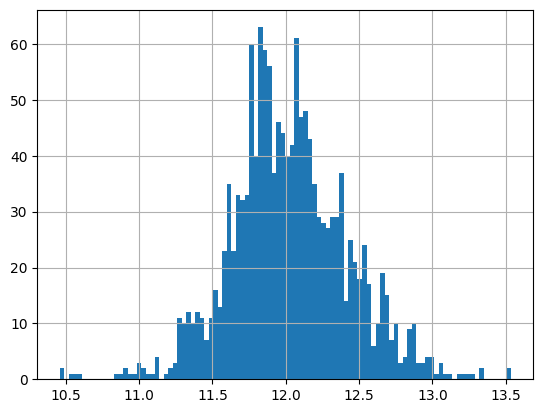

In [18]:
np.log1p(df['SalePrice']).hist(bins=100)
plt.show()

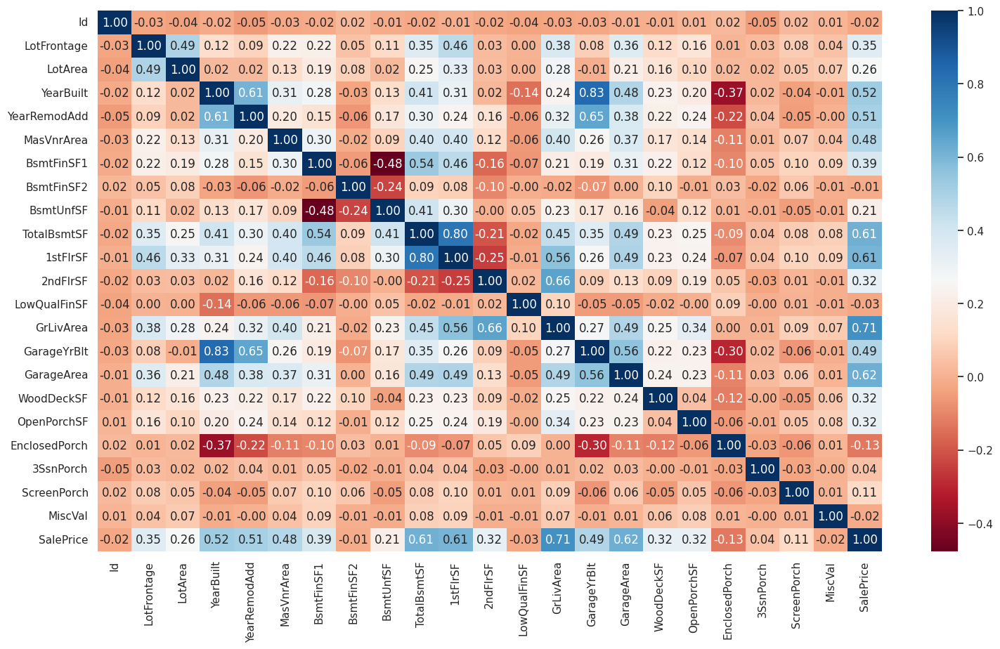

In [19]:
corr = df[num_cols].corr()
corr
sns.set(rc={'figure.figsize': (18, 10)})
sns.heatmap(corr, cmap="RdBu", annot=True, fmt=".2f")
plt.show()

# <div style="border-radius:10px; border:#5E5772 solid; padding: 12px; background-color: #2245; font-size:100%; font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> HANDLING OUTLIERS & MISSING VALUES </div>

In [20]:
def outlier_thresholds(dataframe, variable, low_quantile=0.10, up_quantile=0.90):
    quantile_one = dataframe[variable].quantile(low_quantile)
    quantile_three = dataframe[variable].quantile(up_quantile)
    interquantile_range = quantile_three - quantile_one
    up_limit = quantile_three + 1.5 * interquantile_range
    low_limit = quantile_one - 1.5 * interquantile_range
    return low_limit, up_limit

In [21]:
def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False

In [22]:
for col in num_cols:
    if col != "SalePrice":
      print(col, check_outlier(df, col))

Id False
LotFrontage True
LotArea True
YearBuilt False
YearRemodAdd False
MasVnrArea True
BsmtFinSF1 True
BsmtFinSF2 True
BsmtUnfSF False
TotalBsmtSF True
1stFlrSF True
2ndFlrSF False
LowQualFinSF True
GrLivArea True
GarageYrBlt True
GarageArea False
WoodDeckSF True
OpenPorchSF True
EnclosedPorch True
3SsnPorch True
ScreenPorch True
MiscVal True


In [23]:
def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

In [24]:
for col in num_cols:
    if col != "SalePrice":
        replace_with_thresholds(df,col)

In [25]:
for col in num_cols:
    if col != "SalePrice":
      print(col, check_outlier(df, col))

Id False
LotFrontage False
LotArea False
YearBuilt False
YearRemodAdd False
MasVnrArea False
BsmtFinSF1 False
BsmtFinSF2 False
BsmtUnfSF False
TotalBsmtSF False
1stFlrSF False
2ndFlrSF False
LowQualFinSF False
GrLivArea False
GarageYrBlt False
GarageArea False
WoodDeckSF False
OpenPorchSF False
EnclosedPorch False
3SsnPorch False
ScreenPorch False
MiscVal False


In [26]:
def missing_values_table(dataframe, na_name=False):
    na_columns = [col for col in dataframe.columns if dataframe[col].isnull().sum() > 0]

    n_miss = dataframe[na_columns].isnull().sum().sort_values(ascending=False)

    ratio = (dataframe[na_columns].isnull().sum() / dataframe.shape[0] * 100).sort_values(ascending=False)

    missing_df = pd.concat([n_miss, np.round(ratio, 2)], axis=1, keys=['n_miss', 'ratio'])

    print(missing_df, end="\n")

    if na_name:
        return na_columns

In [27]:
missing_values_table(df)


              n_miss  ratio
PoolQC          2909 99.660
MiscFeature     2814 96.400
Alley           2721 93.220
Fence           2348 80.440
MasVnrType      1766 60.500
SalePrice       1459 49.980
FireplaceQu     1420 48.650
LotFrontage      486 16.650
GarageCond       159  5.450
GarageYrBlt      159  5.450
GarageFinish     159  5.450
GarageQual       159  5.450
GarageType       157  5.380
BsmtExposure      82  2.810
BsmtCond          82  2.810
BsmtQual          81  2.770
BsmtFinType2      80  2.740
BsmtFinType1      79  2.710
MasVnrArea        23  0.790
MSZoning           4  0.140
Functional         2  0.070
BsmtHalfBath       2  0.070
BsmtFullBath       2  0.070
Utilities          2  0.070
KitchenQual        1  0.030
TotalBsmtSF        1  0.030
BsmtUnfSF          1  0.030
GarageCars         1  0.030
GarageArea         1  0.030
BsmtFinSF2         1  0.030
BsmtFinSF1         1  0.030
Exterior2nd        1  0.030
Exterior1st        1  0.030
SaleType           1  0.030
Electrical         1

In [28]:
df["Alley"].value_counts()

Alley
Grvl    120
Pave     78
Name: count, dtype: int64

In [29]:
df["BsmtQual"].value_counts()

BsmtQual
TA    1283
Gd    1209
Ex     258
Fa      88
Name: count, dtype: int64

In [30]:
no_cols = ["Alley","BsmtQual","BsmtCond","BsmtExposure","BsmtFinType1","BsmtFinType2","FireplaceQu",
           "GarageType","GarageFinish","GarageQual","GarageCond","PoolQC","Fence","MiscFeature"]

In [31]:
for col in no_cols:
    df[col].fillna("No",inplace=True)

In [32]:
missing_values_table(df)

              n_miss  ratio
MasVnrType      1766 60.500
SalePrice       1459 49.980
LotFrontage      486 16.650
GarageYrBlt      159  5.450
MasVnrArea        23  0.790
MSZoning           4  0.140
BsmtFullBath       2  0.070
BsmtHalfBath       2  0.070
Functional         2  0.070
Utilities          2  0.070
Exterior2nd        1  0.030
BsmtFinSF1         1  0.030
BsmtFinSF2         1  0.030
BsmtUnfSF          1  0.030
Exterior1st        1  0.030
Electrical         1  0.030
KitchenQual        1  0.030
GarageCars         1  0.030
GarageArea         1  0.030
SaleType           1  0.030
TotalBsmtSF        1  0.030


In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             2919 non-null   float64
 1   MSSubClass     2919 non-null   int64  
 2   MSZoning       2915 non-null   object 
 3   LotFrontage    2433 non-null   float64
 4   LotArea        2919 non-null   float64
 5   Street         2919 non-null   object 
 6   Alley          2919 non-null   object 
 7   LotShape       2919 non-null   object 
 8   LandContour    2919 non-null   object 
 9   Utilities      2917 non-null   object 
 10  LotConfig      2919 non-null   object 
 11  LandSlope      2919 non-null   object 
 12  Neighborhood   2919 non-null   object 
 13  Condition1     2919 non-null   object 
 14  Condition2     2919 non-null   object 
 15  BldgType       2919 non-null   object 
 16  HouseStyle     2919 non-null   object 
 17  OverallQual    2919 non-null   int64  
 18  OverallC

In [34]:
df['GarageYrBlt'].fillna(df['YearBuilt'], inplace=True)

In [35]:
df.loc[df['GarageYrBlt'] == 2207, 'GarageYrBlt'] = 2007

In [36]:
df['LotFrontage'] = df.groupby('Neighborhood')['LotFrontage'].transform(lambda x: x.fillna(x.median()))

df['MSZoning'] = df.groupby('MSSubClass')['MSZoning'].transform(lambda x: x.fillna(x.mode()[0]))

for col in ['Electrical', 'Utilities', 'Exterior1st', 'Exterior2nd', 'SaleType', 'KitchenQual']:
    df[col] = df.groupby(['Neighborhood', 'OverallQual'])[col].transform(lambda x: x.fillna(x.mode()[0]))

In [37]:
missing_values_table(df)

              n_miss  ratio
MasVnrType      1766 60.500
SalePrice       1459 49.980
MasVnrArea        23  0.790
BsmtFullBath       2  0.070
BsmtHalfBath       2  0.070
Functional         2  0.070
BsmtFinSF1         1  0.030
BsmtFinSF2         1  0.030
BsmtUnfSF          1  0.030
TotalBsmtSF        1  0.030
GarageCars         1  0.030
GarageArea         1  0.030


In [38]:
def quick_missing_imp(data, num_method="median", cat_length=20, target="SalePrice"):
    variables_with_na = [col for col in data.columns if data[col].isnull().sum() > 0]
    temp_target = data[target]

    print("# BEFORE")
    print(data[variables_with_na].isnull().sum(), "\n\n")
    data = data.apply(lambda x: x.fillna(x.mode()[0]) if (x.dtype == "O" and len(x.unique()) <= cat_length) else x, axis=0)

    if num_method == "mean":
        data = data.apply(lambda x: x.fillna(x.mean()) if x.dtype != "O" else x, axis=0)
    elif num_method == "median":
        data = data.apply(lambda x: x.fillna(x.median()) if x.dtype != "O" else x, axis=0)

    data[target] = temp_target

    print("# AFTER \n Imputation method is 'MODE' for categorical variables!")
    print(" Imputation method is '" + num_method.upper() + "' for numeric variables! \n")
    print(data[variables_with_na].isnull().sum(), "\n\n")

    return data

In [39]:
df = quick_missing_imp(df, num_method="median", cat_length=17)

# BEFORE
MasVnrType      1766
MasVnrArea        23
BsmtFinSF1         1
BsmtFinSF2         1
BsmtUnfSF          1
TotalBsmtSF        1
BsmtFullBath       2
BsmtHalfBath       2
Functional         2
GarageCars         1
GarageArea         1
SalePrice       1459
dtype: int64 


# AFTER 
 Imputation method is 'MODE' for categorical variables!
 Imputation method is 'MEDIAN' for numeric variables! 

MasVnrType         0
MasVnrArea         0
BsmtFinSF1         0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
BsmtFullBath       0
BsmtHalfBath       0
Functional         0
GarageCars         0
GarageArea         0
SalePrice       1459
dtype: int64 




In [40]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1.000,60,RL,65.000,8450.000,Pave,No,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856.000,854.000,0,1710.000,1.000,0.000,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0.000,61.000,0,0,0,0,No,No,No,0,2,2008,WD,Normal,208500.000
1,2.000,20,RL,80.000,9600.000,Pave,No,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976.000,Gable,CompShg,MetalSd,MetalSd,BrkFace,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262.000,0.000,0,1262.000,0.000,1.000,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298.000,0.000,0,0,0,0,No,No,No,0,5,2007,WD,Normal,181500.000
2,3.000,60,RL,68.000,11250.000,Pave,No,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920.000,866.000,0,1786.000,1.000,0.000,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0.000,42.000,0,0,0,0,No,No,No,0,9,2008,WD,Normal,223500.000
3,4.000,70,RL,60.000,9550.000,Pave,No,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970.000,Gable,CompShg,Wd Sdng,Wd Shng,BrkFace,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961.000,756.000,0,1717.000,1.000,0.000,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0.000,35.000,272,0,0,0,No,No,No,0,2,2006,WD,Abnorml,140000.000
4,5.000,60,RL,84.000,14260.000,Pave,No,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145.000,1053.000,0,2198.000,1.000,0.000,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192.000,84.000,0,0,0,0,No,No,No,0,12,2008,WD,Normal,250000.000


In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             2919 non-null   float64
 1   MSSubClass     2919 non-null   int64  
 2   MSZoning       2919 non-null   object 
 3   LotFrontage    2919 non-null   float64
 4   LotArea        2919 non-null   float64
 5   Street         2919 non-null   object 
 6   Alley          2919 non-null   object 
 7   LotShape       2919 non-null   object 
 8   LandContour    2919 non-null   object 
 9   Utilities      2919 non-null   object 
 10  LotConfig      2919 non-null   object 
 11  LandSlope      2919 non-null   object 
 12  Neighborhood   2919 non-null   object 
 13  Condition1     2919 non-null   object 
 14  Condition2     2919 non-null   object 
 15  BldgType       2919 non-null   object 
 16  HouseStyle     2919 non-null   object 
 17  OverallQual    2919 non-null   int64  
 18  OverallC

In [42]:
df['MSSubClass'] = df['MSSubClass'].astype('object')
df['MoSold'] = df['MoSold'].astype('object')

# <div style="border-radius:10px; border:#5E5772 solid; padding: 12px; background-color: #2995; font-size:100%; font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> RARE VALUES </div>

In [43]:
def rare_analyser(dataframe, target, cat_cols):
    for col in cat_cols:
        print(col, ":", len(dataframe[col].value_counts()))
        print(pd.DataFrame({"COUNT": dataframe[col].value_counts(),
                            "RATIO": dataframe[col].value_counts() / len(dataframe),
                            "TARGET_MEAN": dataframe.groupby(col)[target].mean()}), end="\n\n\n")

rare_analyser(df, "SalePrice", cat_cols)

MSZoning : 5
          COUNT  RATIO  TARGET_MEAN
MSZoning                           
C (all)      25  0.009    74528.000
FV          139  0.048   214014.062
RH           26  0.009   131558.375
RL         2267  0.777   191004.995
RM          462  0.158   126316.830


Street : 2
        COUNT  RATIO  TARGET_MEAN
Street                           
Grvl       12  0.004   130190.500
Pave     2907  0.996   181130.539


Alley : 3
       COUNT  RATIO  TARGET_MEAN
Alley                           
Grvl     120  0.041   122219.080
No      2721  0.932   183452.131
Pave      78  0.027   168000.585


LotShape : 4
          COUNT  RATIO  TARGET_MEAN
LotShape                           
IR1         968  0.332   206101.665
IR2          76  0.026   239833.366
IR3          16  0.005   216036.500
Reg        1859  0.637   164754.818


LandContour : 4
             COUNT  RATIO  TARGET_MEAN
LandContour                           
Bnk            117  0.040   143104.079
HLS            120  0.041   231533.940
Low 

In [44]:
def rare_encoder(dataframe, rare_perc):
    temp_df = dataframe.copy()

    rare_columns = [col for col in temp_df.columns if temp_df[col].dtypes == 'O'
                    and (temp_df[col].value_counts() / len(temp_df) < rare_perc).any(axis=None)]

    for var in rare_columns:
        tmp = temp_df[var].value_counts() / len(temp_df)
        rare_labels = tmp[tmp < rare_perc].index
        temp_df[var] = np.where(temp_df[var].isin(rare_labels), 'Rare', temp_df[var])

    return temp_df

In [45]:
df = rare_encoder(df,0.01)

In [46]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1.000,60,RL,65.000,8450.000,Pave,No,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856.000,854.000,0,1710.000,1.000,0.000,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0.000,61.000,0,0,0,0,No,No,No,0,2,2008,WD,Normal,208500.000
1,2.000,20,RL,80.000,9600.000,Pave,No,Reg,Lvl,AllPub,FR2,Gtl,Rare,Feedr,Norm,1Fam,1Story,6,8,1976,1976.000,Gable,CompShg,MetalSd,MetalSd,BrkFace,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262.000,0.000,0,1262.000,0.000,1.000,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298.000,0.000,0,0,0,0,No,No,No,0,5,2007,WD,Normal,181500.000
2,3.000,60,RL,68.000,11250.000,Pave,No,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920.000,866.000,0,1786.000,1.000,0.000,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0.000,42.000,0,0,0,0,No,No,No,0,9,2008,WD,Normal,223500.000
3,4.000,70,RL,60.000,9550.000,Pave,No,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970.000,Gable,CompShg,Wd Sdng,Wd Shng,BrkFace,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961.000,756.000,0,1717.000,1.000,0.000,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0.000,35.000,272,0,0,0,No,No,No,0,2,2006,WD,Abnorml,140000.000
4,5.000,60,RL,84.000,14260.000,Pave,No,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145.000,1053.000,0,2198.000,1.000,0.000,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192.000,84.000,0,0,0,0,No,No,No,0,12,2008,WD,Normal,250000.000


# <div style="border-radius:10px; border:#5E5772 solid; padding: 12px; background-color: #2995; font-size:100%; font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> FEATURE ENGINEERING </div>

In [47]:
df["NEW_1st*GrLiv"] = df["1stFlrSF"] * df["GrLivArea"]

df["NEW_Garage*GrLiv"] = (df["GarageArea"] * df["GrLivArea"])

# Total Floor
df["NEW_TotalFlrSF"] = df["1stFlrSF"] + df["2ndFlrSF"]

# Total Finished Basement Area
df["NEW_TotalBsmtFin"] = df["BsmtFinSF1"] + df["BsmtFinSF2"]

# Porch Area
df["NEW_PorchArea"] = df["OpenPorchSF"] + df["EnclosedPorch"] + df["ScreenPorch"] + df["3SsnPorch"] + df["WoodDeckSF"]

# Total House Area
df["NEW_TotalHouseArea"] = df["NEW_TotalFlrSF"] + df["TotalBsmtSF"]

df["NEW_TotalSqFeet"] = df["GrLivArea"] + df["TotalBsmtSF"]


# Lot Ratio
df["NEW_LotRatio"] = df["GrLivArea"] / df["LotArea"]

df["NEW_RatioArea"] = df["NEW_TotalHouseArea"] / df["LotArea"]

df["NEW_GarageLotRatio"] = df["GarageArea"] / df["LotArea"]

# MasVnrArea
df["NEW_MasVnrRatio"] = df["MasVnrArea"] / df["NEW_TotalHouseArea"]

# Dif Area
df["NEW_DifArea"] = df["LotArea"] - df["1stFlrSF"] - df["GarageArea"] - df["NEW_PorchArea"] - df["WoodDeckSF"]


df["NEW_OverallGrade"] = df["OverallQual"] * df["OverallCond"]


df["NEW_Restoration"] = df["YearRemodAdd"] - df["YearBuilt"]

df["NEW_HouseAge"] = df["YrSold"] - df["YearBuilt"]

df["NEW_RestorationAge"] = df["YrSold"] - df["YearRemodAdd"]

df["NEW_GarageAge"] = df["GarageYrBlt"] - df["YearBuilt"]

df["NEW_GarageRestorationAge"] = np.abs(df["GarageYrBlt"] - df["YearRemodAdd"])

df["NEW_GarageSold"] = df["YrSold"] - df["GarageYrBlt"]

df["NEW_BsmtFinSFRatio"] = df["BsmtFinSF1"] / df["TotalBsmtSF"]
df["NEW_BsmtFinSFRatio"].fillna(df["NEW_BsmtFinSFRatio"].median(), inplace=True)

df["NEW_AvgRoomSize"] = df["GrLivArea"] / df["TotRmsAbvGrd"]

df["NEW_TotalBath"] = df["FullBath"] + 0.5 * df["HalfBath"] + df["BsmtFullBath"] + 0.5 * df["BsmtHalfBath"]

df["NEW_TotalRooms"] = df["TotRmsAbvGrd"] + df["BedroomAbvGr"]

df["NEW_BuildingToLotRatio"] = df["NEW_TotalHouseArea"] / df["LotArea"]

df["NEW_OutdoorSpaceRatio"] = df["NEW_PorchArea"] / df["NEW_TotalHouseArea"]

df["NEW_FinishingRatio"] = (df["NEW_TotalFlrSF"] + df["NEW_TotalBsmtFin"]) / df["NEW_TotalHouseArea"]

In [48]:
new_columns = [
    "NEW_1st*GrLiv", "NEW_Garage*GrLiv", "NEW_TotalFlrSF", "NEW_TotalBsmtFin", "NEW_PorchArea",
    "NEW_TotalHouseArea", "NEW_TotalSqFeet", "NEW_LotRatio", "NEW_RatioArea", "NEW_GarageLotRatio",
    "NEW_MasVnrRatio", "NEW_DifArea", "NEW_OverallGrade", "NEW_Restoration", "NEW_HouseAge",
    "NEW_RestorationAge", "NEW_GarageAge", "NEW_GarageRestorationAge", "NEW_GarageSold",
    "NEW_BsmtFinSFRatio", "NEW_AvgRoomSize", "NEW_TotalBath", "NEW_TotalRooms",
    "NEW_BuildingToLotRatio", "NEW_OutdoorSpaceRatio", "NEW_FinishingRatio"]

In [49]:
df[new_columns]

,NEW_1st*GrLiv,NEW_Garage*GrLiv,NEW_TotalFlrSF,NEW_TotalBsmtFin,NEW_PorchArea,NEW_TotalHouseArea,NEW_TotalSqFeet,NEW_LotRatio,NEW_RatioArea,NEW_GarageLotRatio,NEW_MasVnrRatio,NEW_DifArea,NEW_OverallGrade,NEW_Restoration,NEW_HouseAge,NEW_RestorationAge,NEW_GarageAge,NEW_GarageRestorationAge,NEW_GarageSold,NEW_BsmtFinSFRatio,NEW_AvgRoomSize,NEW_TotalBath,NEW_TotalRooms,NEW_BuildingToLotRatio,NEW_OutdoorSpaceRatio,NEW_FinishingRatio
0,1463760.000,937080.000,1710.000,706.000,61.000,2566.000,2566.000,0.202,0.304,0.065,0.076,6985.000,35,0.000,5,5.000,0.000,0.000,5.000,0.825,213.750,3.500,11,0.304,0.024,0.942
1,1592644.000,580520.000,1262.000,978.000,298.000,2524.000,2524.000,0.131,0.263,0.048,0.000,7282.000,48,0.000,31,31.000,0.000,0.000,31.000,0.775,210.333,2.500,9,0.263,0.118,0.887
2,1643120.000,1085888.000,1786.000,486.000,42.000,2706.000,2706.000,0.159,0.241,0.054,0.060,9680.000,35,1.000,7,6.000,0.000,1.000,7.000,0.528,297.667,3.500,9,0.241,0.016,0.840
3,1650037.000,1102314.000,1717.000,216.000,307.000,2473.000,2473.000,0.180,0.259,0.067,0.000,7640.000,35,55.000,91,36.000,83.000,28.000,8.000,0.286,245.286,2.000,10,0.259,0.124,0.782
4,2516710.000,1837528.000,2198.000,655.000,276.000,3343.000,3343.000,0.154,0.234,0.059,0.105,11811.000,40,0.000,8,8.000,0.000,0.000,8.000,0.572,244.222,3.500,13,0.234,0.083,0.853
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,596232.000,0.000,1092.000,0.000,0.000,1638.000,1638.000,0.564,0.846,0.000,0.000,1390.000,28,0.000,36,36.000,0.000,0.000,36.000,0.000,218.400,1.500,8,0.846,0.000,0.667
2915,596232.000,312312.000,1092.000,252.000,24.000,1638.000,1638.000,0.577,0.865,0.151,0.000,1038.000,20,0.000,36,36.000,0.000,0.000,36.000,0.462,182.000,1.500,9,0.865,0.015,0.821
2916,1498176.000,705024.000,1224.000,1224.000,474.000,2448.000,2448.000,0.061,0.122,0.029,0.000,17252.000,35,36.000,46,10.000,0.000,36.000,46.000,1.000,174.857,2.000,11,0.122,0.194,1.000
2917,940900.000,0.000,970.000,337.000,112.000,1882.000,1882.000,0.093,0.180,0.000,0.000,9279.000,25,0.000,14,14.000,0.000,0.000,14.000,0.370,161.667,1.500,9,0.180,0.060,0.694


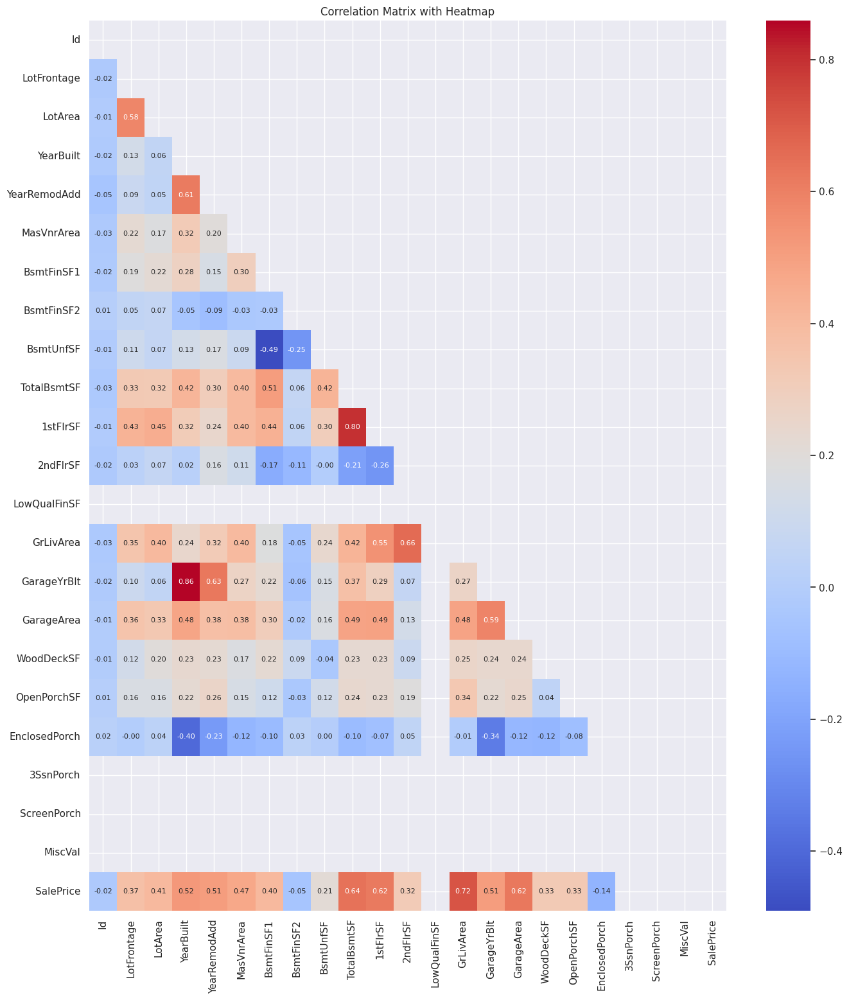

In [50]:
corr_matrix = df[num_cols].corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
plt.figure(figsize=(16, 18))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 8})
plt.title('Correlation Matrix with Heatmap')
plt.show()

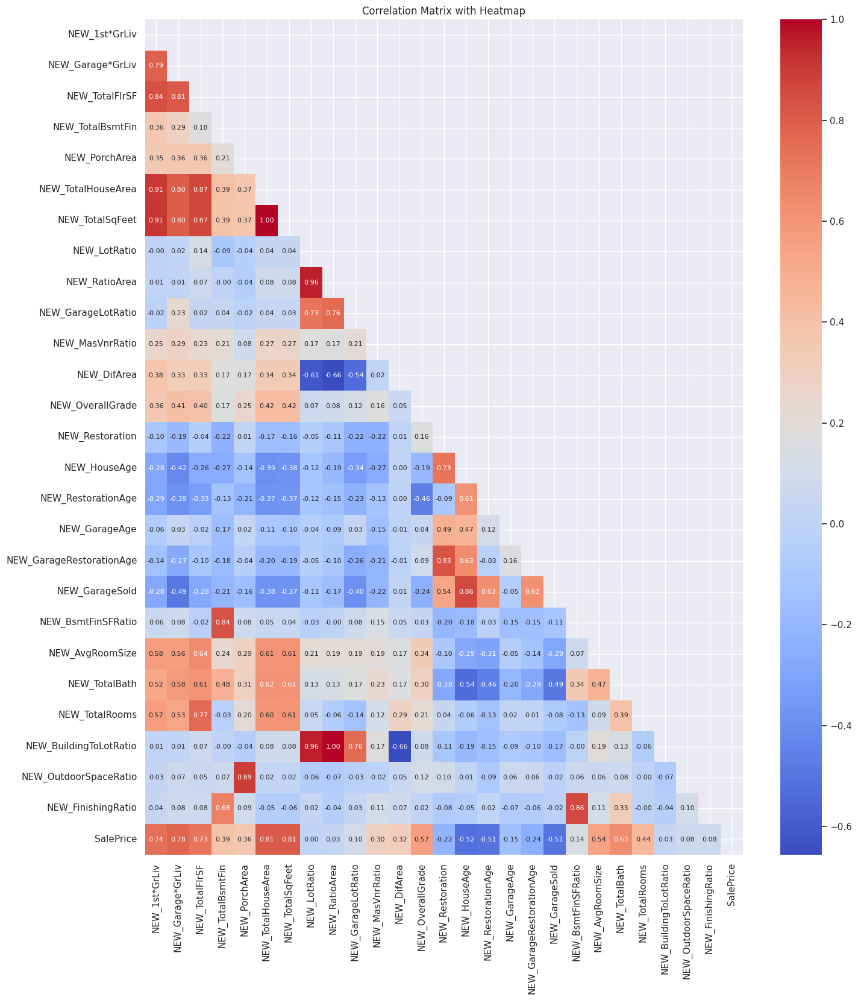

In [51]:
target_variable = "SalePrice"
df_new = df[new_columns + [target_variable]]
corr_matrix = df_new.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
plt.figure(figsize=(16, 18))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 8})
plt.title('Correlation Matrix with Heatmap')
plt.show()

In [52]:
drop_list = ["Street", "Alley", "LandContour", "Utilities", "LandSlope","Heating", "PoolQC", "MiscFeature","Neighborhood","Id","BsmtFinSF2","EnclosedPorch","NEW_LotRatio","NEW_RatioArea","NEW_GarageLotRatio","NEW_BuildingToLotRatio","NEW_OutdoorSpaceRatio","NEW_FinishingRatio"]

df.drop(drop_list, axis=1, inplace=True)

In [53]:
cat_cols, cat_but_car, num_cols = grab_col_names(df)

def label_encoder(dataframe, binary_col):
    labelencoder = LabelEncoder()
    dataframe[binary_col] = labelencoder.fit_transform(dataframe[binary_col])
    return dataframe

Observations: 2919
Variables: 89
cat_cols: 55
num_cols: 34
cat_but_car: 0
num_but_cat: 19


In [54]:
binary_cols = [col for col in df.columns if df[col].dtypes == "O" and len(df[col].unique()) == 2]

for col in binary_cols:
    label_encoder(df, col)

In [55]:
binary_cols

['Condition2', 'RoofMatl', 'CentralAir']

In [56]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,NEW_1st*GrLiv,NEW_Garage*GrLiv,NEW_TotalFlrSF,NEW_TotalBsmtFin,NEW_PorchArea,NEW_TotalHouseArea,NEW_TotalSqFeet,NEW_MasVnrRatio,NEW_DifArea,NEW_OverallGrade,NEW_Restoration,NEW_HouseAge,NEW_RestorationAge,NEW_GarageAge,NEW_GarageRestorationAge,NEW_GarageSold,NEW_BsmtFinSFRatio,NEW_AvgRoomSize,NEW_TotalBath,NEW_TotalRooms
0,60,RL,65.000,8450.000,Reg,Inside,Norm,0,1Fam,2Story,7,5,2003,2003.000,Gable,0,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,150.000,856.000,Ex,1,SBrkr,856.000,854.000,0,1710.000,1.000,0.000,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0.000,61.000,0,0,0,No,0,2,2008,WD,Normal,208500.000,1463760.000,937080.000,1710.000,706.000,61.000,2566.000,2566.000,0.076,6985.000,35,0.000,5,5.000,0.000,0.000,5.000,0.825,213.750,3.500,11
1,20,RL,80.000,9600.000,Reg,FR2,Feedr,0,1Fam,1Story,6,8,1976,1976.000,Gable,0,MetalSd,MetalSd,BrkFace,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,284.000,1262.000,Ex,1,SBrkr,1262.000,0.000,0,1262.000,0.000,1.000,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298.000,0.000,0,0,0,No,0,5,2007,WD,Normal,181500.000,1592644.000,580520.000,1262.000,978.000,298.000,2524.000,2524.000,0.000,7282.000,48,0.000,31,31.000,0.000,0.000,31.000,0.775,210.333,2.500,9
2,60,RL,68.000,11250.000,IR1,Inside,Norm,0,1Fam,2Story,7,5,2001,2002.000,Gable,0,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,434.000,920.000,Ex,1,SBrkr,920.000,866.000,0,1786.000,1.000,0.000,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0.000,42.000,0,0,0,No,0,9,2008,WD,Normal,223500.000,1643120.000,1085888.000,1786.000,486.000,42.000,2706.000,2706.000,0.060,9680.000,35,1.000,7,6.000,0.000,1.000,7.000,0.528,297.667,3.500,9
3,70,RL,60.000,9550.000,IR1,Corner,Norm,0,1Fam,2Story,7,5,1915,1970.000,Gable,0,Wd Sdng,Wd Shng,BrkFace,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,540.000,756.000,Gd,1,SBrkr,961.000,756.000,0,1717.000,1.000,0.000,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0.000,35.000,0,0,0,No,0,2,2006,WD,Abnorml,140000.000,1650037.000,1102314.000,1717.000,216.000,307.000,2473.000,2473.000,0.000,7640.000,35,55.000,91,36.000,83.000,28.000,8.000,0.286,245.286,2.000,10
4,60,RL,84.000,14260.000,IR1,FR2,Norm,0,1Fam,2Story,8,5,2000,2000.000,Gable,0,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,490.000,1145.000,Ex,1,SBrkr,1145.000,1053.000,0,2198.000,1.000,0.000,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192.000,84.000,0,0,0,No,0,12,2008,WD,Normal,250000.000,2516710.000,1837528.000,2198.000,655.000,276.000,3343.000,3343.000,0.105,11811.000,40,0.000,8,8.000,0.000,0.000,8.000,0.572,244.222,3.500,13


In [57]:
def one_hot_encoder(dataframe, categorical_cols, drop_first=True):
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first, dtype = int)
    return dataframe
df = one_hot_encoder(df, cat_cols, drop_first=True)

In [58]:
df.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,SalePrice,NEW_1st*GrLiv,NEW_Garage*GrLiv,NEW_TotalFlrSF,NEW_TotalBsmtFin,NEW_PorchArea,NEW_TotalHouseArea,NEW_TotalSqFeet,NEW_MasVnrRatio,NEW_DifArea,NEW_OverallGrade,NEW_Restoration,NEW_HouseAge,NEW_RestorationAge,NEW_GarageAge,NEW_GarageRestorationAge,NEW_GarageSold,NEW_BsmtFinSFRatio,NEW_AvgRoomSize,MSSubClass_30,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_190,MSSubClass_Rare,MSZoning_RL,MSZoning_RM,MSZoning_Rare,LotShape_IR2,LotShape_Rare,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,LotConfig_Rare,Condition1_Feedr,Condition1_Norm,Condition1_PosN,Condition1_RRAn,Condition1_Rare,Condition2_1,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Rare,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Hip,RoofStyle_Rare,RoofMatl_1,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Rare,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Rare,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_Rare,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Gd,ExterCond_Rare,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Rare,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Rare,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Rare,HeatingQC_TA,CentralAir_1,Electrical_FuseF,Electrical_Rare,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min2,Functional_Mod,Functional_Rare,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Basment,GarageType_BuiltIn,GarageType_Detchd,GarageType_No,GarageType_Rare,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_No,GarageQual_Rare,GarageQual_TA,GarageCond_No,GarageCond_Rare,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_No,Fence_Rare,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,SaleType_New,SaleType_Rare,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_Rare,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,BsmtFullBath_1.0,BsmtFullBath_2.0,BsmtFullBath_3.0,BsmtHalfBath_1.0,BsmtHalfBath_2.0,FullBath_1,FullBath_2,FullBath_3,FullBath_4,HalfBath_1,HalfBath_2,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenAbvGr_1,KitchenAbvGr_2,KitchenAbvGr_3,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_13,TotRmsAbvGrd_14,TotRmsAbvGrd_15,Fireplaces_1,Fireplaces_2,Fireplaces_3,Fireplaces_4,GarageCars_1.0,GarageCars_2.0,GarageCars_3.0,GarageCars_4.0,GarageCars_5.0,PoolArea_144,PoolArea_228,PoolArea_368,PoolArea_444,PoolArea_480,PoolArea_512,PoolArea_519,PoolArea_555,PoolArea_561,PoolArea_576,PoolArea_648,PoolArea_738,PoolArea_800,YrSold_2007,YrSold_2008,YrSold_2009,YrSold_2010,NEW_TotalBath_1.5,NEW_TotalBath_2.0,NEW_TotalBath_2.5,NEW_TotalBath_3.0,NEW_TotalBath_3.5,NEW_TotalBath_4.0,NEW_TotalBath_4.5,NEW

In [59]:
df[df['SalePrice'].notnull()]

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,SalePrice,NEW_1st*GrLiv,NEW_Garage*GrLiv,NEW_TotalFlrSF,NEW_TotalBsmtFin,NEW_PorchArea,NEW_TotalHouseArea,NEW_TotalSqFeet,NEW_MasVnrRatio,NEW_DifArea,NEW_OverallGrade,NEW_Restoration,NEW_HouseAge,NEW_RestorationAge,NEW_GarageAge,NEW_GarageRestorationAge,NEW_GarageSold,NEW_BsmtFinSFRatio,NEW_AvgRoomSize,MSSubClass_30,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_190,MSSubClass_Rare,MSZoning_RL,MSZoning_RM,MSZoning_Rare,LotShape_IR2,LotShape_Rare,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,LotConfig_Rare,Condition1_Feedr,Condition1_Norm,Condition1_PosN,Condition1_RRAn,Condition1_Rare,Condition2_1,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Rare,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Hip,RoofStyle_Rare,RoofMatl_1,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Rare,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Rare,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_Rare,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Gd,ExterCond_Rare,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Rare,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Rare,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Rare,HeatingQC_TA,CentralAir_1,Electrical_FuseF,Electrical_Rare,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min2,Functional_Mod,Functional_Rare,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Basment,GarageType_BuiltIn,GarageType_Detchd,GarageType_No,GarageType_Rare,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_No,GarageQual_Rare,GarageQual_TA,GarageCond_No,GarageCond_Rare,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_No,Fence_Rare,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,SaleType_New,SaleType_Rare,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_Rare,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,BsmtFullBath_1.0,BsmtFullBath_2.0,BsmtFullBath_3.0,BsmtHalfBath_1.0,BsmtHalfBath_2.0,FullBath_1,FullBath_2,FullBath_3,FullBath_4,HalfBath_1,HalfBath_2,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenAbvGr_1,KitchenAbvGr_2,KitchenAbvGr_3,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_13,TotRmsAbvGrd_14,TotRmsAbvGrd_15,Fireplaces_1,Fireplaces_2,Fireplaces_3,Fireplaces_4,GarageCars_1.0,GarageCars_2.0,GarageCars_3.0,GarageCars_4.0,GarageCars_5.0,PoolArea_144,PoolArea_228,PoolArea_368,PoolArea_444,PoolArea_480,PoolArea_512,PoolArea_519,PoolArea_555,PoolArea_561,PoolArea_576,PoolArea_648,PoolArea_738,PoolArea_800,YrSold_2007,YrSold_2008,YrSold_2009,YrSold_2010,NEW_TotalBath_1.5,NEW_TotalBath_2.0,NEW_TotalBath_2.5,NEW_TotalBath_3.0,NEW_TotalBath_3.5,NEW_TotalBath_4.0,NEW_TotalBath_4.5,NEW

In [60]:
df[df['SalePrice'].isnull()]

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,SalePrice,NEW_1st*GrLiv,NEW_Garage*GrLiv,NEW_TotalFlrSF,NEW_TotalBsmtFin,NEW_PorchArea,NEW_TotalHouseArea,NEW_TotalSqFeet,NEW_MasVnrRatio,NEW_DifArea,NEW_OverallGrade,NEW_Restoration,NEW_HouseAge,NEW_RestorationAge,NEW_GarageAge,NEW_GarageRestorationAge,NEW_GarageSold,NEW_BsmtFinSFRatio,NEW_AvgRoomSize,MSSubClass_30,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_190,MSSubClass_Rare,MSZoning_RL,MSZoning_RM,MSZoning_Rare,LotShape_IR2,LotShape_Rare,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,LotConfig_Rare,Condition1_Feedr,Condition1_Norm,Condition1_PosN,Condition1_RRAn,Condition1_Rare,Condition2_1,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Rare,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Hip,RoofStyle_Rare,RoofMatl_1,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Rare,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Rare,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_Rare,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Gd,ExterCond_Rare,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Rare,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Rare,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Rare,HeatingQC_TA,CentralAir_1,Electrical_FuseF,Electrical_Rare,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min2,Functional_Mod,Functional_Rare,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Basment,GarageType_BuiltIn,GarageType_Detchd,GarageType_No,GarageType_Rare,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_No,GarageQual_Rare,GarageQual_TA,GarageCond_No,GarageCond_Rare,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_No,Fence_Rare,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,SaleType_New,SaleType_Rare,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_Rare,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,BsmtFullBath_1.0,BsmtFullBath_2.0,BsmtFullBath_3.0,BsmtHalfBath_1.0,BsmtHalfBath_2.0,FullBath_1,FullBath_2,FullBath_3,FullBath_4,HalfBath_1,HalfBath_2,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenAbvGr_1,KitchenAbvGr_2,KitchenAbvGr_3,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_13,TotRmsAbvGrd_14,TotRmsAbvGrd_15,Fireplaces_1,Fireplaces_2,Fireplaces_3,Fireplaces_4,GarageCars_1.0,GarageCars_2.0,GarageCars_3.0,GarageCars_4.0,GarageCars_5.0,PoolArea_144,PoolArea_228,PoolArea_368,PoolArea_444,PoolArea_480,PoolArea_512,PoolArea_519,PoolArea_555,PoolArea_561,PoolArea_576,PoolArea_648,PoolArea_738,PoolArea_800,YrSold_2007,YrSold_2008,YrSold_2009,YrSold_2010,NEW_TotalBath_1.5,NEW_TotalBath_2.0,NEW_TotalBath_2.5,NEW_TotalBath_3.0,NEW_TotalBath_3.5,NEW_TotalBath_4.0,NEW_TotalBath_4.5,NEW

In [61]:
train_df = df[df['SalePrice'].notnull()]
test_df = df[df['SalePrice'].isnull()]

In [62]:
test_df

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,SalePrice,NEW_1st*GrLiv,NEW_Garage*GrLiv,NEW_TotalFlrSF,NEW_TotalBsmtFin,NEW_PorchArea,NEW_TotalHouseArea,NEW_TotalSqFeet,NEW_MasVnrRatio,NEW_DifArea,NEW_OverallGrade,NEW_Restoration,NEW_HouseAge,NEW_RestorationAge,NEW_GarageAge,NEW_GarageRestorationAge,NEW_GarageSold,NEW_BsmtFinSFRatio,NEW_AvgRoomSize,MSSubClass_30,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_190,MSSubClass_Rare,MSZoning_RL,MSZoning_RM,MSZoning_Rare,LotShape_IR2,LotShape_Rare,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,LotConfig_Rare,Condition1_Feedr,Condition1_Norm,Condition1_PosN,Condition1_RRAn,Condition1_Rare,Condition2_1,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Rare,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Hip,RoofStyle_Rare,RoofMatl_1,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Rare,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Rare,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_Rare,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Gd,ExterCond_Rare,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Rare,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Rare,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Rare,HeatingQC_TA,CentralAir_1,Electrical_FuseF,Electrical_Rare,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min2,Functional_Mod,Functional_Rare,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Basment,GarageType_BuiltIn,GarageType_Detchd,GarageType_No,GarageType_Rare,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_No,GarageQual_Rare,GarageQual_TA,GarageCond_No,GarageCond_Rare,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_No,Fence_Rare,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,SaleType_New,SaleType_Rare,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_Rare,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,BsmtFullBath_1.0,BsmtFullBath_2.0,BsmtFullBath_3.0,BsmtHalfBath_1.0,BsmtHalfBath_2.0,FullBath_1,FullBath_2,FullBath_3,FullBath_4,HalfBath_1,HalfBath_2,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenAbvGr_1,KitchenAbvGr_2,KitchenAbvGr_3,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_13,TotRmsAbvGrd_14,TotRmsAbvGrd_15,Fireplaces_1,Fireplaces_2,Fireplaces_3,Fireplaces_4,GarageCars_1.0,GarageCars_2.0,GarageCars_3.0,GarageCars_4.0,GarageCars_5.0,PoolArea_144,PoolArea_228,PoolArea_368,PoolArea_444,PoolArea_480,PoolArea_512,PoolArea_519,PoolArea_555,PoolArea_561,PoolArea_576,PoolArea_648,PoolArea_738,PoolArea_800,YrSold_2007,YrSold_2008,YrSold_2009,YrSold_2010,NEW_TotalBath_1.5,NEW_TotalBath_2.0,NEW_TotalBath_2.5,NEW_TotalBath_3.0,NEW_TotalBath_3.5,NEW_TotalBath_4.0,NEW_TotalBath_4.5,NEW

In [63]:
cat_cols, cat_but_car, num_cols = grab_col_names(df)

Observations: 2919
Variables: 289
cat_cols: 255
num_cols: 34
cat_but_car: 0
num_but_cat: 255


In [64]:
df[num_cols].corr()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,SalePrice,NEW_1st*GrLiv,NEW_Garage*GrLiv,NEW_TotalFlrSF,NEW_TotalBsmtFin,NEW_PorchArea,NEW_TotalHouseArea,NEW_TotalSqFeet,NEW_MasVnrRatio,NEW_DifArea,NEW_OverallGrade,NEW_Restoration,NEW_HouseAge,NEW_RestorationAge,NEW_GarageAge,NEW_GarageRestorationAge,NEW_GarageSold,NEW_BsmtFinSFRatio,NEW_AvgRoomSize
LotFrontage,1.000,0.581,0.127,0.086,0.223,0.189,0.109,0.331,0.428,0.027,0.352,0.099,0.355,0.125,0.160,0.371,0.428,0.410,0.353,0.197,0.175,0.406,0.406,0.107,0.550,0.130,-0.086,-0.128,-0.087,-0.077,-0.082,-0.099,0.052,0.146
LotArea,0.581,1.000,0.056,0.050,0.174,0.216,0.065,0.323,0.451,0.066,0.405,0.055,0.333,0.200,0.160,0.406,0.478,0.420,0.404,0.226,0.255,0.433,0.435,0.053,0.990,0.105,-0.027,-0.058,-0.053,-0.015,-0.049,-0.057,0.070,0.230
YearBuilt,0.127,0.056,1.000,0.612,0.319,0.283,0.131,0.416,0.316,0.018,0.244,0.859,0.481,0.235,0.222,0.523,0.279,0.417,0.259,0.270,0.135,0.392,0.383,0.267,-0.007,0.195,-0.727,-0.999,-0.613,-0.468,-0.634,-0.858,0.180,0.287
YearRemodAdd,0.086,0.050,0.612,1.000,0.197,0.152,0.165,0.303,0.245,0.159,0.320,0.625,0.377,0.225,0.261,0.507,0.287,0.385,0.326,0.134,0.211,0.373,0.369,0.128,-0.003,0.465,0.098,-0.610,-0.998,-0.115,0.037,-0.622,0.027,0.306
MasVnrArea,0.223,0.174,0.319,0.197,1.000,0.300,0.090,0.397,0.395,0.114,0.395,0.272,0.383,0.174,0.151,0.473,0.457,0.479,0.403,0.290,0.165,0.473,0.469,0.927,0.117,0.245,-0.230,-0.319,-0.198,-0.153,-0.221,-0.272,0.144,0.292
BsmtFinSF1,0.189,0.216,0.283,0.152,0.300,1.000,-0.490,0.510,0.435,-0.169,0.181,0.222,0.305,0.224,0.115,0.403,0.366,0.307,0.189,0.982,0.198,0.399,0.395,0.214,0.160,0.175,-0.224,-0.281,-0.151,-0.168,-0.184,-0.221,0.857,0.244
BsmtUnfSF,0.109,0.065,0.131,0.165,0.090,-0.490,1.000,0.424,0.304,-0.000,0.237,0.154,0.164,-0.036,0.123,0.214,0.276,0.209,0.234,-0.533,0.023,0.380,0.383,0.012,0.033,0.125,-0.021,-0.132,-0.168,0.011,-0.049,-0.156,-0.718,0.098
TotalBsmtSF,0.331,0.323,0.416,0.303,0.397,0.510,0.424,1.000,0.797,-0.214,0.423,0.371,0.486,0.232,0.241,0.640,0.677,0.526,0.428,0.516,0.263,0.819,0.817,0.227,0.228,0.307,-0.261,-0.416,-0.303,-0.171,-0.242,-0.371,0.114,0.365
1stFlrSF,0.428,0.451,0.316,0.245,0.395,0.435,0.304,0.797,1.000,-0.257,0.546,0.287,0.493,0.228,0.227,0.620,0.867,0.587,0.547,0.441,0.264,0.784,0.784,0.225,0.344,0.274,-0.185,-0.316,-0.246,-0.120,-0.194,-0.288,0.112,0.432
2ndFlrSF,0.027,0.066,0.018,0.159,0.114,-0.169,-0.000,-0.214,-0.257,1.000,0.662,0.065,0.129,0.092,0.185,0.319,0.201,0.412,0.668,-0.188,0.180,0.306,0.305,0.069,0.078,0.214,0.116,-0.018,-0.160,0.079,0.056,-0.066,-0.127,0.359


# <div style="border-radius:10px; border:#5E5772 solid; padding: 12px; background-color: #2995; font-size:100%; font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> SCALING & HOLD-OUT</div>

In [65]:
kf = KFold(n_splits=10, shuffle=True, random_state=42)
kf

KFold(n_splits=10, random_state=42, shuffle=True)

In [66]:
y = np.log1p(train_df['SalePrice'])
X = train_df.drop(["SalePrice"], axis=1)

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=17)

In [68]:
rb = RobustScaler()
X_train = rb.fit_transform(X_train)
X_test = rb.transform(X_test)

# <div style="border-radius:10px; border:#5E5772 solid; padding: 12px; background-color: #2995; font-size:100%; font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> ML MODELS </div>

In [69]:
models = [#('LR', LinearRegression()),
          #('KNN', KNeighborsRegressor()),
          #('CART', DecisionTreeRegressor()),
          #('RF', RandomForestRegressor()),
          #('SVR', SVR()),
          ('GBM', GradientBoostingRegressor()),
          ("XGBoost", XGBRegressor()),
          ("LightGBM", LGBMRegressor()),
          ("CatBoost", CatBoostRegressor(verbose=False))]

In [70]:
for name, regressor in models:
    rmse = np.mean(np.sqrt(-cross_val_score(regressor, X, y, cv=kf, scoring="neg_mean_squared_error")))
    print(f"RMSE: {round(rmse, 4)} ({name}) ")

RMSE: 0.1279 (GBM) 
RMSE: 0.1392 (XGBoost) 
RMSE: 0.1338 (LightGBM) 
RMSE: 0.1223 (CatBoost) 


## CATBOOST

In [71]:
catboost = CatBoostRegressor(verbose=False).fit(X_train, y_train)
y_pred = catboost.predict(X_test)

In [72]:
y_pred = np.expm1(y_pred)
y_test = np.expm1(y_test)

In [73]:
mean_squared_error(y_test, y_pred, squared = False)

22797.011053038612

In [74]:
y_test = np.log1p(y_test)

In [75]:
catboost_model = CatBoostRegressor(verbose=False,random_state=46, task_type = "GPU", devices = "0")

In [76]:
rmse = np.mean(np.sqrt(-cross_val_score(catboost_model, X, y, cv=kf, scoring="neg_mean_squared_error")))
rmse

0.12733521409893236

In [77]:
"""
catboost_params = {
    "learning_rate": np.random.uniform(0.01, 0.1, 10).tolist(),  # Uniformly distributed learning rates between 0.01 and 0.1
    "n_estimators": [int(x) for x in np.linspace(start=500, stop=3000, num=10)],  # 10 values between 500 and 3000
    "depth": np.random.randint(4, 12, 10).tolist(),  # 10 values between 4 and 12
    "l2_leaf_reg": np.logspace(-2, 2, 10).tolist()  # 10 values on a log scale between 0.01 and 100
}

cat_random = RandomizedSearchCV(estimator=catboost_model,
                               param_distributions=catboost_params,
                               n_iter=50,
                               cv=kf,
                               verbose=False,
                               random_state=42).fit(X_train, y_train)"""

'\ncatboost_params = {\n    "learning_rate": np.random.uniform(0.01, 0.1, 10).tolist(),  # Uniformly distributed learning rates between 0.01 and 0.1\n    "n_estimators": [int(x) for x in np.linspace(start=500, stop=3000, num=10)],  # 10 values between 500 and 3000\n    "depth": np.random.randint(4, 12, 10).tolist(),  # 10 values between 4 and 12\n    "l2_leaf_reg": np.logspace(-2, 2, 10).tolist()  # 10 values on a log scale between 0.01 and 100\n}\n\ncat_random = RandomizedSearchCV(estimator=catboost_model,\n                               param_distributions=catboost_params,\n                               n_iter=50,\n                               cv=kf,\n                               verbose=False,\n                               random_state=42).fit(X_train, y_train)'

In [78]:
"""cat_random.best_params_"""

'cat_random.best_params_'

In [79]:
random_res = {'n_estimators': 2444,
 'learning_rate': 0.019156159821998437,
 'l2_leaf_reg': 0.027825594022071243,
 'depth': 5}

In [80]:
%%time
catboost_params = {
    "learning_rate": [0.019,0.02],
    "n_estimators": [2444],
    "depth": [5],
    "l2_leaf_reg": [0.028],
}
catboost_gs_best = GridSearchCV(catboost_model,
                            catboost_params,
                            cv=kf,
                            verbose=False).fit(X_train, y_train)

CPU times: user 5min 52s, sys: 51.6 s, total: 6min 44s
Wall time: 4min 56s


In [81]:
catboost_gs_best.best_params_

{'depth': 5, 'l2_leaf_reg': 0.028, 'learning_rate': 0.02, 'n_estimators': 2444}

In [82]:
cat_final_model = catboost_model.set_params(**catboost_gs_best.best_params_).fit(X, y)

In [83]:
%%time
rmse = np.mean(np.sqrt(-cross_val_score(cat_final_model, X, y, cv=kf, scoring="neg_mean_squared_error")))
rmse

CPU times: user 2min 45s, sys: 24.6 s, total: 3min 10s
Wall time: 2min 21s


0.12418587051194618

In [84]:
def plot_importance(model, features, num=len(X), save=False):

    feature_imp = pd.DataFrame({"Value": model.feature_importances_, "Feature": features.columns})
    plt.figure(figsize=(10, 30))
    sns.set(font_scale=0.5)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title("Features")
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig("importances.png")

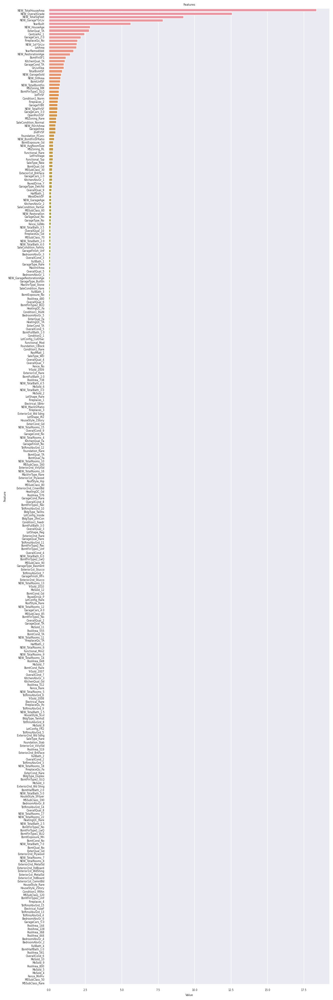

In [85]:
cat_final_model.fit(X, y)

plot_importance(cat_final_model, X)

In [86]:
cat_final_model.fit(X_train, y_train)
predictions = cat_final_model.predict(test_df.drop(["SalePrice"], axis=1))

In [87]:
predictions = np.expm1(predictions)

In [88]:
predictions.shape

(1459,)

In [89]:
important = pd.DataFrame({"Value": cat_final_model.feature_importances_, "Feature": X.columns})
unimportant = important[important["Value"] == (0|1|2|3|4)]["Feature"].to_list()
X_fix = X.drop(columns = unimportant)
rmse = np.mean(np.sqrt(-cross_val_score(cat_final_model, X_fix, y, cv=kf, scoring="neg_mean_squared_error")))
rmse

0.12418587051194618

## LGBM

In [90]:
lgbm_model = LGBMRegressor(random_state=46, objective = 'root_mean_squared_error', device = "gpu", verbose = -1)

rmse = np.mean(np.sqrt(-cross_val_score(lgbm_model, X, y, cv=kf, scoring="neg_mean_squared_error")))
rmse

1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.


0.1338605099423376

In [91]:
%%time
lgbm_params = {
    "learning_rate": [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1],
    "num_leaves": [20, 30, 40, 50, 60],
    "max_depth": [5, 10, 15]
}
lgbm_gs_best = GridSearchCV(lgbm_model,
                            lgbm_params,
                            cv=kf,
                            verbose=0).fit(X_train, y_train)

CPU times: user 34min 28s, sys: 2min 46s, total: 37min 14s
Wall time: 10min 56s


In [92]:
lgbm_gs_best.best_params_

{'learning_rate': 0.1, 'max_depth': 10, 'num_leaves': 20}

In [93]:
lgbm_final_model = lgbm_model.set_params(**lgbm_gs_best.best_params_).fit(X, y)

In [94]:
rmse = np.mean(np.sqrt(-cross_val_score(lgbm_final_model, X, y, cv=kf, scoring="neg_mean_squared_error")))
rmse

0.13146384556941043

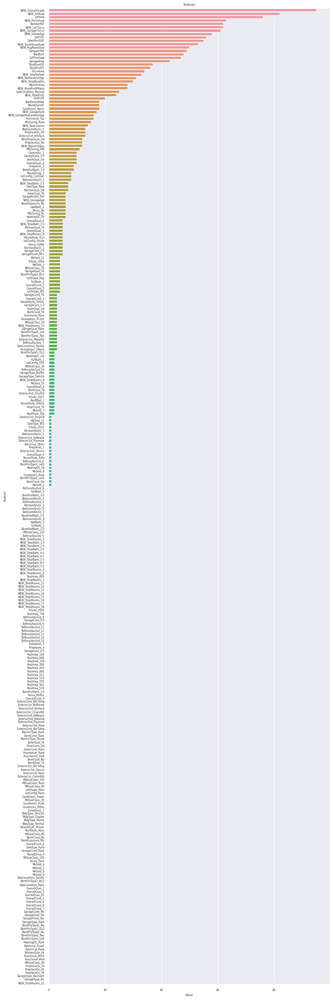

In [95]:
lgbm_final_model.fit(X, y)

plot_importance(lgbm_final_model, X)

In [96]:
lgbm_final_model.fit(X_train, y_train)
predictions = lgbm_final_model.predict(test_df.drop(["SalePrice"], axis=1))

In [97]:
predictions = np.expm1(predictions)

In [98]:
predictions[:10]

array([281183.27647755, 273659.08971301, 292631.62872583, 293072.04788043,
       271498.80523003, 281792.40248659, 276732.3585758 , 286557.3042083 ,
       329606.15922801, 306068.16070453])

# GBM

In [99]:
gbm_model = GradientBoostingRegressor(random_state=42)

rmse = np.mean(np.sqrt(-cross_val_score(gbm_model, X, y, cv=kf, scoring="neg_mean_squared_error")))
rmse

0.12593895300853608

In [100]:
%%time
gbm_params = {"learning_rate": [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1],
              "subsample": [1, 0.5, 0.7]}
gbm_gs_best = GridSearchCV(gbm_model,
                            gbm_params,
                            cv=kf,
                            n_jobs=-1,
                            verbose=False).fit(X_train, y_train)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


CPU times: user 1.93 s, sys: 326 ms, total: 2.26 s
Wall time: 1min 34s


In [101]:
gbm_gs_best.best_params_

{'learning_rate': 0.09, 'subsample': 0.5}

In [102]:
gbm_final_model = gbm_model.set_params(**gbm_gs_best.best_params_).fit(X, y)
rmse

0.12593895300853608

In [103]:
rmse = np.mean(np.sqrt(-cross_val_score(gbm_final_model, X, y, cv=kf, scoring="neg_mean_squared_error")))
rmse

0.13065329976756654

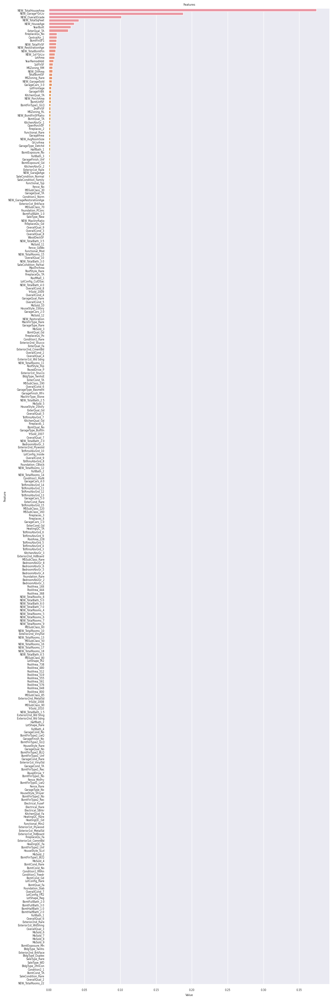

In [104]:
gbm_final_model.fit(X, y)

plot_importance(gbm_final_model, X)

In [105]:
gbm_final_model.fit(X_train, y_train)
predictions = gbm_final_model.predict(test_df.drop(["SalePrice"], axis=1))

In [106]:
predictions = np.expm1(predictions)
predictions[:10]

array([191436.02489186, 194138.43647005, 187332.46494508, 184852.20404565,
       188161.63231097, 292629.52571411, 207510.64250135, 288718.73631931,
       169730.95902913, 209094.55669994])

# CatBoost with Optuna

In [107]:
import optuna
def objective_cat(trial):
    """Define the objective function"""
    params = {
        'depth': trial.suggest_int('depth', 3, 12),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'iterations': trial.suggest_int('iterations', 400, 1500),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 0.01, 0.5),
        'subsample': trial.suggest_float('subsample', 0.3, 0.9),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.3, 0.8),
        'random_strength': trial.suggest_float('random_strength', 0.5, 1.0),
        'bagging_temperature': trial.suggest_float('bagging_temperature', 0.01, 0.5),
        'border_count': trial.suggest_int('border_count', 1, 255),
        'random_state': trial.suggest_categorical('random_state', [42]),
        'loss_function': trial.suggest_categorical('loss_function', ['RMSE'])}

    model_cat = CatBoostRegressor(**params, verbose = False)
    model_cat.fit(X_train, y_train)
    y_pred = model_cat.predict(X_test)
    return mean_squared_error(y_test,y_pred, squared=False)

In [108]:
study_cat = optuna.create_study(direction='minimize')
optuna.logging.set_verbosity(optuna.logging.WARNING)
study_cat.optimize(objective_cat, n_trials=50,show_progress_bar=True)

[I 2024-07-16 16:41:44,928] A new study created in memory with name: no-name-c9797ae6-51bf-44cf-a481-b7665eeec481


  0%|          | 0/50 [00:00<?, ?it/s]

In [109]:
print('Best parameters', study_cat.best_params)

Best parameters {'depth': 6, 'learning_rate': 0.01061403490080105, 'iterations': 1304, 'l2_leaf_reg': 0.4896710916421453, 'subsample': 0.32085620048387875, 'colsample_bylevel': 0.6155772294238875, 'random_strength': 0.9107113464884462, 'bagging_temperature': 0.3933877142451252, 'border_count': 204, 'random_state': 42, 'loss_function': 'RMSE'}


In [110]:
cat = CatBoostRegressor(**study_cat.best_params, verbose = False)
cat.fit(X_train, y_train)
y_pred = cat.predict(X_test)

print('Error: ', mean_squared_error(y_test,y_pred, squared=False))

Error:  0.12049448709801432


# Voting Regressor

In [111]:
%%capture
!pip install sklego

In [112]:
from sklego.linear_model import LADRegression
models = pd.DataFrame()
models["cat"] = cat.predict(X_test)   
models["lgbm"] = lgbm_model.predict(X_test)
models["gbm"] = gbm_model.predict(X_test)
weights = LADRegression().fit(models, y_test).coef_
pd.DataFrame(weights, index = models.columns, columns = ["weights"])

,weights
cat,0.779
lgbm,0.264
gbm,-0.063


In [113]:
from sklearn.ensemble import VotingRegressor
voting = VotingRegressor(estimators=[ ('cat', cat),
                                      ('lgbm', lgbm_final_model), 
                                      ('gbm', gbm_final_model)],weights=weights)
voting.fit(X_train,y_train)
voting_pred = voting.predict(X_test)

print('Error: ', mean_squared_error(y_test,y_pred, squared=False))

Error:  0.12049448709801432


In [114]:
vot_predictions = voting.predict(test_df.drop(["SalePrice"], axis=1))

In [115]:
vot_predictions = np.expm1(vot_predictions)
vot_predictions

array([272118.06404388, 273500.94074632, 293378.03431905, ...,
       298728.76770479, 238120.74557927, 309733.0830636 ])

# LazyPredict

In [116]:
%%capture
! pip install lazypredict

In [117]:
from lazypredict.Supervised import LazyRegressor

reg = LazyRegressor(ignore_warnings=True,
                        custom_metric=None,
                        predictions=False,
                        random_state=42,
                        regressors='all')

models, predictions = reg.fit(X_train, X_test, y_train, y_test)
models.sort_values(by='RMSE', ascending=True, inplace=True)
print(models[:10])

100%|██████████| 42/42 [10:58<00:00, 15.67s/it]

                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ElasticNetCV                                -8.64       0.90  0.13        2.07
LassoCV                                     -8.66       0.90  0.13        2.64
LassoLarsCV                                 -8.79       0.90  0.13        0.42
LassoLarsIC                                 -8.79       0.90  0.13        0.15
LGBMRegressor                               -9.00       0.90  0.13        0.36
HistGradientBoostingRegressor               -9.12       0.90  0.13        1.21
OrthogonalMatchingPursuit                   -9.21       0.89  0.13        0.04
GradientBoostingRegressor                   -9.34       0.89  0.13        1.20
OrthogonalMatchingPursuitCV                 -9.34       0.89  0.13        0.20
TweedieRegressor                            -9.86       0.89  0.13        0.57


# <div style="border-radius:10px; border:#5E5772 solid; padding: 12px; background-color: #2995; font-size:100%; font-family:Comic Sans MS; font-family:Comic Sans MS; text-align:center"> ANN </div>

In [118]:
y_ann = train_df['SalePrice']
X_ann = train_df.drop(["SalePrice"], axis=1)

In [119]:
y = np.log1p(y_ann)
X = X_ann.copy()

In [120]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

In [121]:
rb = RobustScaler()
X_train = rb.fit_transform(X_train)
X_test = rb.transform(X_test)

In [122]:
X_train

array([[-1.35      , -1.56117733,  0.69473684, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.4       ,  0.1313549 ,  0.04210526, ...,  0.        ,
         0.        ,  0.        ],
       [-0.5       , -0.1313549 , -0.69473684, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [-0.5       , -0.34736074, -0.35789474, ...,  0.        ,
         0.        ,  0.        ],
       [-0.75      , -0.47628314, -1.13684211, ...,  0.        ,
         0.        ,  0.        ],
       [-0.85      , -1.43906592,  0.73684211, ...,  0.        ,
         0.        ,  0.        ]])

In [123]:
X_train.shape

(1095, 288)

In [124]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(512, input_shape=(X_train.shape[1],), activation="relu"),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dropout(0.3),

    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dropout(0.4),

    tf.keras.layers.Dense(8, activation="relu"),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(2, activation="relu"),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Dense(1, activation="linear")
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.009),
              loss='mse',
              metrics=[tf.keras.metrics.RootMeanSquaredError()])

early_stopping = tf.keras.callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    restore_best_weights=True)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath='./model.keras',
    save_weights_only=False,
    monitor='val_mse',
    mode='auto',
    save_best_only=True)

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               147968    
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 128)               65664     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_2 (Dense)             (None, 32)                4128      
                                                                 
 dropout_2 (Dropout)         (None, 32)                0         
                                                                 
 dense_3 (Dense)             (None, 8)                 2

In [125]:
history = model.fit(X_train, y_train, epochs=150, batch_size=16, validation_split=0.2, callbacks=[early_stopping, checkpoint])

Epoch 1/150
55/55 [==============================] - 4s 9ms/step - loss: 63.1632 - root_mean_squared_error: 7.9475 - val_loss: 5.6247 - val_root_mean_squared_error: 2.3716
Epoch 2/150
55/55 [==============================] - 0s 5ms/step - loss: 47.0166 - root_mean_squared_error: 6.8569 - val_loss: 22.6055 - val_root_mean_squared_error: 4.7545
Epoch 3/150
55/55 [==============================] - 0s 5ms/step - loss: 40.4863 - root_mean_squared_error: 6.3629 - val_loss: 37.4452 - val_root_mean_squared_error: 6.1192
Epoch 4/150
55/55 [==============================] - 0s 5ms/step - loss: 38.2175 - root_mean_squared_error: 6.1820 - val_loss: 20.3801 - val_root_mean_squared_error: 4.5144
Epoch 5/150
55/55 [==============================] - 0s 5ms/step - loss: 32.4042 - root_mean_squared_error: 5.6925 - val_loss: 23.6724 - val_root_mean_squared_error: 4.8654
Epoch 6/150
55/55 [==============================] - 0s 5ms/step - loss: 29.1323 - root_mean_squared_error: 5.3974 - val_loss: 15.8760 -

In [126]:
loss_and_metrics = model.evaluate(X_test, y_test)
print(loss_and_metrics)
print('Loss = ',loss_and_metrics[0])
print('RMSE = ',loss_and_metrics[1])

12/12 [==============================] - 0s 2ms/step - loss: 4.9488 - root_mean_squared_error: 2.2246
[4.948846340179443, 2.224600315093994]
Loss =  4.948846340179443
RMSE =  2.224600315093994


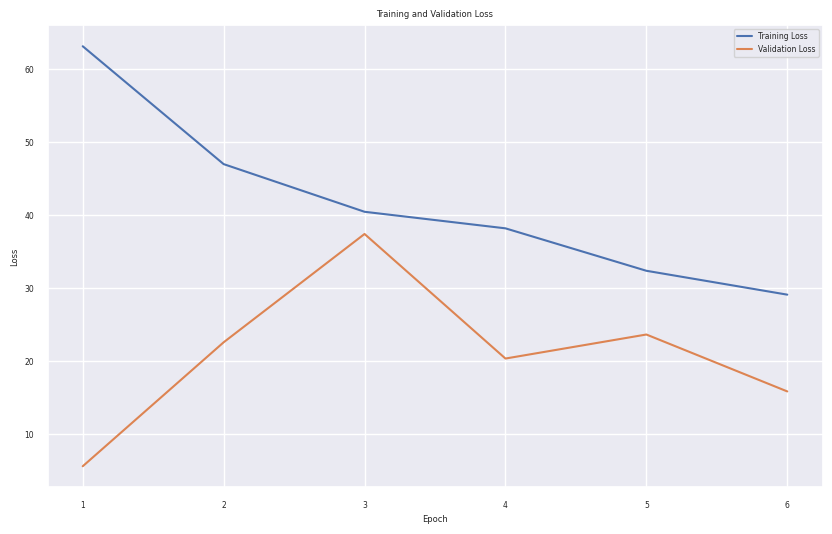

In [127]:
plt.figure(figsize=(10, 6))

train_loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(train_loss) + 1) 

plt.plot(epochs, train_loss, label="Training Loss")
plt.plot(epochs, val_loss, label="Validation Loss")

plt.title("Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.show()

In [128]:
y_pred = model.predict(X_test)
y_pred[:10]

12/12 [==============================] - 0s 2ms/step


array([[ 8.459308 ],
       [ 9.915025 ],
       [ 9.40542  ],
       [ 8.360317 ],
       [ 8.662795 ],
       [ 8.739237 ],
       [11.112094 ],
       [ 8.6039295],
       [ 9.971309 ],
       [10.721719 ]], dtype=float32)

In [129]:
y_test_df = pd.DataFrame({'Actual_Value': y_test.values})
y_pred_df = pd.DataFrame({'Predicted_Value': y_pred.flatten()})
result_df = pd.concat([y_test_df, y_pred_df], axis=1)
result_df

,Actual_Value,Predicted_Value
0,11.95,8.46
1,12.69,9.92
2,11.65,9.41
3,11.98,8.36
4,12.66,8.66
...,...,...
360,12.18,10.10
361,11.70,10.43
362,12.34,10.77
363,12.42,10.31


In [130]:
mean_squared_error(y_test_df, y_pred_df, squared = False)

2.224600134436037

In [131]:
test_df

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,SalePrice,NEW_1st*GrLiv,NEW_Garage*GrLiv,NEW_TotalFlrSF,NEW_TotalBsmtFin,NEW_PorchArea,NEW_TotalHouseArea,NEW_TotalSqFeet,NEW_MasVnrRatio,NEW_DifArea,NEW_OverallGrade,NEW_Restoration,NEW_HouseAge,NEW_RestorationAge,NEW_GarageAge,NEW_GarageRestorationAge,NEW_GarageSold,NEW_BsmtFinSFRatio,NEW_AvgRoomSize,MSSubClass_30,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_190,MSSubClass_Rare,MSZoning_RL,MSZoning_RM,MSZoning_Rare,LotShape_IR2,LotShape_Rare,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,LotConfig_Rare,Condition1_Feedr,Condition1_Norm,Condition1_PosN,Condition1_RRAn,Condition1_Rare,Condition2_1,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Rare,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Hip,RoofStyle_Rare,RoofMatl_1,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Rare,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Rare,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_Rare,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Gd,ExterCond_Rare,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Rare,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Rare,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Rare,HeatingQC_TA,CentralAir_1,Electrical_FuseF,Electrical_Rare,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min2,Functional_Mod,Functional_Rare,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Basment,GarageType_BuiltIn,GarageType_Detchd,GarageType_No,GarageType_Rare,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_No,GarageQual_Rare,GarageQual_TA,GarageCond_No,GarageCond_Rare,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_No,Fence_Rare,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,SaleType_New,SaleType_Rare,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_Rare,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,BsmtFullBath_1.0,BsmtFullBath_2.0,BsmtFullBath_3.0,BsmtHalfBath_1.0,BsmtHalfBath_2.0,FullBath_1,FullBath_2,FullBath_3,FullBath_4,HalfBath_1,HalfBath_2,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenAbvGr_1,KitchenAbvGr_2,KitchenAbvGr_3,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_13,TotRmsAbvGrd_14,TotRmsAbvGrd_15,Fireplaces_1,Fireplaces_2,Fireplaces_3,Fireplaces_4,GarageCars_1.0,GarageCars_2.0,GarageCars_3.0,GarageCars_4.0,GarageCars_5.0,PoolArea_144,PoolArea_228,PoolArea_368,PoolArea_444,PoolArea_480,PoolArea_512,PoolArea_519,PoolArea_555,PoolArea_561,PoolArea_576,PoolArea_648,PoolArea_738,PoolArea_800,YrSold_2007,YrSold_2008,YrSold_2009,YrSold_2010,NEW_TotalBath_1.5,NEW_TotalBath_2.0,NEW_TotalBath_2.5,NEW_TotalBath_3.0,NEW_TotalBath_3.5,NEW_TotalBath_4.0,NEW_TotalBath_4.5,NEW

In [132]:
test_df2 = rb.fit_transform(test_df.drop(["SalePrice"], axis = 1))

In [133]:
test_df2

array([[ 0.5       ,  0.5387132 , -0.25      , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.55      ,  1.17969223, -0.3125    , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.2       ,  1.07379135,  0.5       , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 4.5       ,  2.56900521, -0.27083333, ...,  0.        ,
         0.        ,  0.        ],
       [-0.4       ,  0.25251424,  0.39583333, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.2       ,  0.05525264,  0.41666667, ...,  0.        ,
         0.        ,  0.        ]])

In [134]:
predictions = model.predict(test_df2)
predictions = np.expm1(predictions)

46/46 [==============================] - 0s 2ms/step
